In [2]:
# Imports
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [3]:
# Funções

In [4]:
# Funcao simples para ler e carregar o arquivo do trimestre para um dataframe
def carregaTrimestre(fileName):
    dir = 'D:\TCC\PNAD\CSV\\'

    fullPath = dir+fileName

    df_trimestre = pd.read_csv(fullPath, encoding="Latin 1", sep= ",", decimal='.')                  

    return df_trimestre

# Grafico barra exibindo variavel por genero e idade
def graficoPorGeneroIdade(dfSexoIdade, label):

    #dfSexoIdade = dfSexoIdade.fillna(-1) 
    dfSexoMascIdade = dfSexoIdade[dfSexoIdade['V2007'] == 1] 
    dfSexoFemIdade = dfSexoIdade[dfSexoIdade['V2007'] == 2] 

    s_grupoIdadeMasc = pd.cut( dfSexoMascIdade['V2009'], [0,20,30,40,50,65,120]).value_counts().sort_index()
    s_grupoIdadeFem  = pd.cut( dfSexoFemIdade['V2009'], [0,20,30,40,50,65,120]).value_counts().sort_index()
    
    s_grupoIdadeFem.index={'Até 20 anos':'(0, 20]' 
              ,'20 a 30 anos':'(20, 30]'
              ,'30 a 40 anos':'(30, 40]'
              ,'40 a 50 anos':'(40, 50]'
              ,'50 a 65 anos':'(50, 65]'
              ,'65 ou mais anos':'(65, 120]'} 
    s_grupoIdadeMasc.index={'Até 20 anos':'(0, 20]' 
              ,'20 a 30 anos':'(20, 30]'
              ,'30 a 40 anos':'(30, 40]'
              ,'40 a 50 anos':'(40, 50]'
              ,'50 a 65 anos':'(50, 65]'
              ,'65 ou mais anos':'(65, 120]'} 

    N = 6

    ind = np.arange(N) 
    width = 0.40  
    fig = plt.figure()
    ax = fig.add_subplot(111)
    rects1 = ax.bar(ind, s_grupoIdadeMasc, width, color='deepskyblue')

    #womenMeans = (25, 32, 34, 20, 25)
    #womenStd =   (3, 5, 2, 3, 3)
    rects2 = ax.bar(ind+width, s_grupoIdadeFem, width, color='aquamarine')


    ax.set_ylabel('Total')
    ax.set_title(label)
    ax.set_xticks(ind + width / 2)
    ax.set_xticklabels( s_grupoIdadeMasc.index )

    plt.xticks(rotation=90)

    ax.legend( (rects1[0], rects2[0]), ('Masculino', 'Feminino') )
    
    ax.bar_label(ax.containers[0], label_type='edge', color='black', rotation=0, fontsize=6, padding=2)
    ax.bar_label(ax.containers[1], label_type='edge', color='black', rotation=0, fontsize=6, padding=2)
    plt.show()

# Grafico pizza por genero
def graficoPorGenero(serie, label):
    
    # Ocupados por sexo
    sOcupadosPorSexo = serie['V2007']
    c_OcupadosPorSexo = sOcupadosPorSexo.value_counts()
    c_OcupadosPorSexo = c_OcupadosPorSexo.rename({1: 'Masculino', 2: 'Feminino'})
    
    colors = {'Masculino': 'deepskyblue', 'Feminino': 'aquamarine'}
    
    #plt.style.use('seaborn-pastel')
    plt.pie(c_OcupadosPorSexo.values, labels  = c_OcupadosPorSexo.index,
            autopct= '%1.1f%%', textprops={'fontsize':16}, colors=[colors[key] for key in c_OcupadosPorSexo.index])
    plt.axis("image")
    plt.title(label, fontsize=18)
    plt.show()

# Grafico pizza por grau de instrucao e genero
def graficoInstrucaoPorGenero(df, label):
    
    s_Genero  = df['V2007']
    genero_count = s_Genero.value_counts()

    genero_count = genero_count.rename({1: 'Masculino', 2: 'Feminino'})
    #labels = ['Homem', 'Mulher']
    colors = {'Masculino': 'deepskyblue', 'Feminino': 'aquamarine'}

    #plt.style.use('seaborn-pastel')
    plt.pie(genero_count.values, labels  = genero_count.index,
            autopct= '%1.1f%%', textprops={'fontsize':16}, colors=[colors[key] for key in genero_count.index])
    plt.axis("image")
    plt.title(label, fontsize=18)
    plt.show()

def graficoEntrevistadosPorIdade(dfTrimestre, label):
    
    s_idade_entrevistados = dfTrimestre['V2009']
    s_count_idade = s_idade_entrevistados.value_counts()
    s_grupoIdade = pd.cut(s_idade_entrevistados, [0,20,30,40,50,65,120]).value_counts().sort_index()

    s_grupoIdade.index={
                        #'13 anos ou menos':'(0, 13]'
              'Até 20 anos':'(0, 20]' 
              ,'20 a 30 anos':'(20, 30]'
              ,'30 a 40 anos':'(30, 40]'
              ,'40 a 50 anos':'(40, 50]'
              ,'50 a 65 anos':'(50, 65]'
              ,'65 ou mais anos':'(65, 120]'} 

    ax = s_grupoIdade.plot(kind='bar', color='gold')
    ax.set_title(label)
    plt.bar_label(ax.containers[0], label_type='edge', color='black', rotation=0, fontsize=6, padding=2)
    
    plt.show()

def graficoGrauInstrucao(dfPeriodo, label):
    
    s_instrucao = dfPeriodo['VD3004']
    s_count_instrucao = s_instrucao.value_counts().sort_index()


    s_count_instrucao.index={'Sem instrução e menos de 1 ano de estudo':'1.0'
              ,'Fundamental incompleto ou equiv.':'2.0' 
              ,'Fundamental completo ou equiv.':'3.0'
              ,'Médio incompleto ou equiv.':'4.0'
              ,'Médio completo ou equiv.':'5.0'
              ,'Superior incompleto ou equiv.':'6.0'
              ,'Superior completo':'7.0'} 

    ax = s_count_instrucao.plot(kind='bar', color='gold')
    plt.bar_label(ax.containers[0], label_type='edge', color='black', rotation=0, fontsize=6, padding=2)
    
    plt.show()

def graficoInstrucaoSexo(dfTrimestre, label):
    
  #dfSexoIdade = dfSexoIdade.fillna(-1) 
    
    idx = {'Sem instrução e menos de 1 ano de estudo':'1.0'
              ,'Fundamental incompleto ou equiv.':'2.0' 
              ,'Fundamental completo ou equiv.':'3.0'
              ,'Médio incompleto ou equiv.':'4.0'
              ,'Médio completo ou equiv.':'5.0'
              ,'Superior incompleto ou equiv.':'6.0'
              ,'Superior completo':'7.0'} 
    
    dfSexoMascIdade = dfTrimestre[dfTrimestre['V2007'] == 1] 
    dfSexoFemIdade = dfTrimestre[dfTrimestre['V2007'] == 2] 

    s_grupoEstMasc =  dfSexoMascIdade['VD3004'].value_counts().sort_index()
    #pd.cut( dfSexoMascIdade['V2009'], [0,14,20,30,40,50,65,120]).value_counts().sort_index()
    s_grupoEstFem  =  dfSexoFemIdade['VD3004'].value_counts().sort_index()
    #pd.cut( dfSexoFemIdade['V2009'], [0,14,20,30,40,50,65,120]).value_counts().sort_index()
    
    

    s_grupoEstMasc.index= idx
    s_grupoEstFem.index= idx

    N = 7
    ind = np.arange(N) 
    width = 0.40  

    fig = plt.figure()
    ax = fig.add_subplot(111)
    rects1 = ax.bar(ind, s_grupoEstMasc, width, color='deepskyblue')

    #womenMeans = (25, 32, 34, 20, 25)
    #womenStd =   (3, 5, 2, 3, 3)
    rects2 = ax.bar(ind+width, s_grupoEstFem, width, color='aquamarine')


    ax.set_ylabel('Total')
    ax.set_title(label)
    ax.set_xticks(ind + width / 2)
    ax.set_xticklabels( s_grupoEstMasc.index )

    plt.xticks(rotation=90)

    ax.legend( (rects1[0], rects2[0]), ('Masc', 'Fem') )
    
    ax.bar_label(ax.containers[0], label_type='edge', color='black', rotation=0, fontsize=6, padding=2)
    ax.bar_label(ax.containers[1], label_type='edge', color='black', rotation=0, fontsize=6, padding=2)
    plt.show()
    
    
def ocupacao(dfPeriodo):
    
    s_Ocupados = dfPeriodo[dfPeriodo['VD4002'] == 1.0]
    s_Desocupados = dfPeriodo[dfPeriodo['VD4002'] == 2.0]
    
    return s_Ocupados,s_Desocupados
    
def graficoOcupacao(dfPeriodo, label):
    
    dfPeriodo = dfPeriodo.fillna(-1)
    
    colors = {'Ocupados': 'deepskyblue', 'Desocupados': 'aquamarine'}
    
    # Ocupação comparativo total
    
    s_ocupacaoTotal = dfPeriodo['VD4002']
    c_ocupacaoTotal = s_ocupacaoTotal.value_counts()
    c_ocupacaoTotal = c_ocupacaoTotal.rename({1: 'Ocupados', 2: 'Desocupados'})
    #plt.style.use('seaborn-pastel')
    plt.pie(c_ocupacaoTotal.values, labels  = c_ocupacaoTotal.index,
            autopct= '%1.1f%%', textprops={'fontsize':16}, colors=[colors[key] for key in c_ocupacaoTotal.index])
    plt.axis("image")
    plt.title("Condição de ocupação entrevistados - Total "+label, fontsize=18)
    plt.show()
    
    # Ocupação perc mesmo Sexo
    s_Homens = dfPeriodo[dfPeriodo['V2007'] == 1]
    s_Mulheres = dfPeriodo[dfPeriodo['V2007'] == 2]
    
    s_ocupacaoHomens = s_Homens['VD4002']
    c_ocupacaoHomens = s_ocupacaoHomens.value_counts()
    c_ocupacaoHomens = c_ocupacaoHomens.rename({1: 'Ocupados', 2: 'Desocupados'})
    #plt.style.use('seaborn-pastel')
    plt.pie(c_ocupacaoHomens.values, labels  = c_ocupacaoHomens.index,
            autopct= '%1.1f%%', textprops={'fontsize':16}, colors=[colors[key] for key in c_ocupacaoHomens.index])
    plt.axis("image")
    plt.title("Condição de ocupação - Gênero masculino "+label, fontsize=18)
    plt.show()
    
    colors = {'Ocupadas': 'deepskyblue', 'Desocupadas': 'aquamarine'}
    
    s_ocupacaoMulheres = s_Mulheres['VD4002']
    c_ocupacaoMulheres = s_ocupacaoMulheres.value_counts()
    c_ocupacaoMulheres = c_ocupacaoMulheres.rename({1: 'Ocupadas', 2: 'Desocupadas'})
    #plt.style.use('seaborn-pastel')
    plt.pie(c_ocupacaoMulheres.values, labels  = c_ocupacaoMulheres.index,
            autopct= '%1.1f%%', textprops={'fontsize':16}, colors=[colors[key] for key in c_ocupacaoMulheres.index])
    plt.axis("image")
    plt.title("Condição de ocupação - Gênero feminino "+label, fontsize=18)
    plt.show()
    
    # Ocupação comparativo perc entre sexos
    graficoOcupacaoSexo(dfPeriodo, label)
    

def graficoOcupacaoSexo(dfTrimestre, label):
    ocupados, desocupados = ocupacao(dfTrimestre)
    
    colors = {'Masculino': 'deepskyblue', 'Feminino': 'aquamarine'}
    
    sOcupadosPorSexo = ocupados['V2007']
    c_OcupadosPorSexo = sOcupadosPorSexo.value_counts()
    c_OcupadosPorSexo = c_OcupadosPorSexo.rename({1: 'Masculino', 2: 'Feminino'})
    #plt.style.use('seaborn-pastel')
    plt.pie(c_OcupadosPorSexo.values, labels  = c_OcupadosPorSexo.index,
            autopct= '%1.1f%%', textprops={'fontsize':16}, colors=[colors[key] for key in c_OcupadosPorSexo.index])
    plt.axis("image")
    plt.title("Condição de ocupação - Ocupados por gênero "+label, fontsize=18)
    plt.show()

    sDesocupadasPorSexo = desocupados['V2007']
    c_DesocupadasPorSexo = sDesocupadasPorSexo.value_counts()
    c_DesocupadasPorSexo = c_DesocupadasPorSexo.rename({1: 'Masculino', 2: 'Feminino'})
    #plt.style.use('seaborn-pastel')
    plt.pie(c_DesocupadasPorSexo.values, labels  = c_DesocupadasPorSexo.index,
            autopct= '%1.1f%%', textprops={'fontsize':16}, colors=[colors[key] for key in c_DesocupadasPorSexo.index])
    plt.axis("image")
    plt.title("Condição de ocupação - Desocupados por gênero "+label, fontsize=18)
    plt.show()

def graficoOcupadosInstrucao(dfTrimestre, label):
    
    ocupados, desocupados = ocupacao(df_ano)
    
    s_grupoOcupados = pd.cut( ocupados['VD3004'], [0,1.0,2.0,3.0,4.0,5.0,6.0,7.0]).value_counts().sort_index()
    s_grupoDesocupados  = pd.cut( desocupados['VD3004'], [0,1.0,2.0,3.0,4.0,5.0,6.0,7.0]).value_counts().sort_index()

    idx = {'Sem instrução e menos de 1 ano de estudo':'(0.0, 1.0]'
              ,'Fundamental incompleto ou equiv.':'(1.0, 2.0]' 
              ,'Fundamental completo ou equiv.':'(2.0, 3.0]'
              ,'Médio incompleto ou equiv.':'(3.0, 4.0]'
              ,'Médio completo ou equiv.':'(4.0, 5.0]'
              ,'Superior incompleto ou equiv.':'(5.0, 6.0]'
              ,'Superior completo':'(6.0, 7.0]'} 


    s_grupoOcupados.index= idx
    s_grupoOcupados.index= idx

    N = 7
    ind = np.arange(N) 
    width = 0.40  

    fig = plt.figure()
    ax = fig.add_subplot(111)
    rects1 = ax.bar(ind, s_grupoOcupados, width, color='deepskyblue')
    rects2 = ax.bar(ind+width, s_grupoDesocupados, width, color='aquamarine')


    ax.set_ylabel('Total')
    ax.set_title(label)
    ax.set_xticks(ind + width / 2)
    ax.set_xticklabels( s_grupoOcupados.index )

    plt.xticks(rotation=90)

    ax.legend( (rects1[0], rects2[0]), ('Ocupados', 'Desocupados') )

    ax.bar_label(ax.containers[0], label_type='edge', color='black', rotation=0, fontsize=6, padding=2)
    ax.bar_label(ax.containers[1], label_type='edge', color='black', rotation=0, fontsize=6, padding=2)
    plt.show()   
    
def instrucao(dfTrimestre):
    #VD3004
    df_SemInstrucao = dfTrimestre[dfTrimestre['VD3004'] == 1]
    df_FundamentalIncompleto = dfTrimestre[dfTrimestre['VD3004'] == 2]
    df_FundamentalCompleto = dfTrimestre[dfTrimestre['VD3004'] == 3]
    df_MedioIncompleto = dfTrimestre[dfTrimestre['VD3004'] == 4]
    df_MedioCompleto = dfTrimestre[dfTrimestre['VD3004'] == 5]
    df_SupIncompleto = dfTrimestre[dfTrimestre['VD3004'] == 6]
    df_SupCompleto = dfTrimestre[dfTrimestre['VD3004'] == 7]
    
    return df_SemInstrucao,df_FundamentalIncompleto, df_FundamentalCompleto,  df_MedioIncompleto,  df_MedioCompleto, df_SupIncompleto, df_SupCompleto

def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

def graficoAgrupado(df_ano):

    categories = ["1o tri","2o tri", "3o tri", "4o tri"]
    index = len(categories)
    x = np.arange(index)

    width = 0.35

    primeiroTri = df_ano[df_ano['trimestre'] == 1]['V2007'].value_counts().rename({1: 'Masculino', 2: 'Feminino'})
    segundoTri = df_ano[df_ano['trimestre'] == 2]['V2007'].value_counts().rename({1: 'Masculino', 2: 'Feminino'})
    terceiroTri = df_ano[df_ano['trimestre'] == 3]['V2007'].value_counts().rename({1: 'Masculino', 2: 'Feminino'})
    quartoTri = df_ano[df_ano['trimestre'] == 4]['V2007'].value_counts().rename({1: 'Masculino', 2: 'Feminino'})

    l_masculino = [primeiroTri.Masculino
                  ,segundoTri.Masculino
                  ,terceiroTri.Masculino
                  ,quartoTri.Masculino]
    l_feminino = [primeiroTri.Feminino
                  ,segundoTri.Feminino
                  ,terceiroTri.Feminino
                  ,quartoTri.Feminino]
    fig, ax = plt.subplots()
    bar1 = ax.bar(x - width/2, l_masculino, width, color='deepskyblue', label='Masculino')
    bar2 = ax.bar(x + width/2,  l_feminino, width, color='aquamarine', label='Feminino')

    ax.set_xlabel('Trimestres')
    ax.set_ylabel('Entrevistados')
    ax.set_title('Número de Respostas por Trimestre e Gênero (Agrupado)')
    ax.set_xticks(x)
    ax.set_xticklabels(categories)
    ax.legend(bbox_to_anchor=(1, 1), loc='upper left')

    line_values = [
        primeiroTri.Masculino - primeiroTri.Feminino
        , segundoTri.Masculino - segundoTri.Feminino
        , terceiroTri.Masculino - terceiroTri.Feminino
        , quartoTri.Masculino - quartoTri.Feminino
    ]

    autolabel(bar1)
    autolabel(bar2)

    plt.show()






In [5]:
# Primeiro trimestre
## Carregando arquivo
dir = 'D:\TCC\PNAD\CSV\\'
fileName = 'PNADC_012022_vd.csv'

fullPath = dir+fileName

df_primeiroTri = pd.read_csv(fullPath, encoding="Latin 1", sep= ",", decimal='.')

In [6]:
df_primeiroTri.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 475193 entries, 0 to 475192
Data columns (total 28 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Unnamed: 0  475193 non-null  int64  
 1   V2007       475193 non-null  int64  
 2   V2009       475193 non-null  int64  
 3   V3002       447473 non-null  float64
 4   V3008       336333 non-null  float64
 5   V3003A      111140 non-null  float64
 6   V3006       101431 non-null  float64
 7   V3006A      278 non-null     float64
 8   V3009A      315306 non-null  float64
 9   V3014       304842 non-null  float64
 10  V3010       88064 non-null   float64
 11  V3012       293533 non-null  float64
 12  V3013B      199 non-null     float64
 13  V3013A      377 non-null     float64
 14  V3013       285100 non-null  float64
 15  V3005A      16528 non-null   float64
 16  V3011A      43193 non-null   float64
 17  V3007       16528 non-null   float64
 18  V4009       197120 non-null  float64
 19  V4

In [7]:
# Iniciando tratamenos com a variavel VD4002 (Condição de ocupação)
# Verificando os valores que existem para a variavel
df_primeiroTri['VD4002'].unique()

array([ 1.,  2., nan])

In [8]:
# Reduzindo o dataframe apenas para os entrevistados ocupados e desocupados, desconsiderando os não aplicáveis
df_PrimeiroTriFiltrado = df_primeiroTri[(df_primeiroTri['VD4002'] == 1.0) | (df_primeiroTri['VD4002'] == 2.0)]
df_PrimeiroTriFiltrado['VD4002'].unique()

array([1., 2.])

In [9]:
df_PrimeiroTriFiltrado.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 220306 entries, 0 to 475189
Data columns (total 28 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Unnamed: 0  220306 non-null  int64  
 1   V2007       220306 non-null  int64  
 2   V2009       220306 non-null  int64  
 3   V3002       220306 non-null  float64
 4   V3008       197180 non-null  float64
 5   V3003A      23126 non-null   float64
 6   V3006       20412 non-null   float64
 7   V3006A      116 non-null     float64
 8   V3009A      192427 non-null  float64
 9   V3014       187497 non-null  float64
 10  V3010       52524 non-null   float64
 11  V3012       179478 non-null  float64
 12  V3013B      64 non-null      float64
 13  V3013A      166 non-null     float64
 14  V3013       175954 non-null  float64
 15  V3005A      11524 non-null   float64
 16  V3011A      33248 non-null   float64
 17  V3007       11524 non-null   float64
 18  V4009       197120 non-null  float64
 19  V4

In [10]:
# Verificando a variavel VD3004 (Nivel de instrução)
df_PrimeiroTriFiltrado['VD3004'].unique()

array([4., 3., 7., 5., 6., 2., 1.])

In [11]:
# Filtrando apenas os campos necessários para as análises
df_primeiroTriFinal = df_PrimeiroTriFiltrado.loc[:, ['V2007', 'V2009', 'VD4002', 'VD3004']]
df_primeiroTriFinal

,V2007,V2009,VD4002,VD3004
0,2,45,1.0,4.0
1,1,26,2.0,4.0
2,1,18,2.0,3.0
3,2,22,2.0,4.0
9,1,50,1.0,7.0
...,...,...,...,...
475181,1,56,1.0,1.0
475182,1,48,1.0,7.0
475185,1,33,1.0,5.0
475186,2,36,1.0,7.0


In [12]:
df_primeiroTriFinal.isnull().sum()

V2007     0
V2009     0
VD4002    0
VD3004    0
dtype: int64

In [13]:
df_primeiroTriFinal['trimestre'] = 1

In [14]:
# Verificação de valores
df_genero = df_primeiroTriFinal['V2007']
genero_entrevistados = df_genero.value_counts()
genero_entrevistados.info()

<class 'pandas.core.series.Series'>
Int64Index: 2 entries, 1 to 2
Series name: V2007
Non-Null Count  Dtype
--------------  -----
2 non-null      int64
dtypes: int64(1)
memory usage: 32.0 bytes


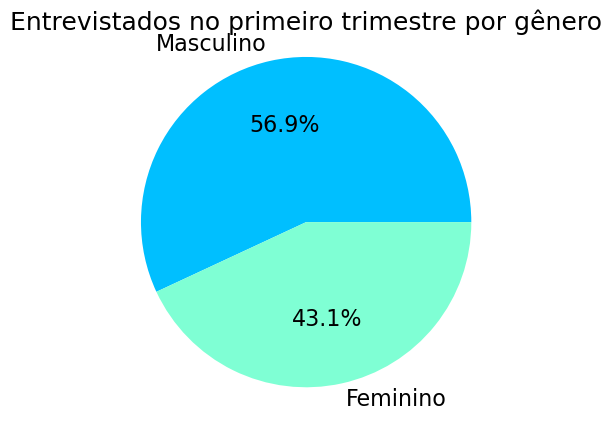

In [15]:
# Grafico de entrevistados por genero
graficoPorGenero(df_primeiroTriFinal, 'Entrevistados no primeiro trimestre por gênero')

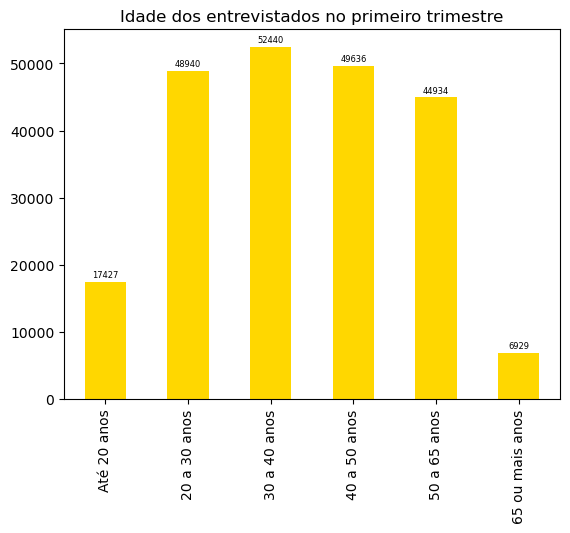

In [16]:
# Grafico por idade 
graficoEntrevistadosPorIdade(df_primeiroTriFinal, 'Idade dos entrevistados no primeiro trimestre')

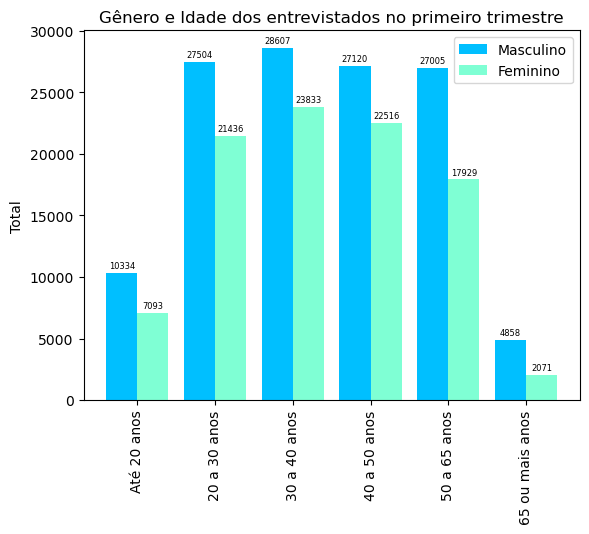

In [17]:
# Grafico por genero e idade
graficoPorGeneroIdade(df_primeiroTriFinal, 'Gênero e Idade dos entrevistados no primeiro trimestre')

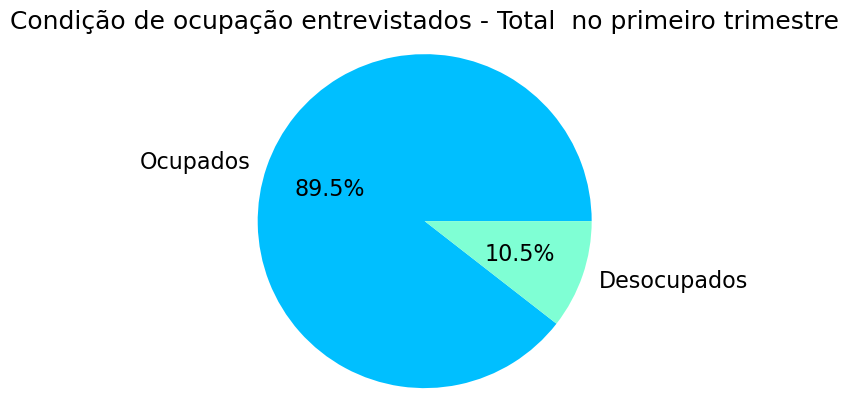

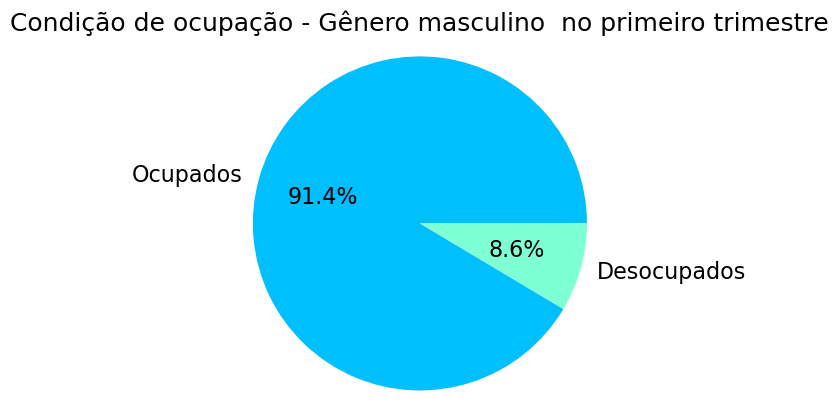

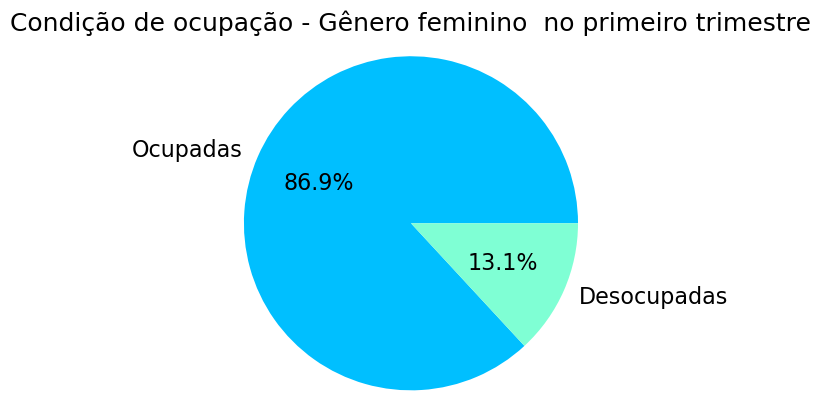

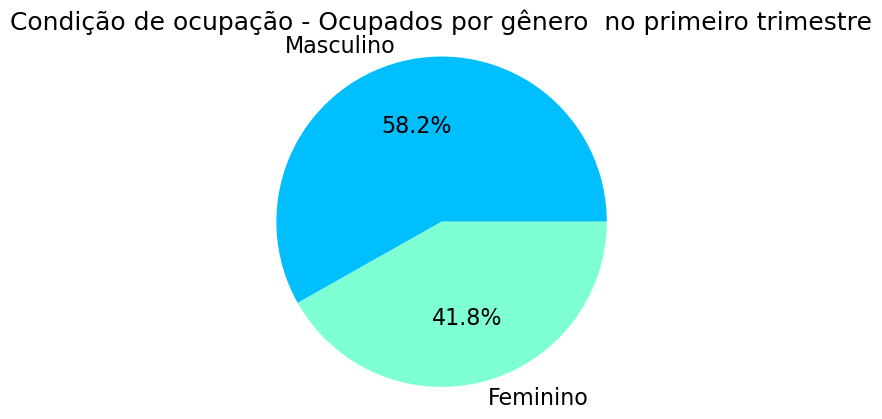

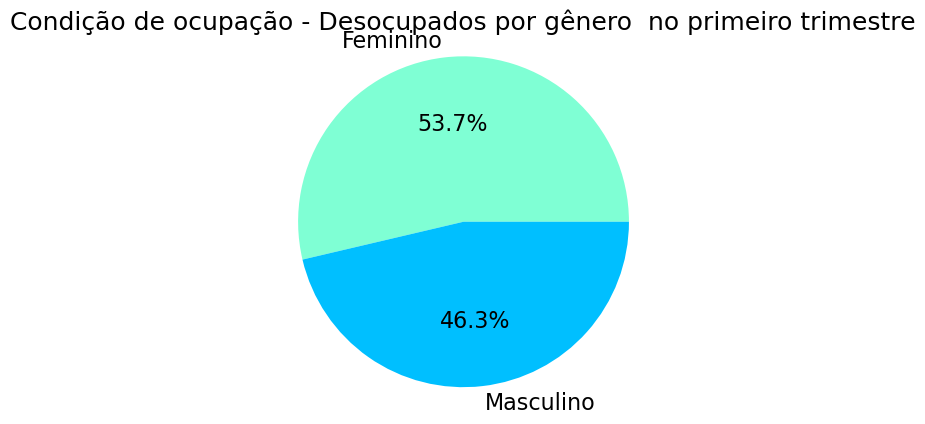

In [18]:
graficoOcupacao(df_primeiroTriFinal, ' no primeiro trimestre')

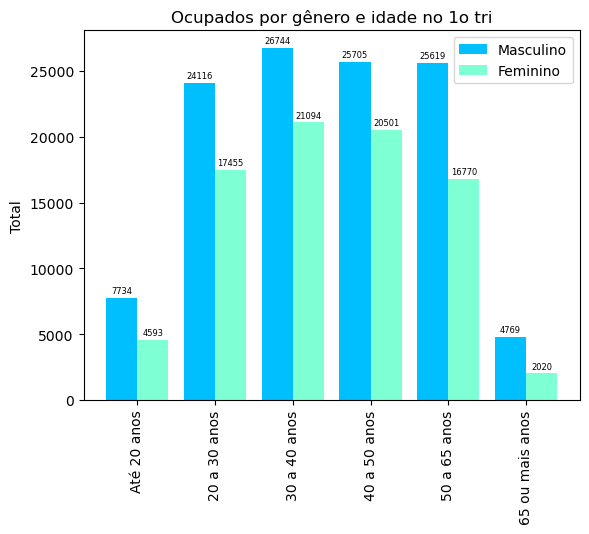

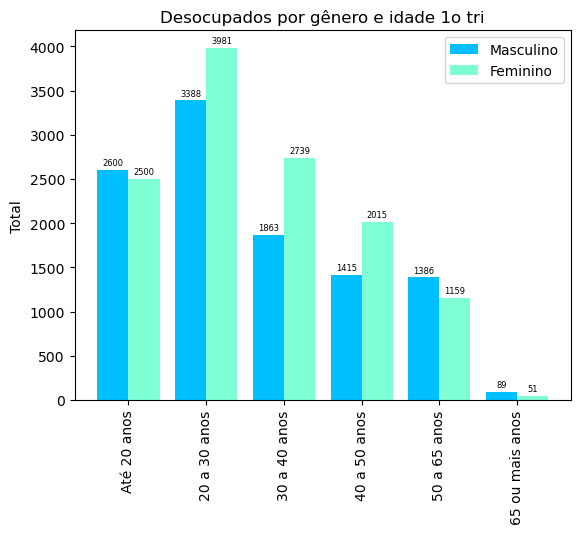

In [19]:
# Ocupados x Genero e Idade
#graficoPorGeneroIdade(df_primeiroTriFinal, )

s_ocupados, s_desocupados = ocupacao(df_primeiroTriFinal)

graficoPorGeneroIdade(s_ocupados, 'Ocupados por gênero e idade no 1o tri')
graficoPorGeneroIdade(s_desocupados, 'Desocupados por gênero e idade 1o tri')

In [20]:
# Instrução [VD3004] 
# Descrição
#1	Sem instrução e menos de 1 ano de estudo
#2	Fundamental incompleto ou equivalente
#3	Fundamental completo ou equivalente
#4	Médio incompleto ou equivalente
#5	Médio completo ou equivalente
#6	Superior incompleto ou equivalente
#7	Superior completo 


df_primeiroTriFinal['VD3004'].unique()

array([4., 3., 7., 5., 6., 2., 1.])

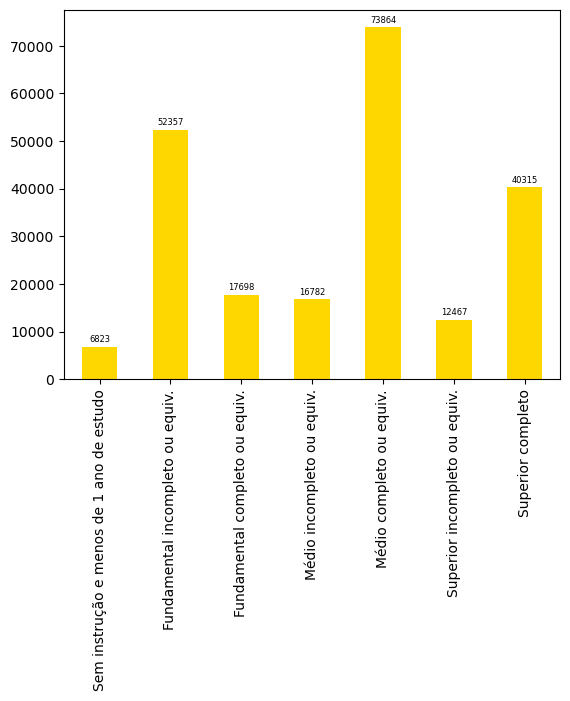

In [21]:
# Instrução dos entrevistados
graficoGrauInstrucao(df_primeiroTriFinal, 'Grau de instrução dos entrevistados no 1o tri')

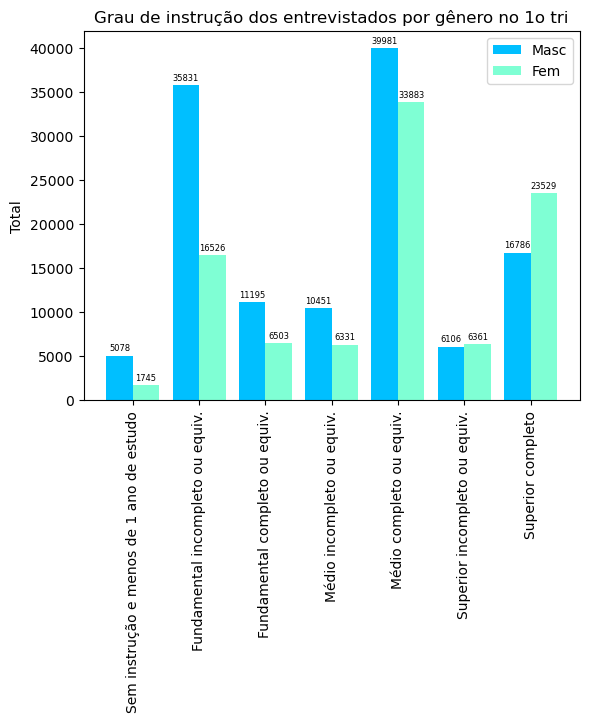

In [133]:
# Instrução dos entrevistados por sexo
graficoInstrucaoSexo(df_primeiroTriFinal, 'Grau de instrução dos entrevistados por gênero no 1o tri')

In [23]:
# Instrução
df_SemInstrucao,df_FundamentalIncompleto, df_FundamentalCompleto,  df_MedioIncompleto,  df_MedioCompleto, df_SupIncompleto, df_SupCompleto = instrucao(df_primeiroTriFinal)

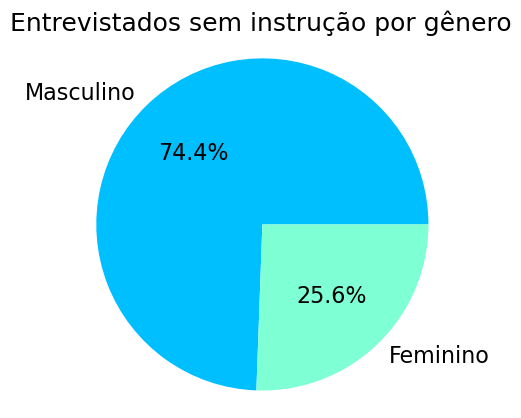

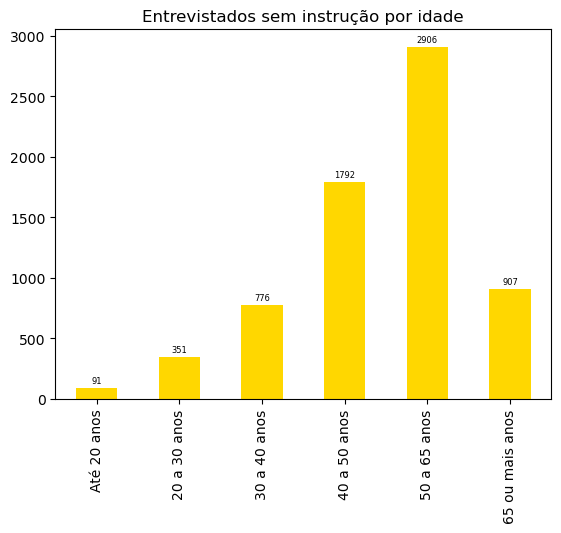

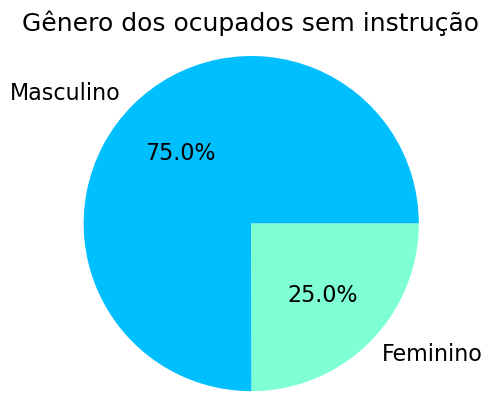

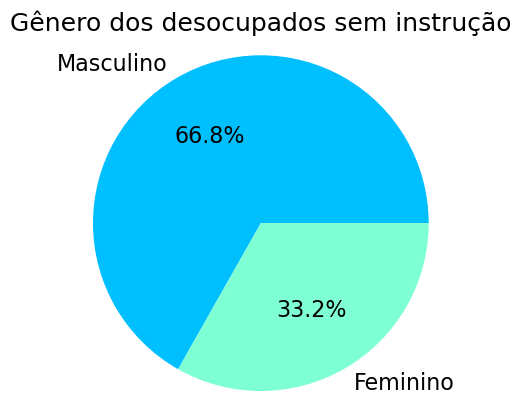

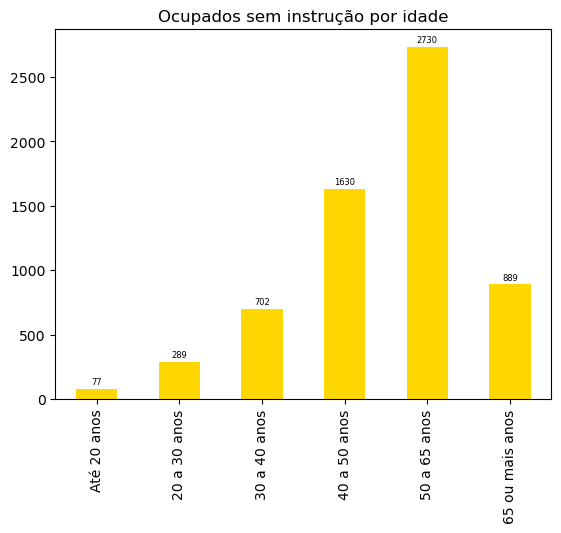

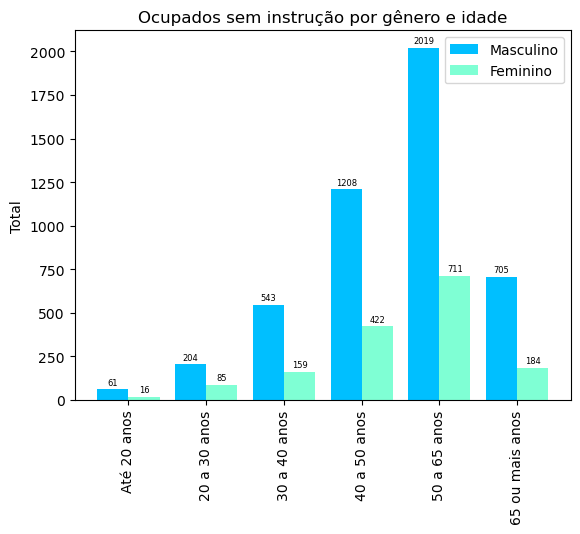

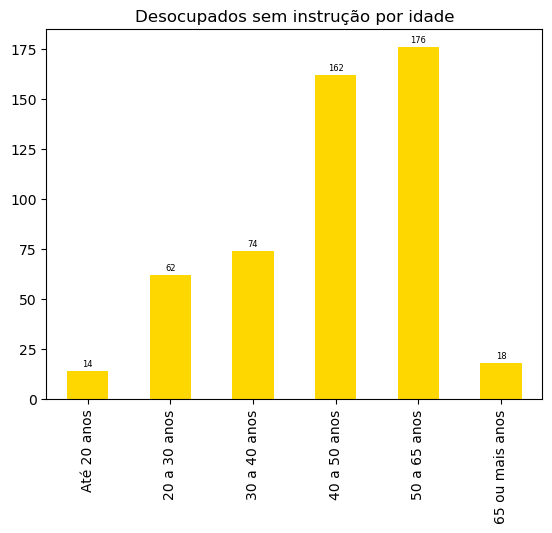

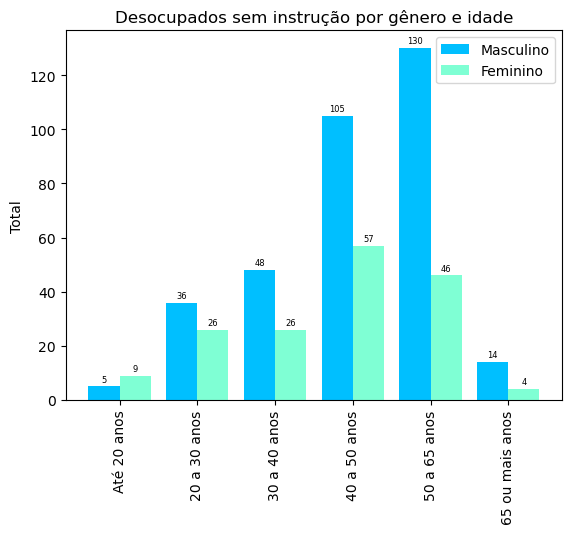

In [24]:
graficoInstrucaoPorGenero(df_SemInstrucao, 'Entrevistados sem instrução por gênero')
graficoEntrevistadosPorIdade(df_SemInstrucao, 'Entrevistados sem instrução por idade')

s_ocupadosSemInstrucao, s_desocupadosSemInstrucao = ocupacao(df_SemInstrucao)
graficoPorGenero(s_ocupadosSemInstrucao, "Gênero dos ocupados sem instrução")
graficoPorGenero(s_desocupadosSemInstrucao, "Gênero dos desocupados sem instrução")
graficoEntrevistadosPorIdade(s_ocupadosSemInstrucao, 'Ocupados sem instrução por idade')
graficoPorGeneroIdade(s_ocupadosSemInstrucao[['V2009','V2007']], 'Ocupados sem instrução por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosSemInstrucao[['V2009','V2007']],'Desocupados sem instrução por idade')
graficoPorGeneroIdade(s_desocupadosSemInstrucao[['V2009','V2007']], 'Desocupados sem instrução por gênero e idade')

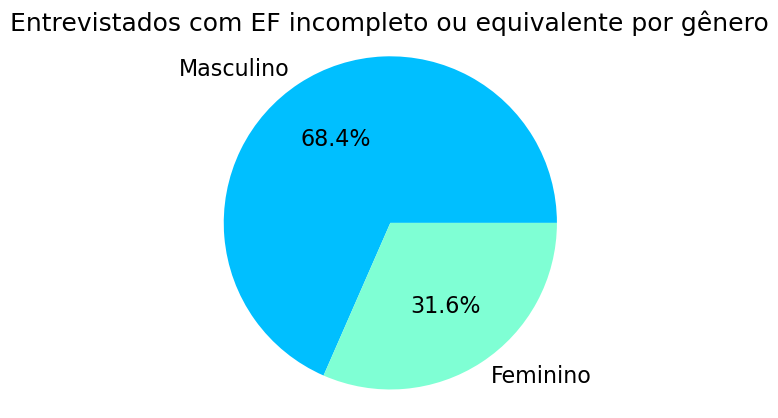

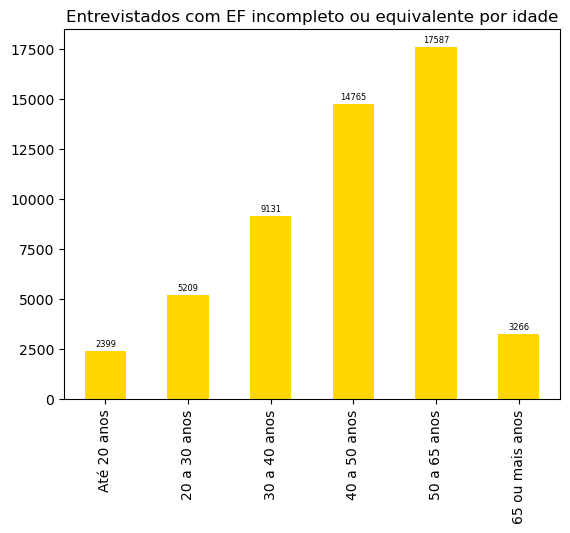

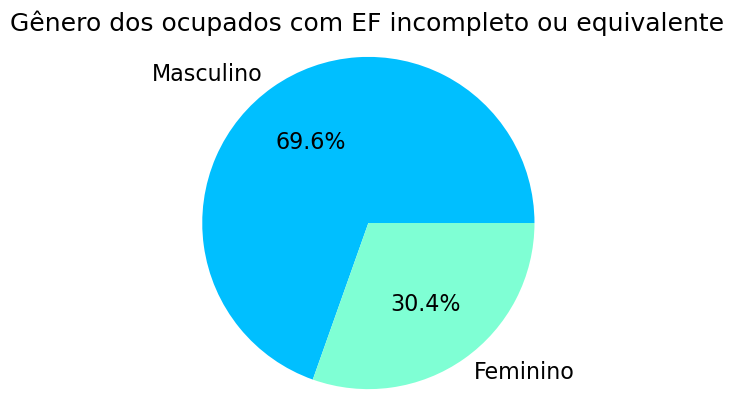

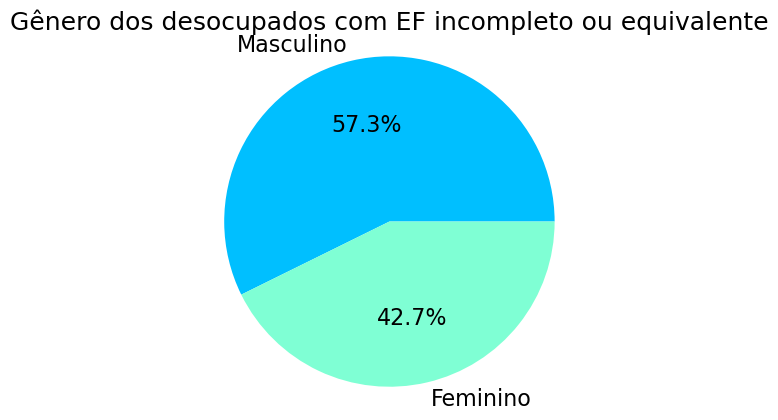

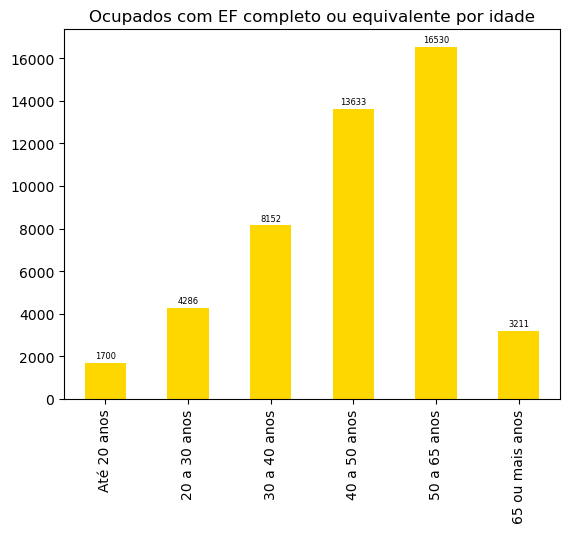

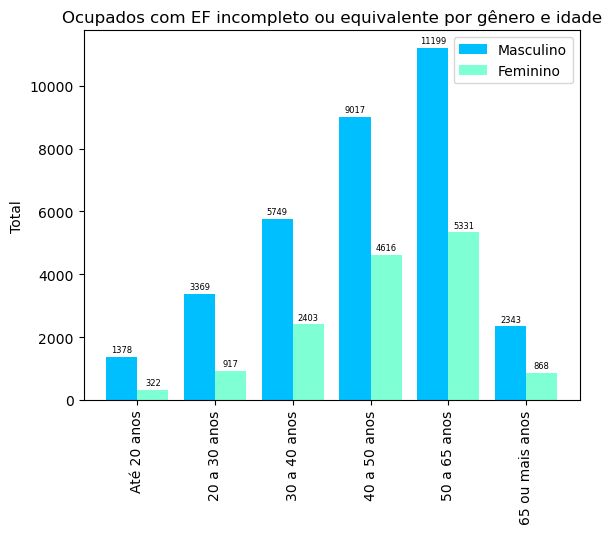

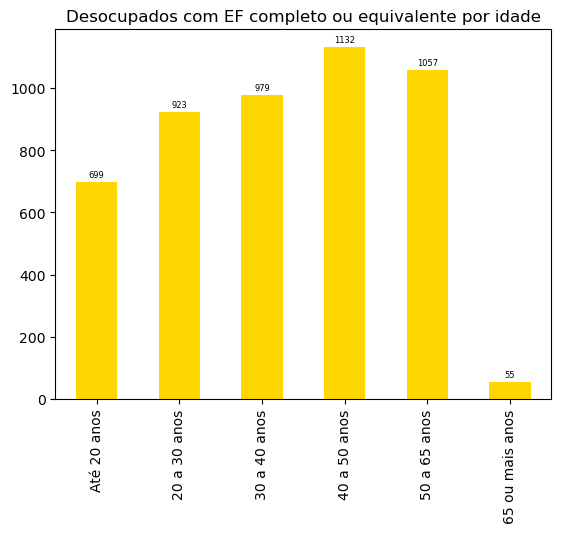

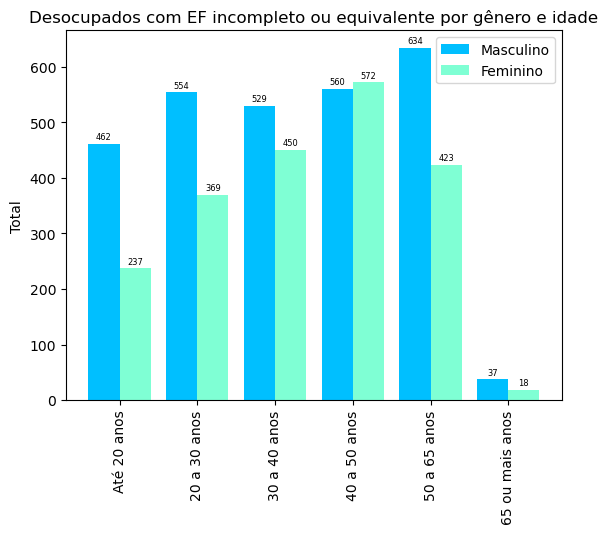

In [25]:
# Fundamental incompleto ou equivalente                     
graficoInstrucaoPorGenero(df_FundamentalIncompleto, 'Entrevistados com EF incompleto ou equivalente por gênero')
graficoEntrevistadosPorIdade(df_FundamentalIncompleto, 'Entrevistados com EF incompleto ou equivalente por idade')

s_ocupadosFundamental, s_desocupadosFundamental = ocupacao(df_FundamentalIncompleto)
graficoPorGenero(s_ocupadosFundamental, "Gênero dos ocupados com EF incompleto ou equivalente")
graficoPorGenero(s_desocupadosFundamental, "Gênero dos desocupados com EF incompleto ou equivalente")
graficoEntrevistadosPorIdade(s_ocupadosFundamental, 'Ocupados com EF completo ou equivalente por idade')
graficoPorGeneroIdade(s_ocupadosFundamental[['V2009','V2007']], 'Ocupados com EF incompleto ou equivalente por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosFundamental[['V2009','V2007']],'Desocupados com EF completo ou equivalente por idade')
graficoPorGeneroIdade(s_desocupadosFundamental[['V2009','V2007']], 'Desocupados com EF incompleto ou equivalente por gênero e idade')

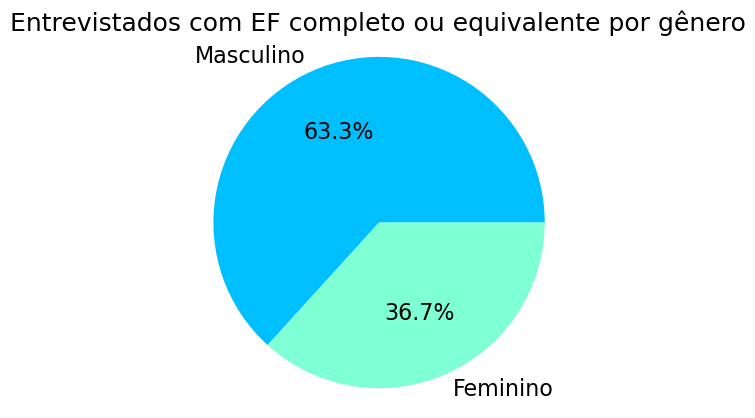

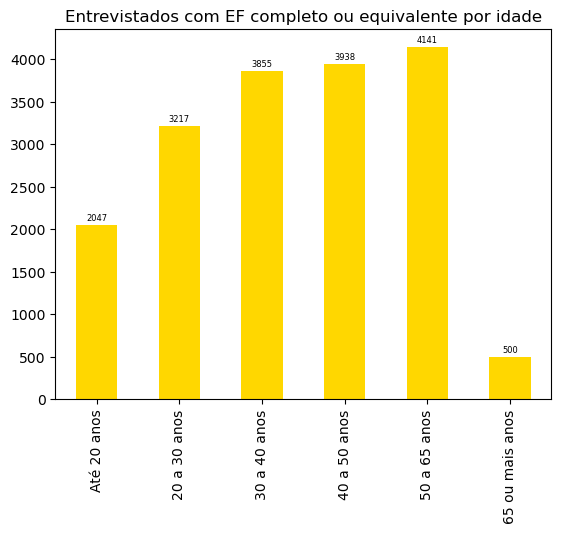

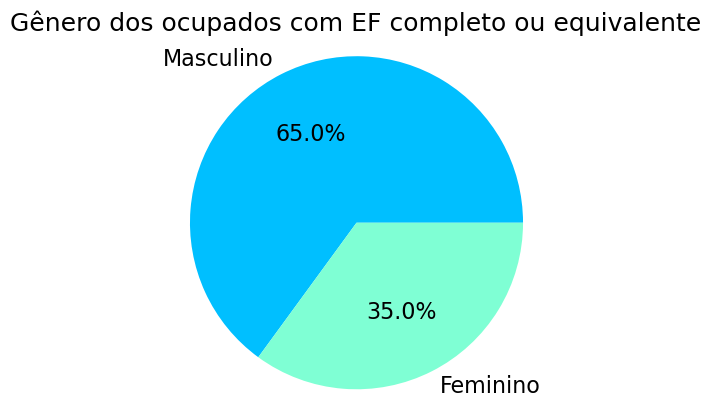

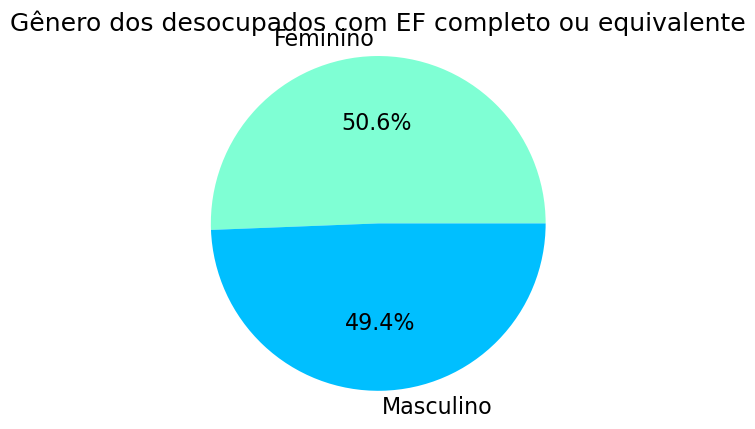

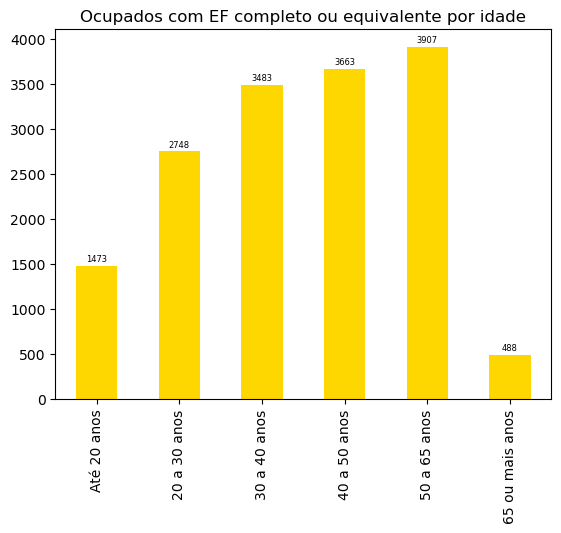

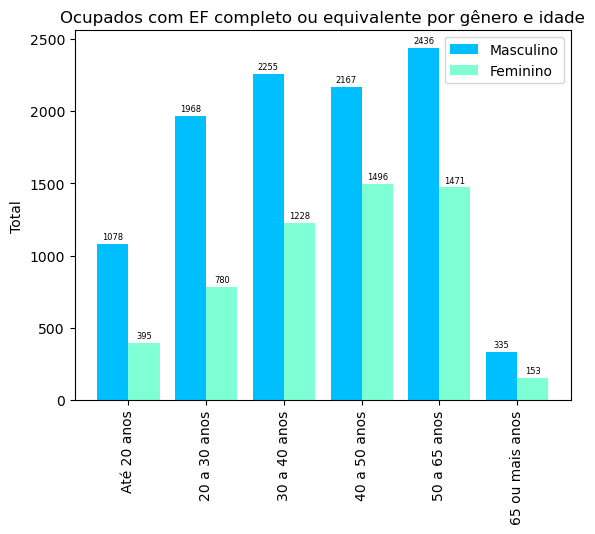

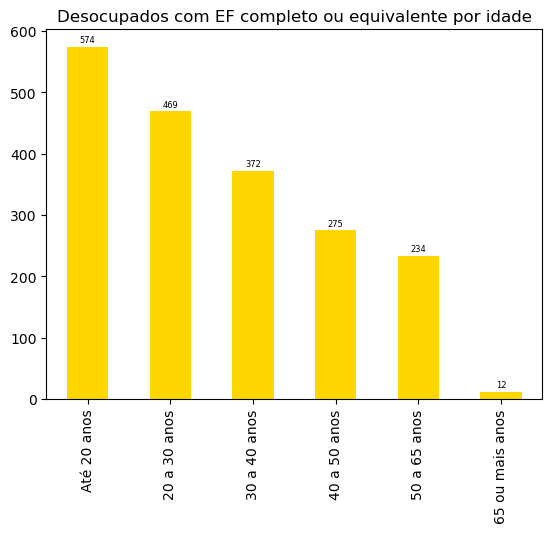

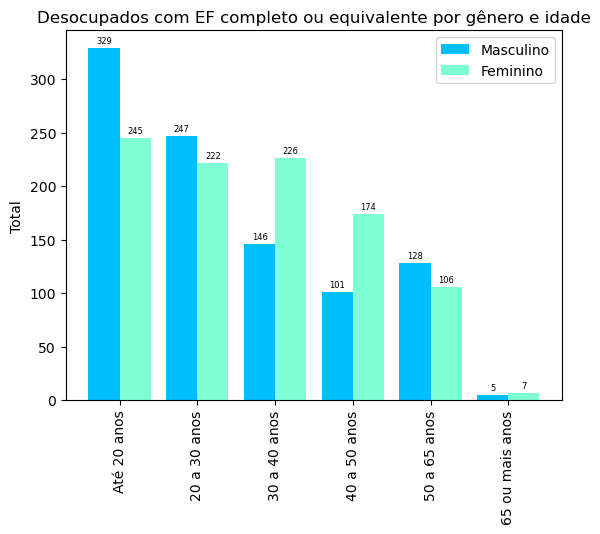

In [26]:
# Fundamental completo ou equivalente                     
graficoInstrucaoPorGenero(df_FundamentalCompleto, 'Entrevistados com EF completo ou equivalente por gênero')
graficoEntrevistadosPorIdade(df_FundamentalCompleto, 'Entrevistados com EF completo ou equivalente por idade')

s_ocupadosFundamental, s_desocupadosFundamental = ocupacao(df_FundamentalCompleto)
graficoPorGenero(s_ocupadosFundamental, "Gênero dos ocupados com EF completo ou equivalente")
graficoPorGenero(s_desocupadosFundamental, "Gênero dos desocupados com EF completo ou equivalente")
graficoEntrevistadosPorIdade(s_ocupadosFundamental, 'Ocupados com EF completo ou equivalente por idade')
graficoPorGeneroIdade(s_ocupadosFundamental[['V2009','V2007']], 'Ocupados com EF completo ou equivalente por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosFundamental[['V2009','V2007']],'Desocupados com EF completo ou equivalente por idade')
graficoPorGeneroIdade(s_desocupadosFundamental[['V2009','V2007']], 'Desocupados com EF completo ou equivalente por gênero e idade')

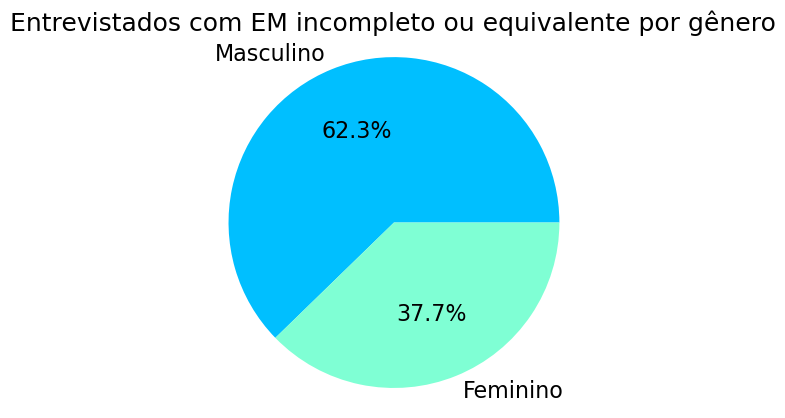

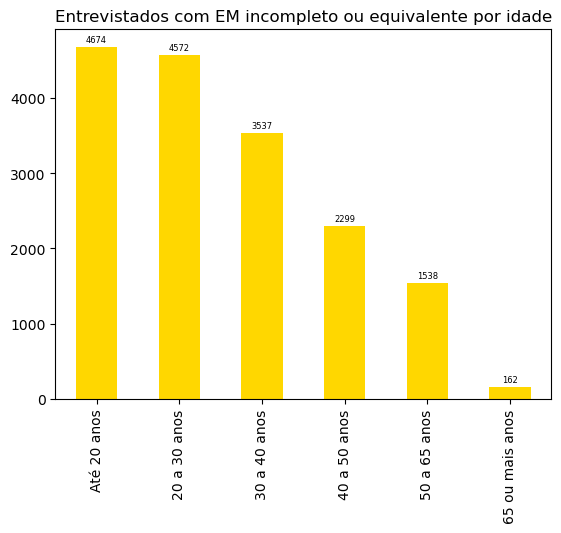

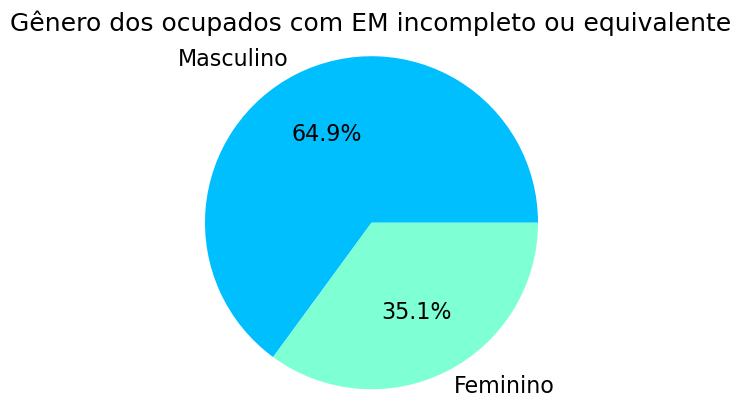

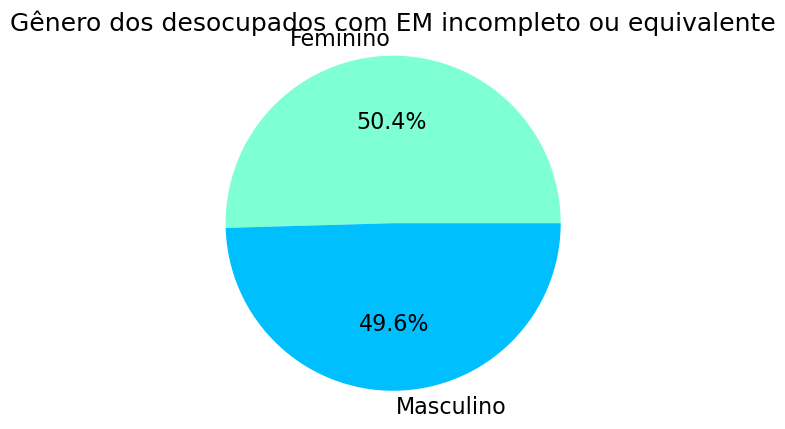

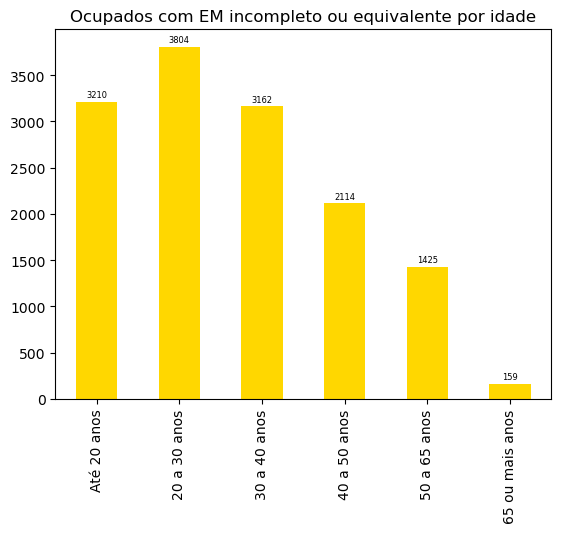

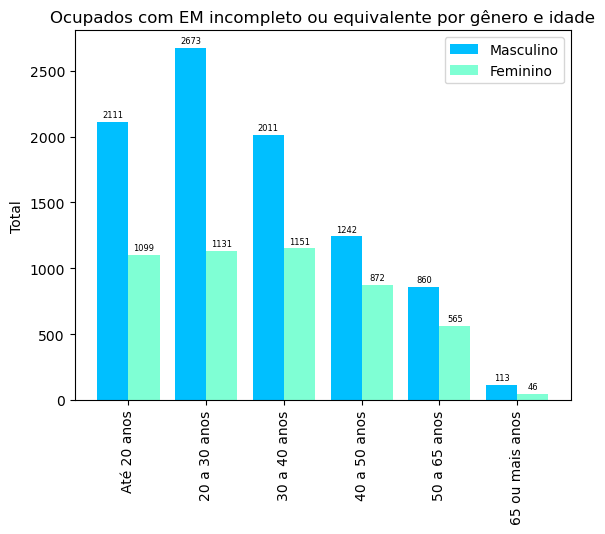

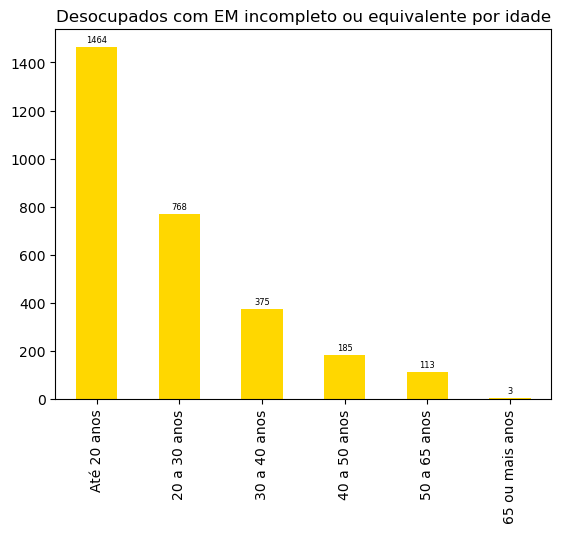

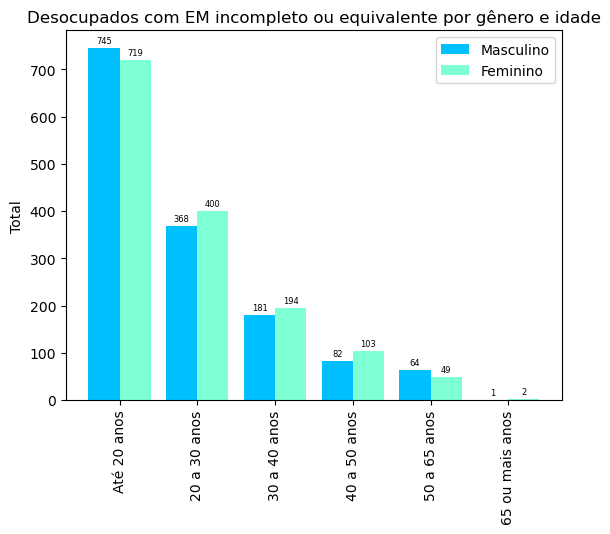

In [27]:
# Médio incompleto ou equivalente
graficoInstrucaoPorGenero(df_MedioIncompleto, 'Entrevistados com EM incompleto ou equivalente por gênero')
graficoEntrevistadosPorIdade(df_MedioIncompleto, 'Entrevistados com EM incompleto ou equivalente por idade')

s_ocupadosMI, s_desocupadosMI = ocupacao(df_MedioIncompleto)
graficoPorGenero(s_ocupadosMI, "Gênero dos ocupados com EM incompleto ou equivalente")
graficoPorGenero(s_desocupadosMI, "Gênero dos desocupados com EM incompleto ou equivalente")
graficoEntrevistadosPorIdade(s_ocupadosMI, 'Ocupados com EM incompleto ou equivalente por idade')
graficoPorGeneroIdade(s_ocupadosMI[['V2009','V2007']], 'Ocupados com EM incompleto ou equivalente por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosMI[['V2009','V2007']],'Desocupados com EM incompleto ou equivalente por idade')
graficoPorGeneroIdade(s_desocupadosMI[['V2009','V2007']], 'Desocupados com EM incompleto ou equivalente por gênero e idade')

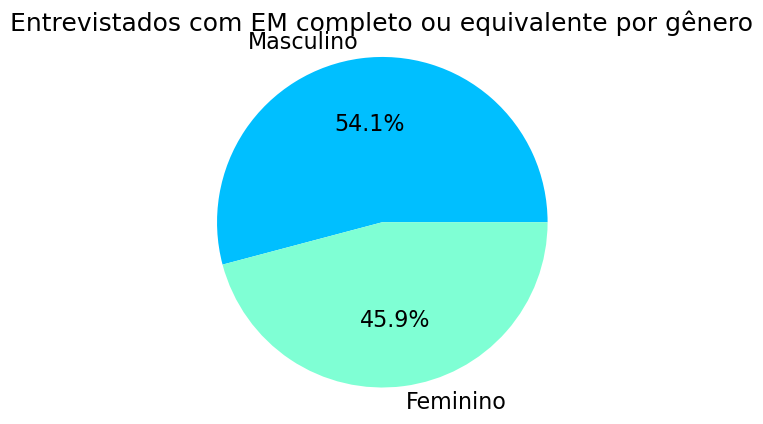

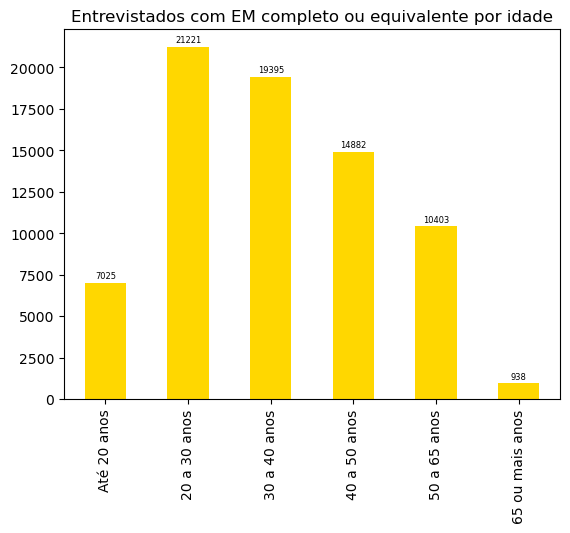

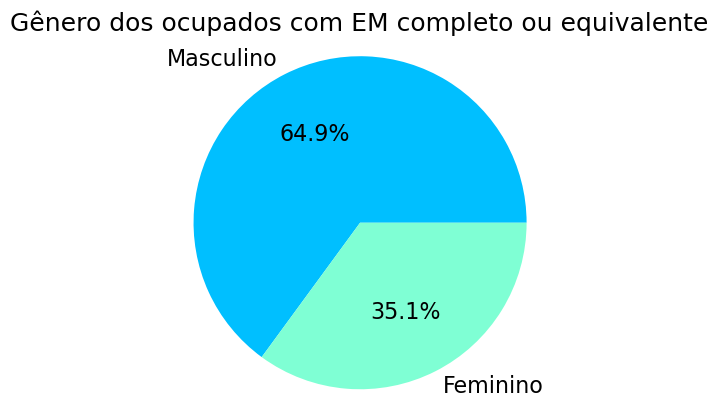

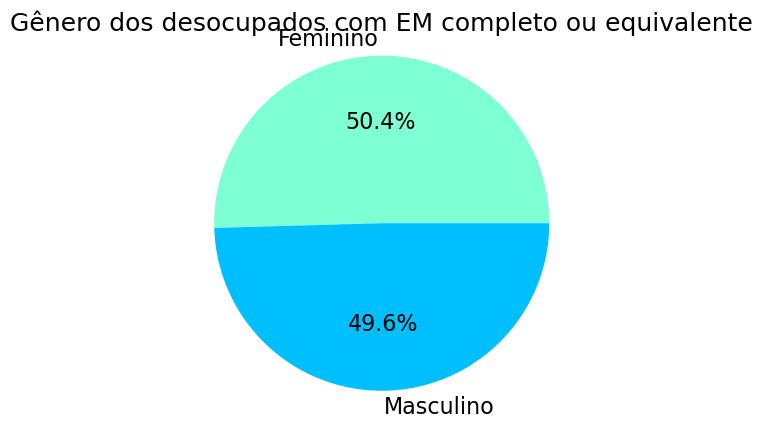

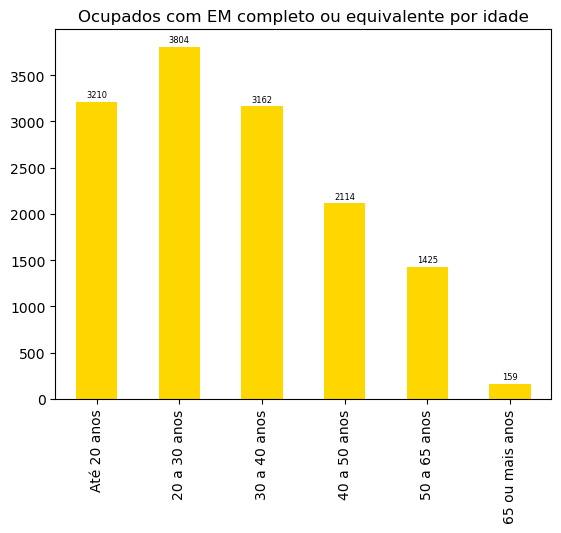

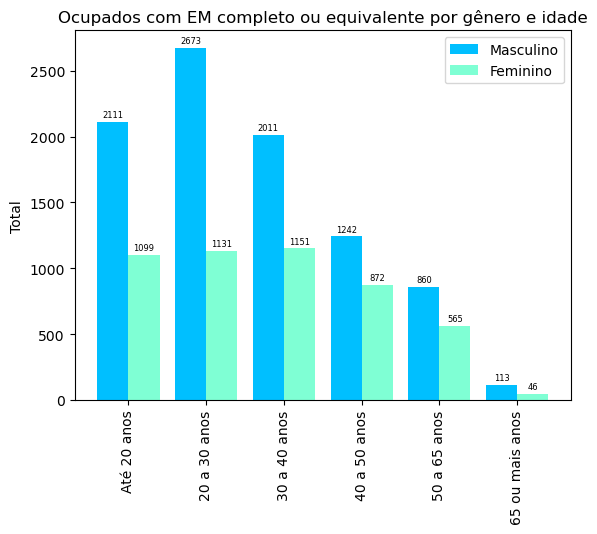

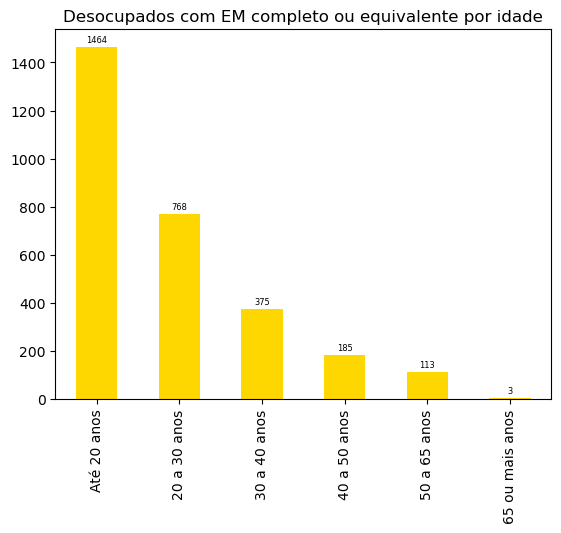

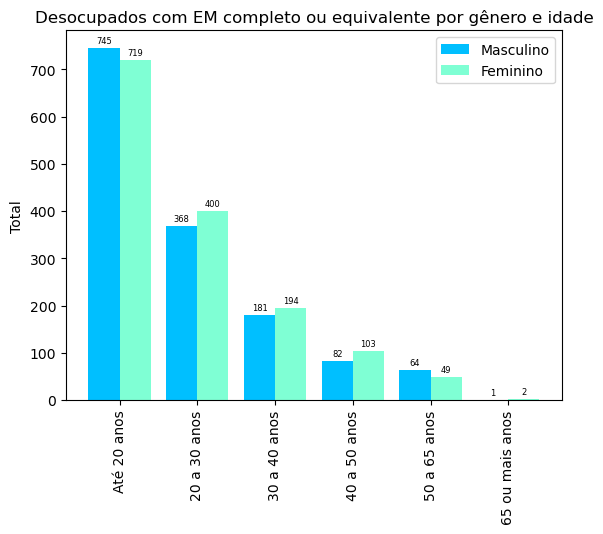

In [28]:
#  Médio completo ou equivalente
graficoInstrucaoPorGenero(df_MedioCompleto, 'Entrevistados com EM completo ou equivalente por gênero')
graficoEntrevistadosPorIdade(df_MedioCompleto, 'Entrevistados com EM completo ou equivalente por idade')

s_ocupadosMC, s_desocupadosMC = ocupacao(df_MedioIncompleto)
graficoPorGenero(s_ocupadosMC, "Gênero dos ocupados com EM completo ou equivalente")
graficoPorGenero(s_desocupadosMC, "Gênero dos desocupados com EM completo ou equivalente")
graficoEntrevistadosPorIdade(s_ocupadosMC, 'Ocupados com EM completo ou equivalente por idade')
graficoPorGeneroIdade(s_ocupadosMC[['V2009','V2007']], 'Ocupados com EM completo ou equivalente por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosMC[['V2009','V2007']],'Desocupados com EM completo ou equivalente por idade')
graficoPorGeneroIdade(s_desocupadosMC[['V2009','V2007']], 'Desocupados com EM completo ou equivalente por gênero e idade')

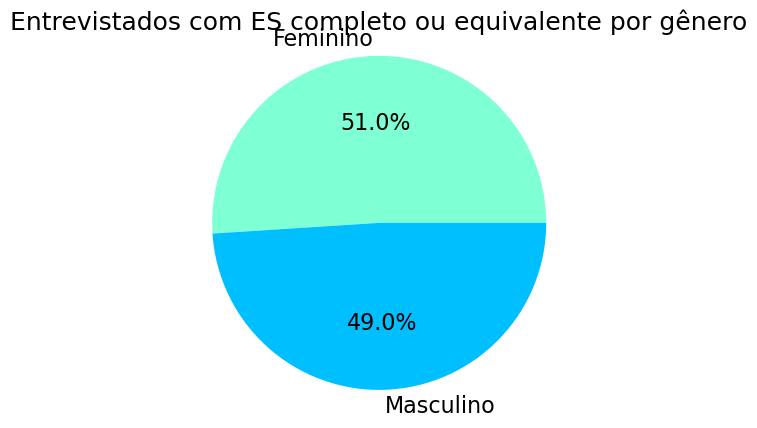

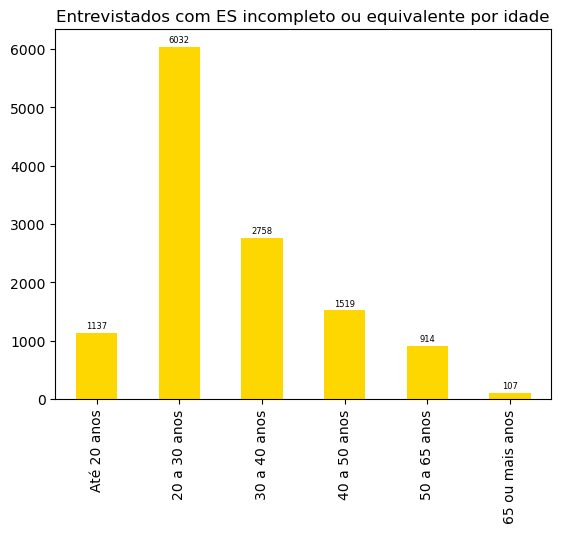

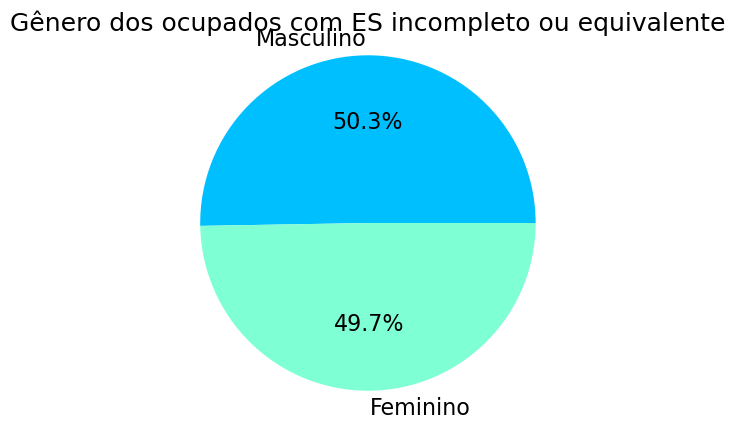

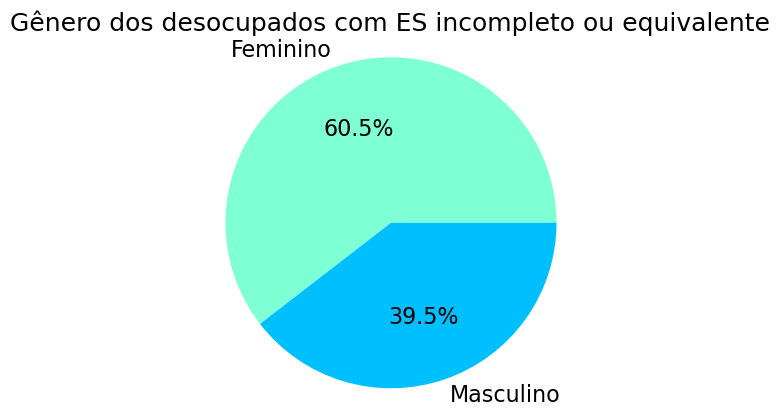

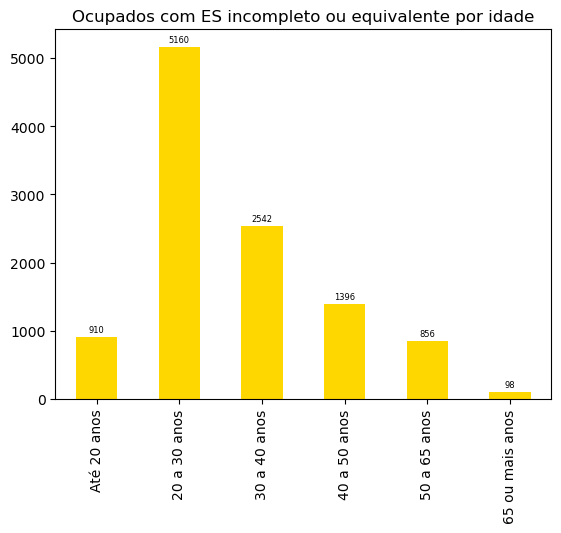

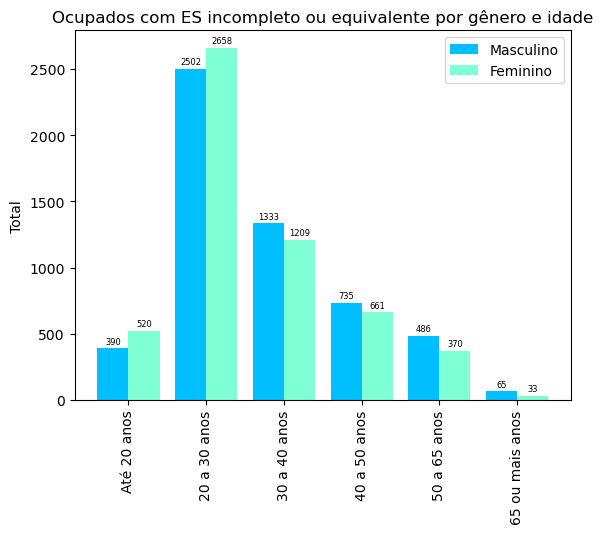

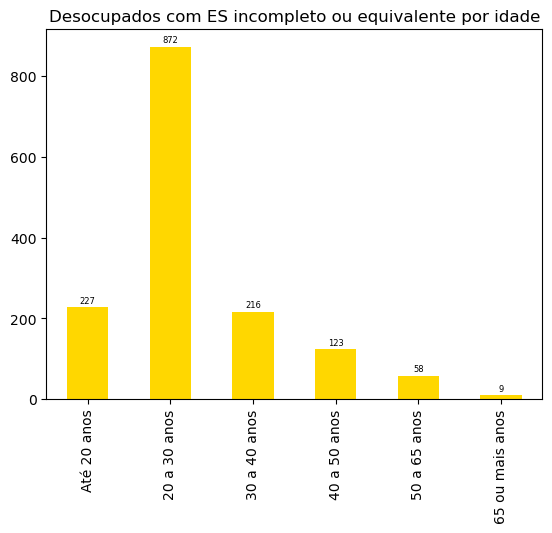

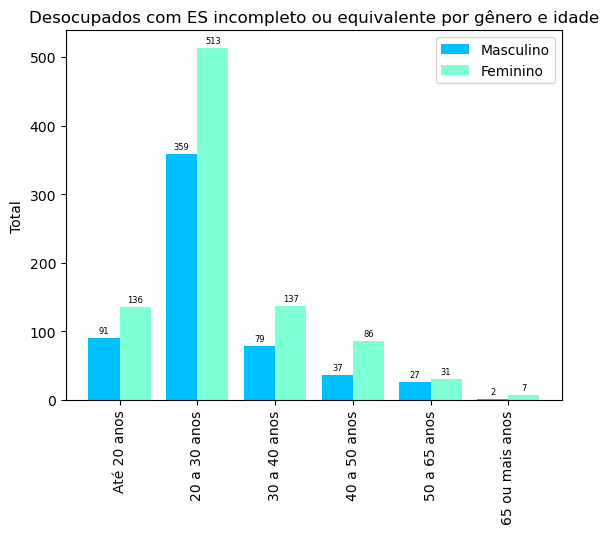

In [29]:
# 6 - Superior incompleto
graficoInstrucaoPorGenero(df_SupIncompleto, 'Entrevistados com ES completo ou equivalente por gênero')
graficoEntrevistadosPorIdade(df_SupIncompleto, 'Entrevistados com ES incompleto ou equivalente por idade')

s_ocupadosSI, s_desocupadosSI = ocupacao(df_SupIncompleto)
graficoPorGenero(s_ocupadosSI, "Gênero dos ocupados com ES incompleto ou equivalente")
graficoPorGenero(s_desocupadosSI, "Gênero dos desocupados com ES incompleto ou equivalente")
graficoEntrevistadosPorIdade(s_ocupadosSI, 'Ocupados com ES incompleto ou equivalente por idade')
graficoPorGeneroIdade(s_ocupadosSI[['V2009','V2007']], 'Ocupados com ES incompleto ou equivalente por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosSI[['V2009','V2007']],'Desocupados com ES incompleto ou equivalente por idade')
graficoPorGeneroIdade(s_desocupadosSI[['V2009','V2007']], 'Desocupados com ES incompleto ou equivalente por gênero e idade')    

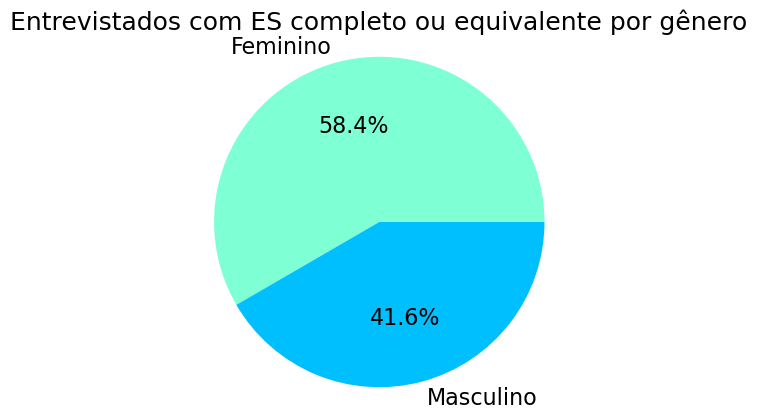

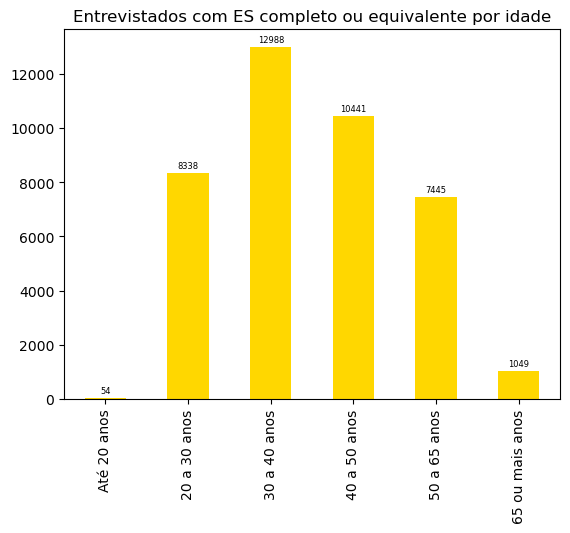

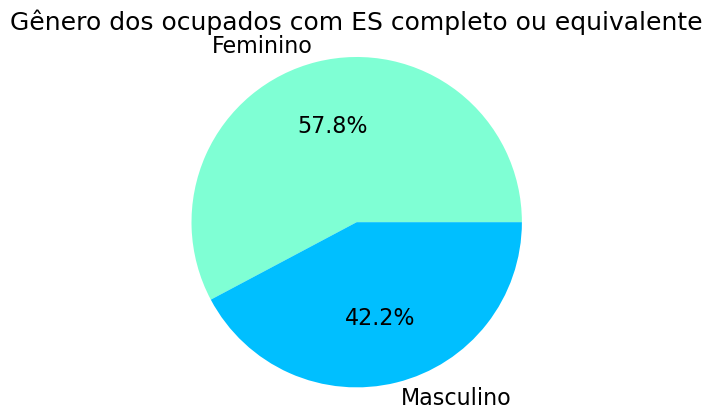

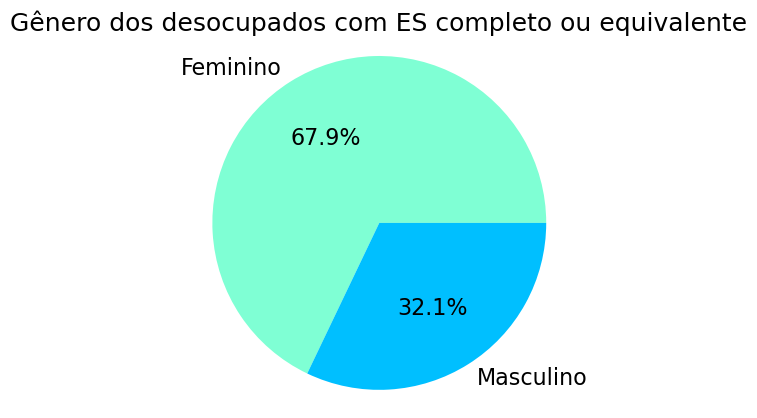

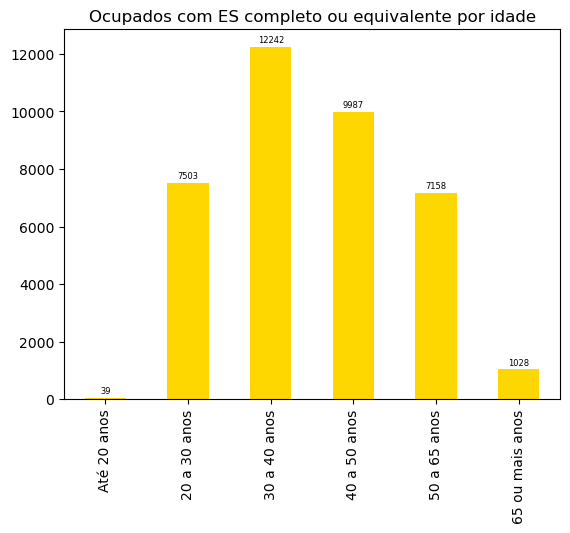

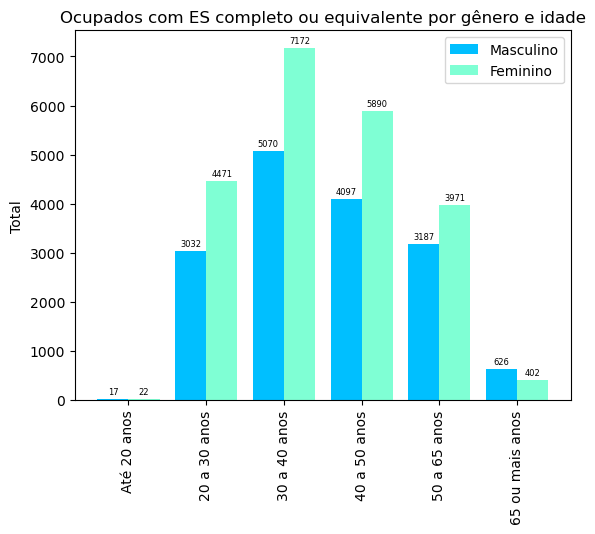

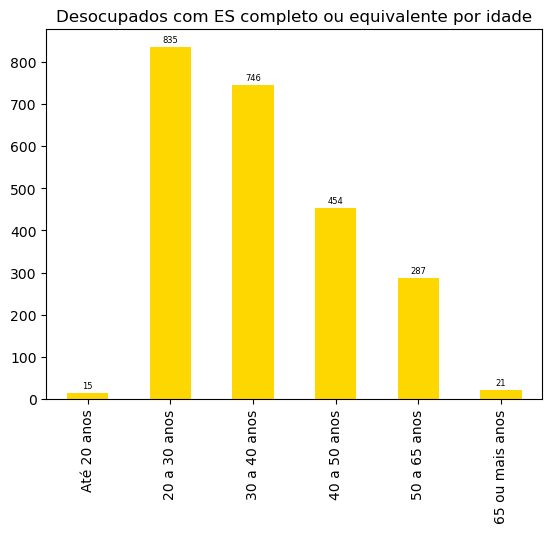

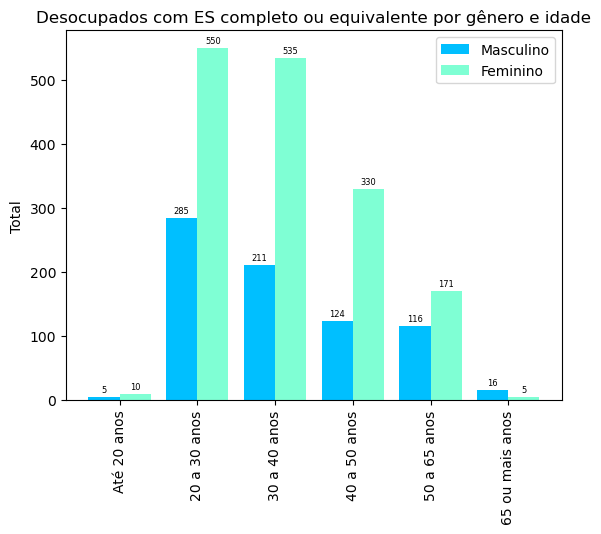

In [30]:
# 7 - Superior completo
graficoInstrucaoPorGenero(df_SupCompleto, 'Entrevistados com ES completo ou equivalente por gênero')
graficoEntrevistadosPorIdade(df_SupCompleto, 'Entrevistados com ES completo ou equivalente por idade')

s_ocupadosSC, s_desocupadosSC = ocupacao(df_SupCompleto)
graficoPorGenero(s_ocupadosSC, "Gênero dos ocupados com ES completo ou equivalente")
graficoPorGenero(s_desocupadosSC, "Gênero dos desocupados com ES completo ou equivalente")
graficoEntrevistadosPorIdade(s_ocupadosSC, 'Ocupados com ES completo ou equivalente por idade')
graficoPorGeneroIdade(s_ocupadosSC[['V2009','V2007']], 'Ocupados com ES completo ou equivalente por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosSC[['V2009','V2007']],'Desocupados com ES completo ou equivalente por idade')
graficoPorGeneroIdade(s_desocupadosSC[['V2009','V2007']], 'Desocupados com ES completo ou equivalente por gênero e idade')

In [31]:
# 2o Trimestre
df_segundoTri = carregaTrimestre('PNADC_022022_vd.csv')

In [32]:
df_segundoTri.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 482118 entries, 0 to 482117
Data columns (total 28 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Unnamed: 0  482118 non-null  int64  
 1   V2007       482118 non-null  int64  
 2   V2009       482118 non-null  int64  
 3   V3002       453878 non-null  float64
 4   V3008       340395 non-null  float64
 5   V3003A      113483 non-null  float64
 6   V3006       102429 non-null  float64
 7   V3006A      304 non-null     float64
 8   V3009A      319299 non-null  float64
 9   V3014       308152 non-null  float64
 10  V3010       88788 non-null   float64
 11  V3012       297057 non-null  float64
 12  V3013B      216 non-null     float64
 13  V3013A      393 non-null     float64
 14  V3013       287776 non-null  float64
 15  V3005A      17347 non-null   float64
 16  V3011A      44055 non-null   float64
 17  V3007       17347 non-null   float64
 18  V4009       206387 non-null  float64
 19  V4

In [33]:
# Iniciando tratamenos com a variavel VD4002 (Condição de ocupação)
# Verificando os valores que existem para a variavel
df_segundoTri['VD4002'].unique()

array([ 1.,  2., nan])

In [34]:
# Reduzindo o dataframe apenas para os entrevistados ocupados e desocupados, desconsiderando os não aplicáveis
df_segundoTriFiltrado = df_segundoTri[(df_segundoTri['VD4002'] == 1.0) | (df_segundoTri['VD4002'] == 2.0)]
df_segundoTriFiltrado['VD4002'].unique()

array([1., 2.])

In [35]:
df_segundoTriFiltrado.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 226026 entries, 0 to 482117
Data columns (total 28 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Unnamed: 0  226026 non-null  int64  
 1   V2007       226026 non-null  int64  
 2   V2009       226026 non-null  int64  
 3   V3002       226026 non-null  float64
 4   V3008       202452 non-null  float64
 5   V3003A      23574 non-null   float64
 6   V3006       20475 non-null   float64
 7   V3006A      114 non-null     float64
 8   V3009A      197561 non-null  float64
 9   V3014       192175 non-null  float64
 10  V3010       53509 non-null   float64
 11  V3012       183903 non-null  float64
 12  V3013B      82 non-null      float64
 13  V3013A      187 non-null     float64
 14  V3013       179870 non-null  float64
 15  V3005A      12230 non-null   float64
 16  V3011A      34217 non-null   float64
 17  V3007       12230 non-null   float64
 18  V4009       206387 non-null  float64
 19  V4

In [36]:
df_segundoTriFiltrado['VD3004'].unique()

array([4., 3., 1., 2., 7., 5., 6.])

In [37]:
# Filtrando apenas os campos necessários para as análises
df_segundoTriFinal = df_segundoTriFiltrado.loc[:, ['V2007', 'V2009', 'VD4002', 'VD3004']]
df_segundoTriFinal

,V2007,V2009,VD4002,VD3004
0,2,45,1.0,4.0
1,1,26,1.0,4.0
2,1,18,1.0,3.0
3,2,22,2.0,4.0
8,2,47,1.0,1.0
...,...,...,...,...
482110,1,29,1.0,7.0
482112,2,64,1.0,7.0
482115,2,40,1.0,5.0
482116,1,55,1.0,2.0


In [38]:
df_segundoTriFinal['trimestre'] = 2 

In [39]:
# Verificação de valores 
df_genero = df_segundoTriFinal['V2007']
df_genero.isnull().sum()
genero_entrevistados = df_genero.value_counts()
genero_entrevistados.info()

<class 'pandas.core.series.Series'>
Int64Index: 2 entries, 1 to 2
Series name: V2007
Non-Null Count  Dtype
--------------  -----
2 non-null      int64
dtypes: int64(1)
memory usage: 32.0 bytes


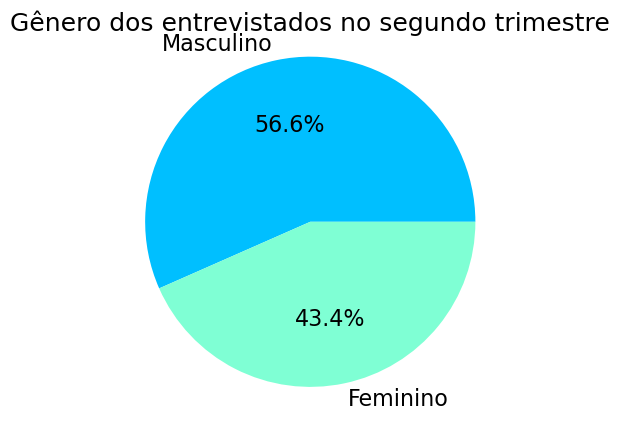

In [40]:
# Grafico de entrevistados por genero
graficoPorGenero(df_segundoTriFinal, 'Gênero dos entrevistados no segundo trimestre')

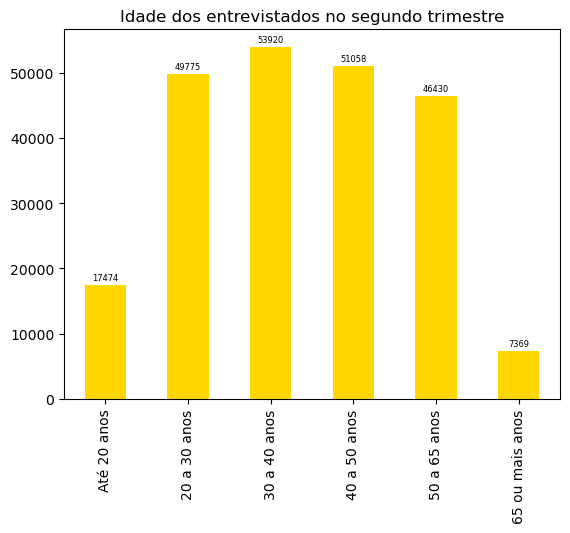

In [41]:
# Grafico por idade 
graficoEntrevistadosPorIdade(df_segundoTriFinal, 'Idade dos entrevistados no segundo trimestre')

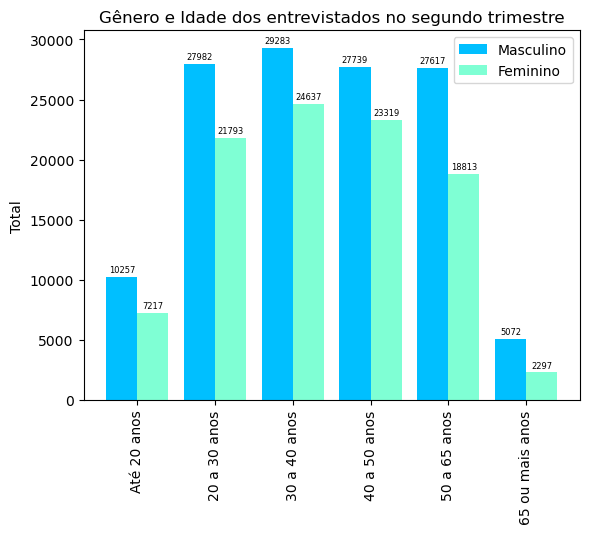

In [42]:
# Grafico por genero e idade
graficoPorGeneroIdade(df_segundoTriFinal, 'Gênero e Idade dos entrevistados no segundo trimestre')

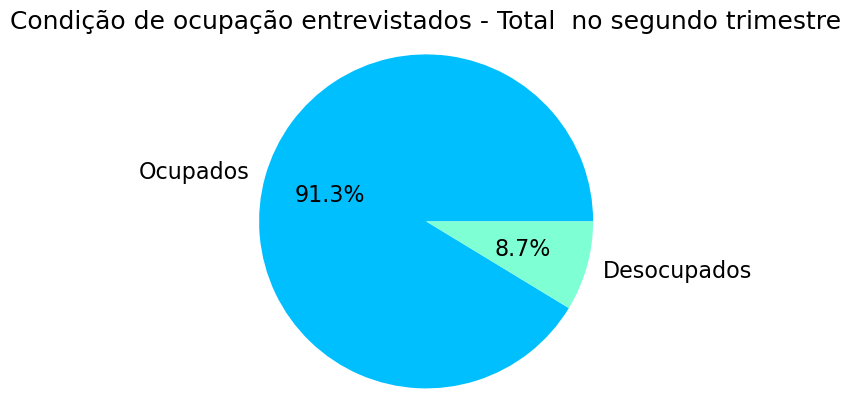

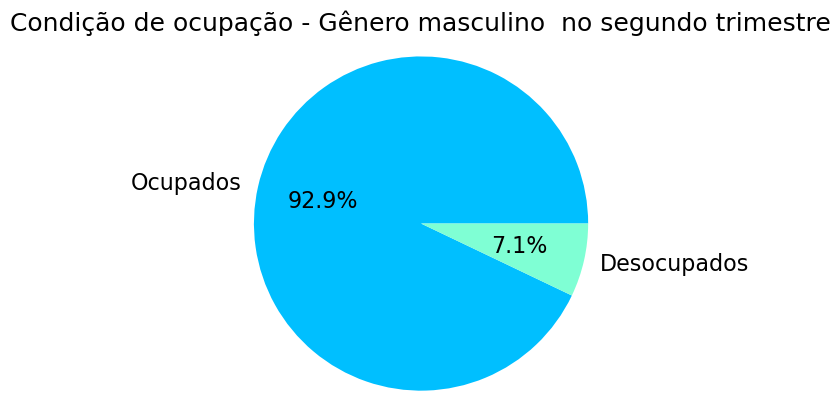

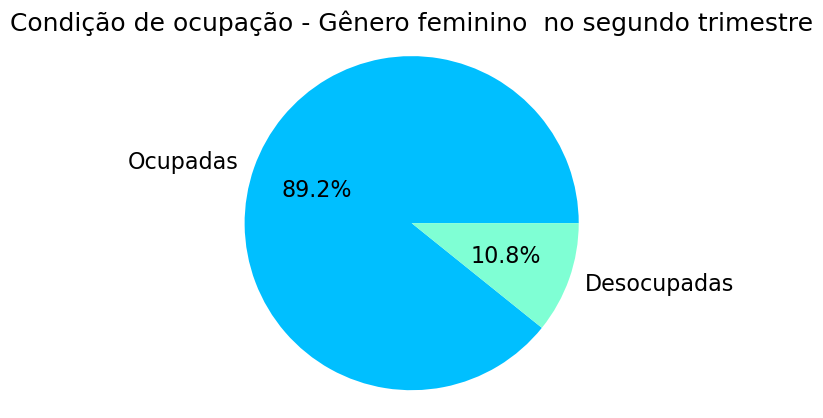

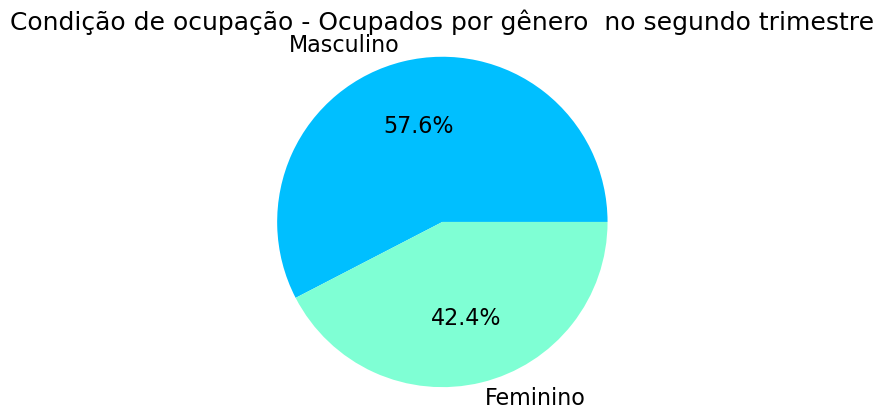

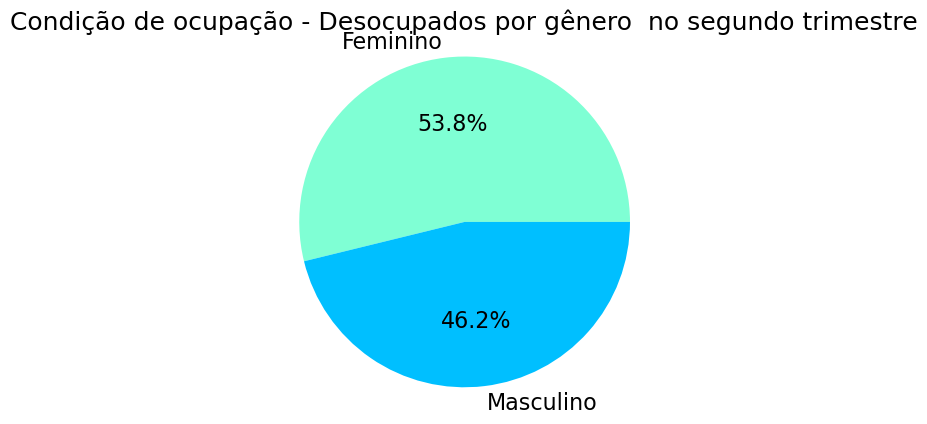

In [43]:
graficoOcupacao(df_segundoTriFinal, ' no segundo trimestre')

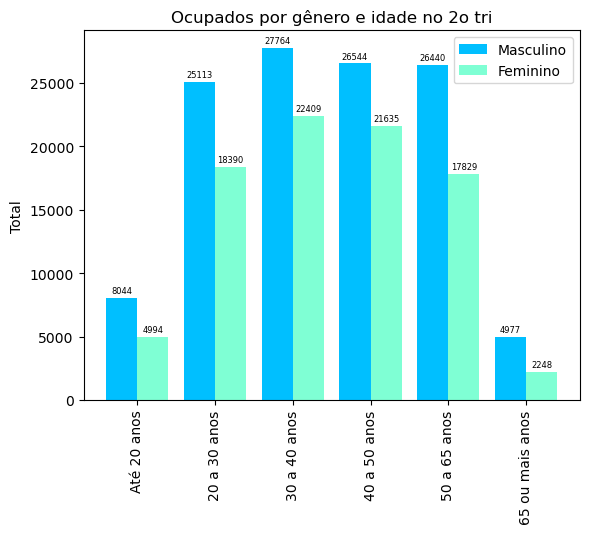

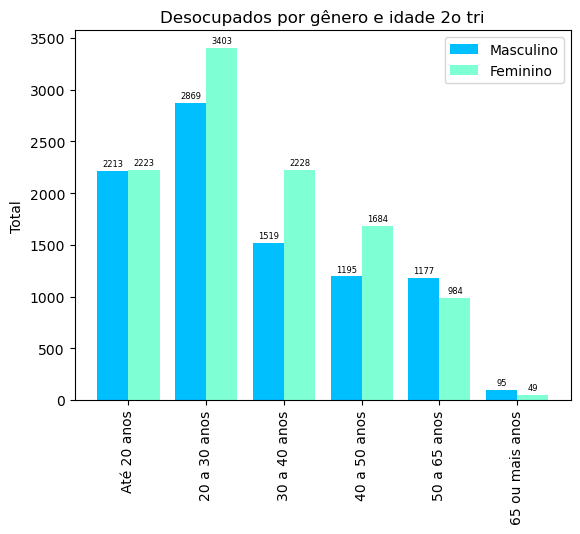

In [44]:
# Ocupados x Genero e Idade
#graficoPorGeneroIdade(df_primeiroTriFinal, )

s_ocupados, s_desocupados = ocupacao(df_segundoTriFinal)

graficoPorGeneroIdade(s_ocupados, 'Ocupados por gênero e idade no 2o tri')
graficoPorGeneroIdade(s_desocupados, 'Desocupados por gênero e idade 2o tri')

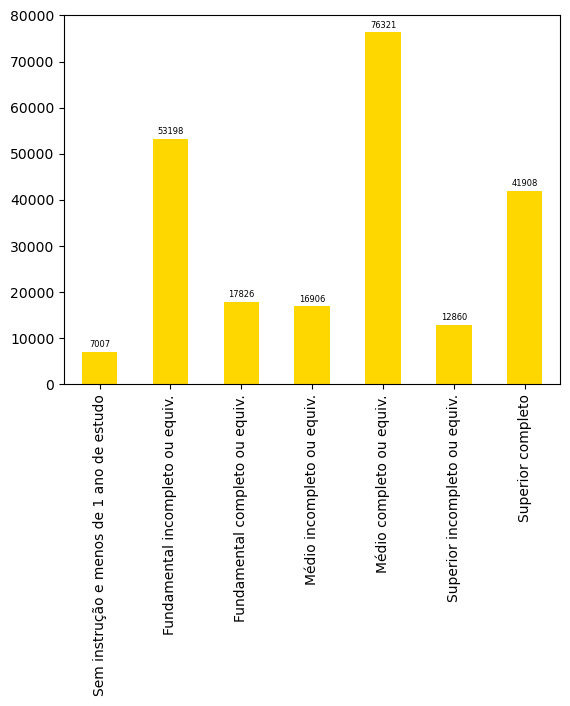

In [45]:
# Instrução dos entrevistados
graficoGrauInstrucao(df_segundoTriFinal, 'Grau de instrução dos entrevistados no 2o tri')

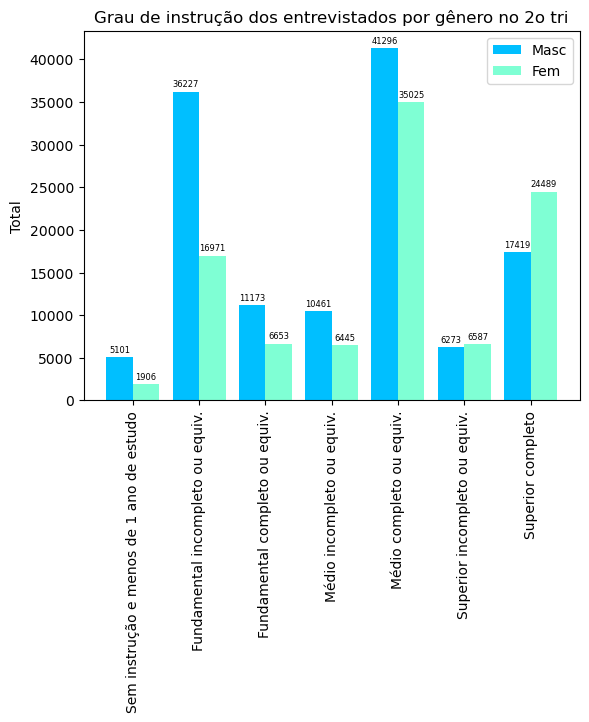

In [134]:
# Instrução dos entrevistados por sexo
graficoInstrucaoSexo(df_segundoTriFinal, 'Grau de instrução dos entrevistados por gênero no 2o tri')

In [47]:
# Instrução
df_SemInstrucao,df_FundamentalIncompleto, df_FundamentalCompleto,  df_MedioIncompleto,  df_MedioCompleto, df_SupIncompleto, df_SupCompleto = instrucao(df_segundoTriFinal)

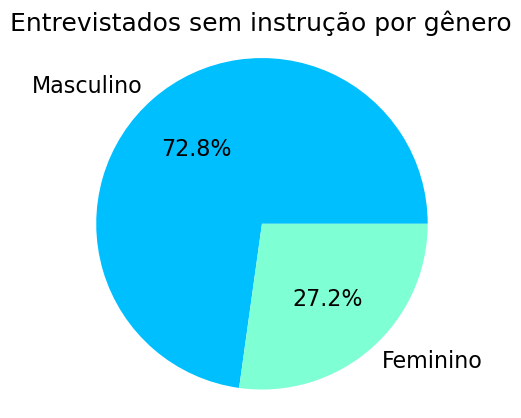

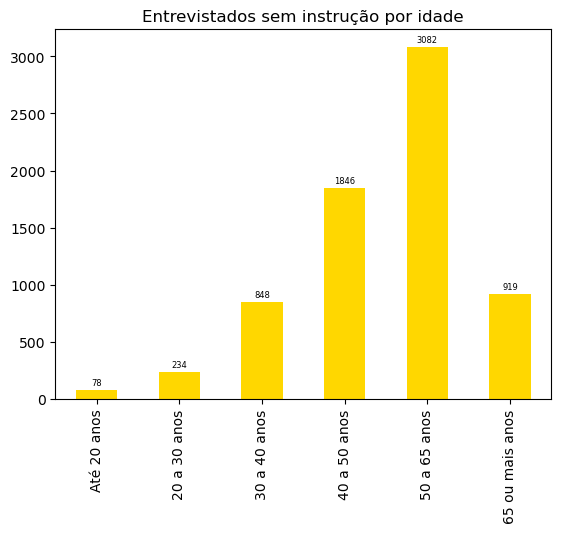

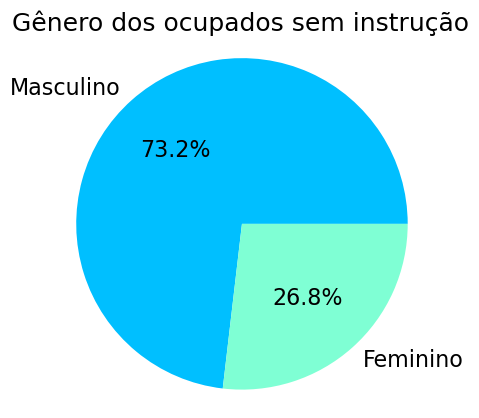

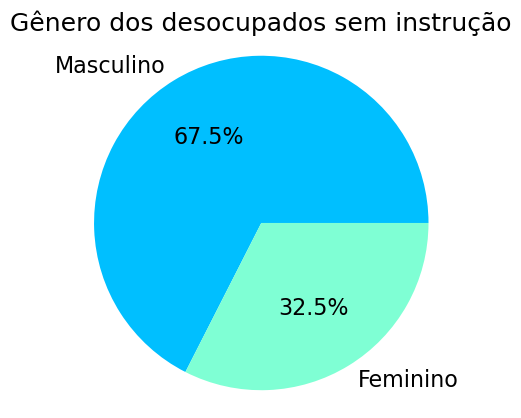

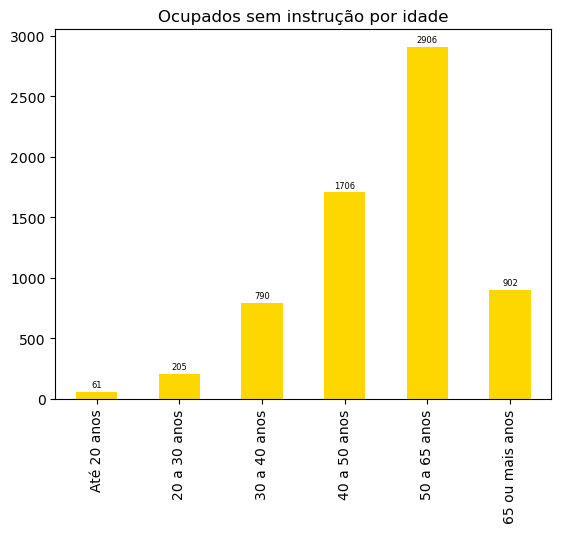

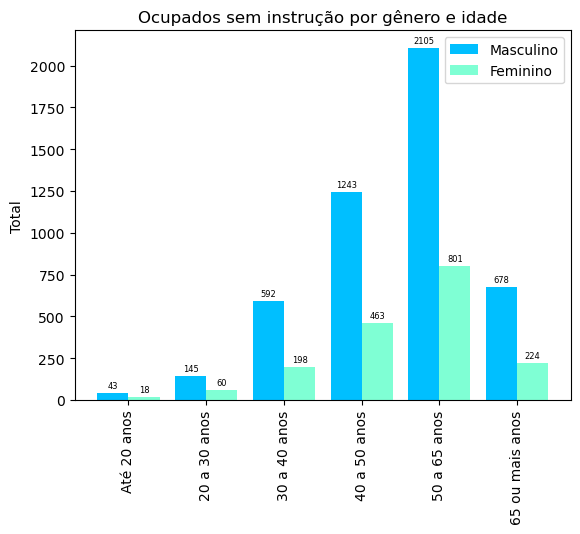

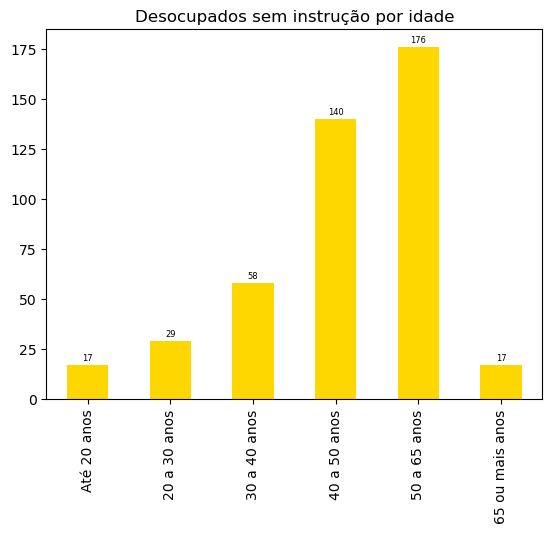

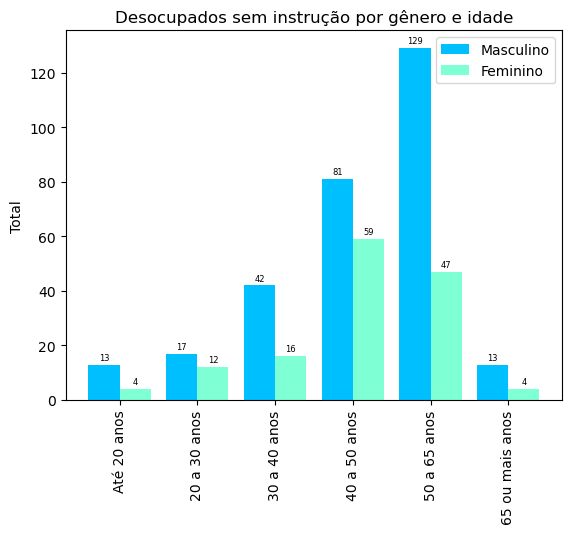

In [48]:
graficoInstrucaoPorGenero(df_SemInstrucao, 'Entrevistados sem instrução por gênero')

graficoEntrevistadosPorIdade(df_SemInstrucao, 'Entrevistados sem instrução por idade')

s_ocupadosSemInstrucao, s_desocupadosSemInstrucao = ocupacao(df_SemInstrucao)
graficoPorGenero(s_ocupadosSemInstrucao, "Gênero dos ocupados sem instrução")
graficoPorGenero(s_desocupadosSemInstrucao, "Gênero dos desocupados sem instrução")
graficoEntrevistadosPorIdade(s_ocupadosSemInstrucao, 'Ocupados sem instrução por idade')
graficoPorGeneroIdade(s_ocupadosSemInstrucao[['V2009','V2007']], 'Ocupados sem instrução por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosSemInstrucao[['V2009','V2007']],'Desocupados sem instrução por idade')
graficoPorGeneroIdade(s_desocupadosSemInstrucao[['V2009','V2007']], 'Desocupados sem instrução por gênero e idade')

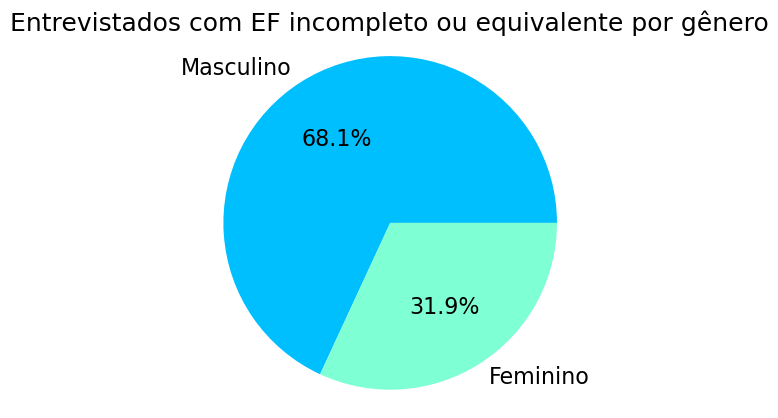

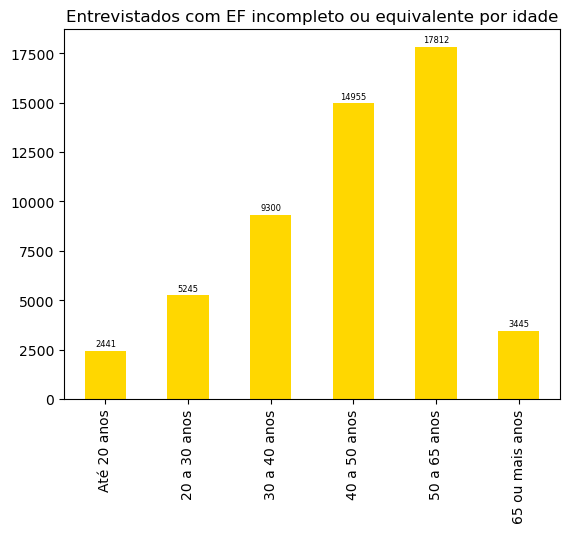

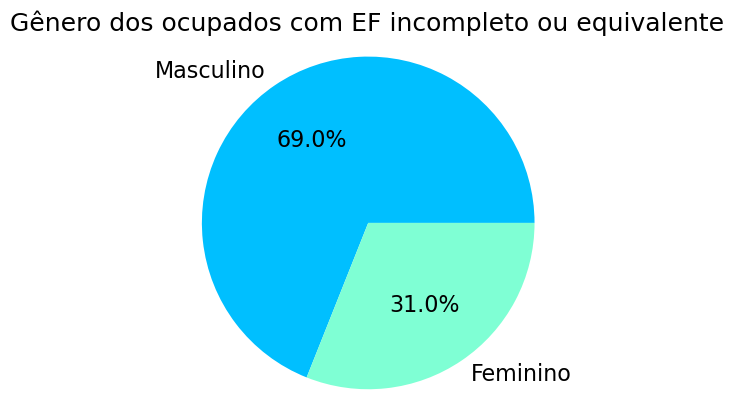

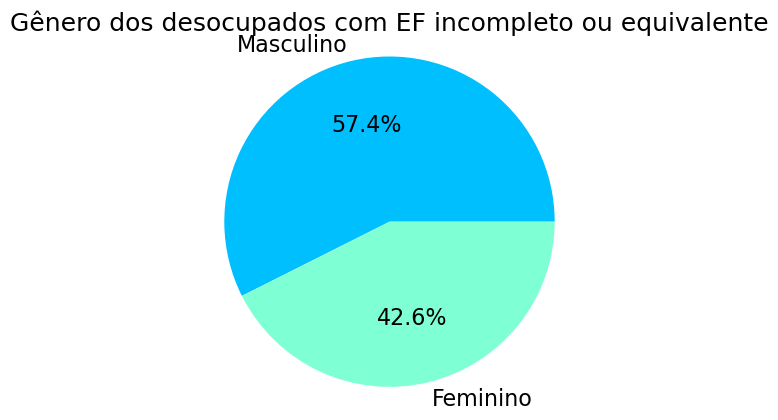

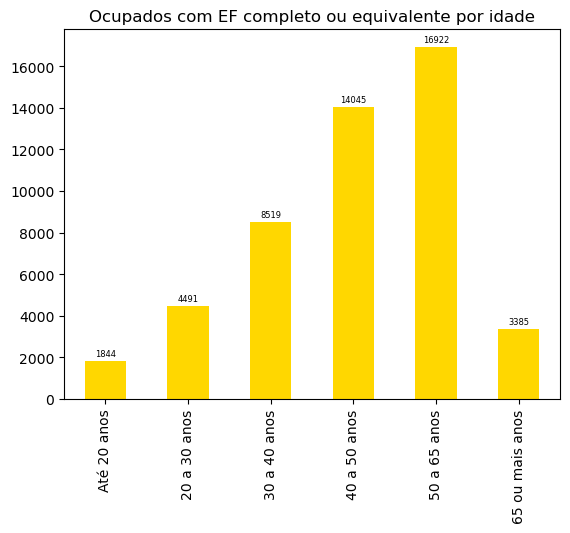

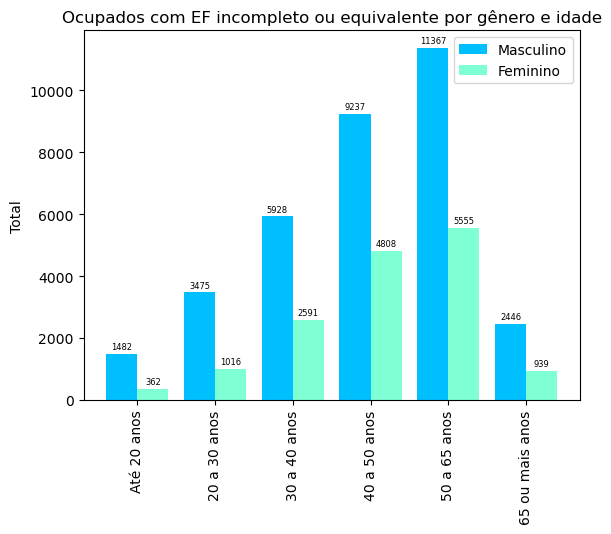

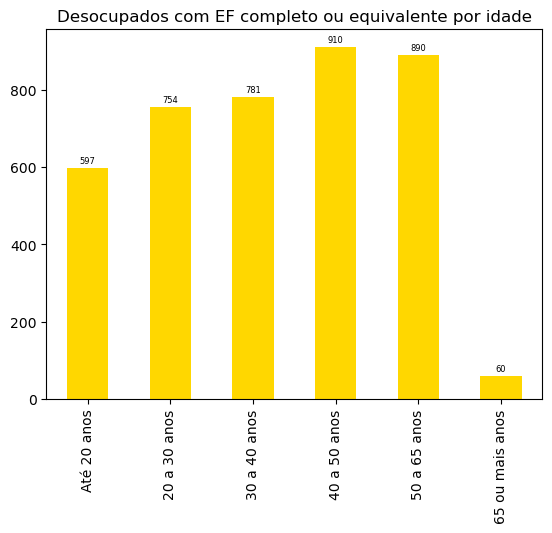

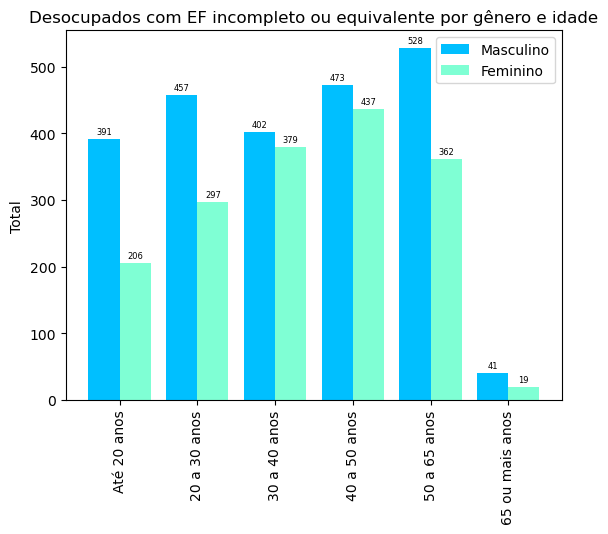

In [49]:
# Fundamental incompleto ou equivalente                     
graficoInstrucaoPorGenero(df_FundamentalIncompleto, 'Entrevistados com EF incompleto ou equivalente por gênero')
graficoEntrevistadosPorIdade(df_FundamentalIncompleto, 'Entrevistados com EF incompleto ou equivalente por idade')
s_ocupadosFundamental, s_desocupadosFundamental = ocupacao(df_FundamentalIncompleto)
graficoPorGenero(s_ocupadosFundamental, "Gênero dos ocupados com EF incompleto ou equivalente")
graficoPorGenero(s_desocupadosFundamental, "Gênero dos desocupados com EF incompleto ou equivalente")
graficoEntrevistadosPorIdade(s_ocupadosFundamental, 'Ocupados com EF completo ou equivalente por idade')
graficoPorGeneroIdade(s_ocupadosFundamental[['V2009','V2007']], 'Ocupados com EF incompleto ou equivalente por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosFundamental[['V2009','V2007']],'Desocupados com EF completo ou equivalente por idade')
graficoPorGeneroIdade(s_desocupadosFundamental[['V2009','V2007']], 'Desocupados com EF incompleto ou equivalente por gênero e idade')

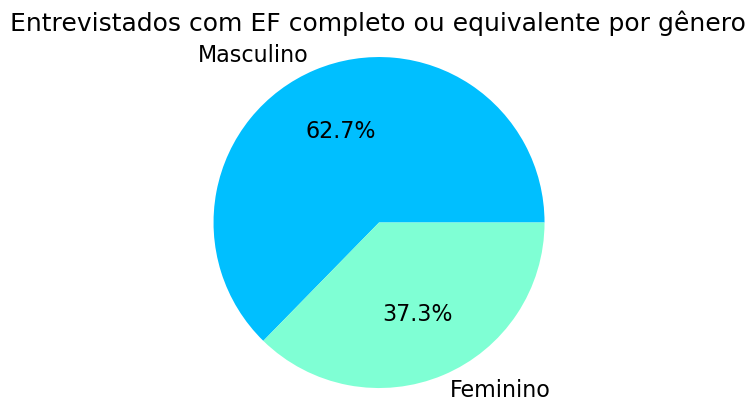

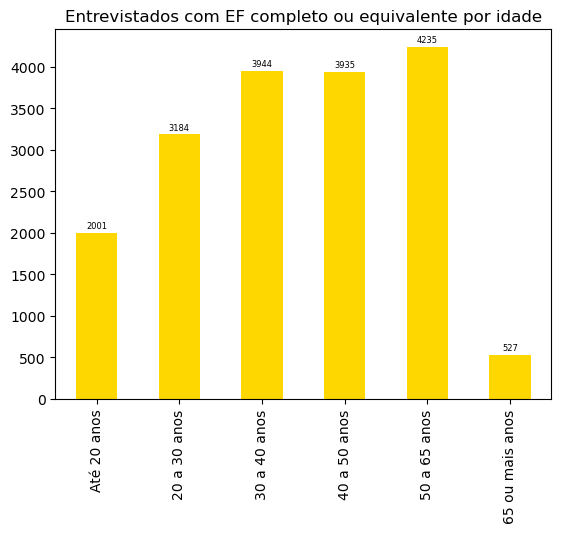

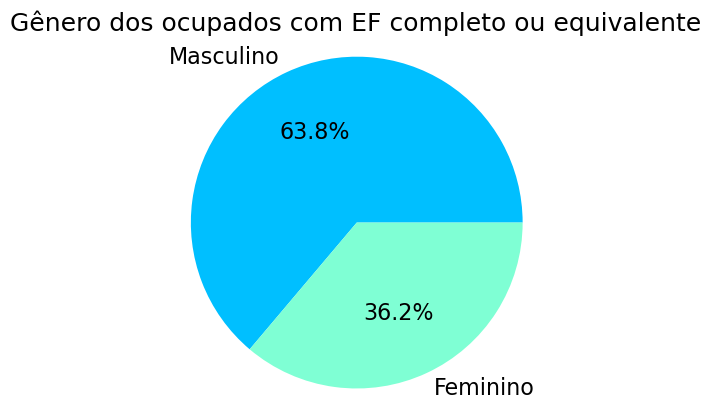

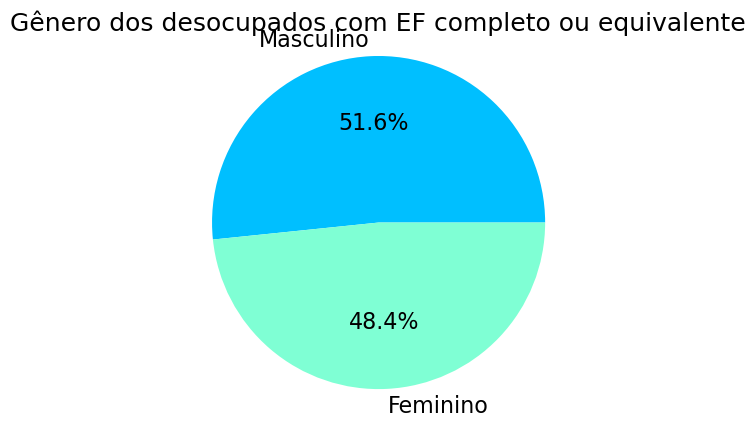

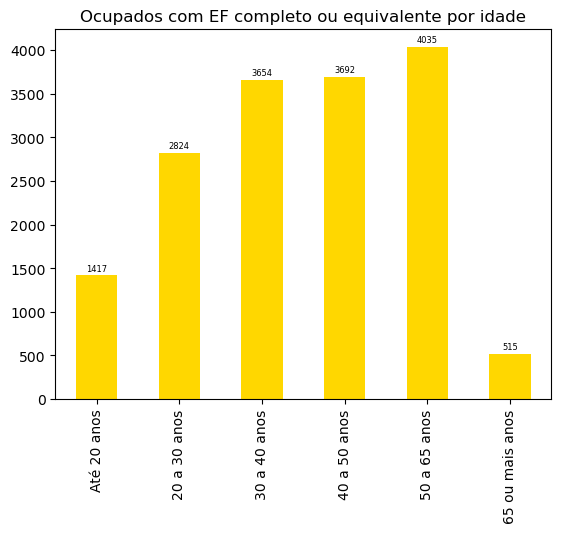

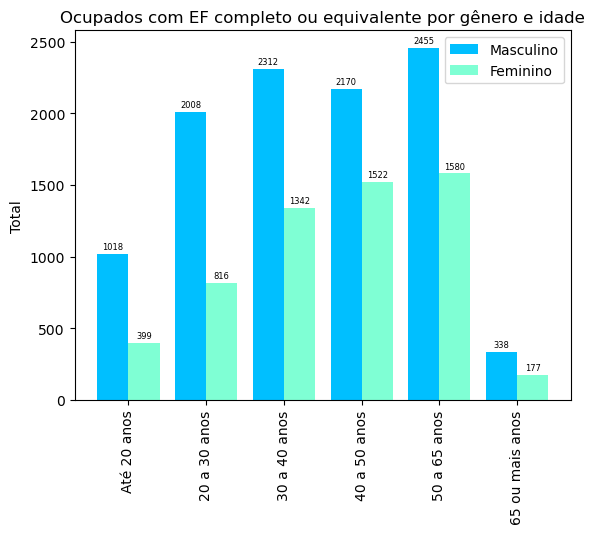

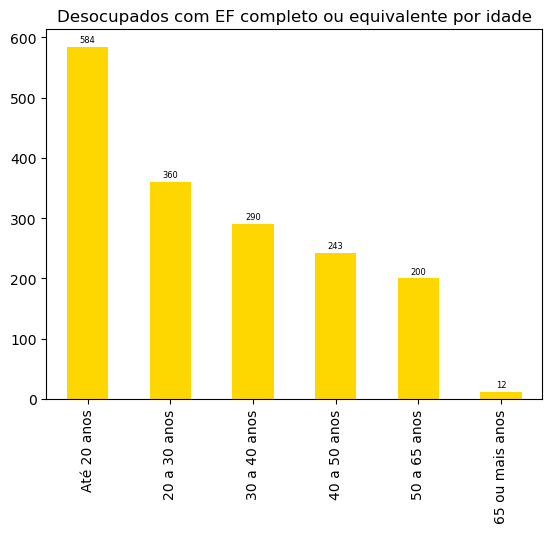

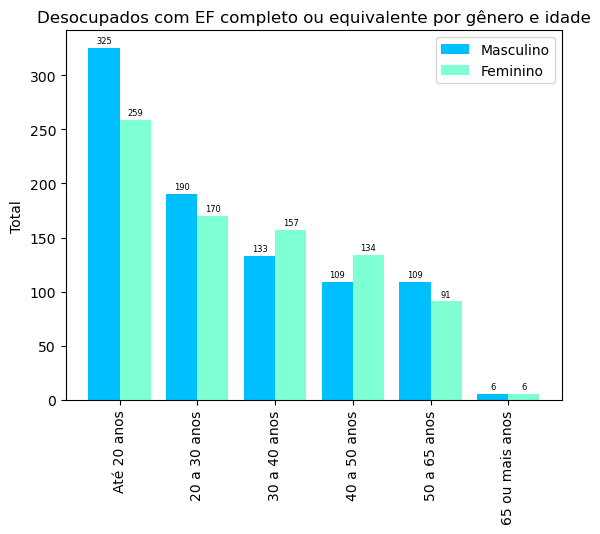

In [50]:
# Fundamental completo ou equivalente                     
graficoInstrucaoPorGenero(df_FundamentalCompleto, 'Entrevistados com EF completo ou equivalente por gênero')
graficoEntrevistadosPorIdade(df_FundamentalCompleto, 'Entrevistados com EF completo ou equivalente por idade')
s_ocupadosFundamental, s_desocupadosFundamental = ocupacao(df_FundamentalCompleto)
graficoPorGenero(s_ocupadosFundamental, "Gênero dos ocupados com EF completo ou equivalente")
graficoPorGenero(s_desocupadosFundamental, "Gênero dos desocupados com EF completo ou equivalente")
graficoEntrevistadosPorIdade(s_ocupadosFundamental, 'Ocupados com EF completo ou equivalente por idade')
graficoPorGeneroIdade(s_ocupadosFundamental[['V2009','V2007']], 'Ocupados com EF completo ou equivalente por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosFundamental[['V2009','V2007']],'Desocupados com EF completo ou equivalente por idade')
graficoPorGeneroIdade(s_desocupadosFundamental[['V2009','V2007']], 'Desocupados com EF completo ou equivalente por gênero e idade')

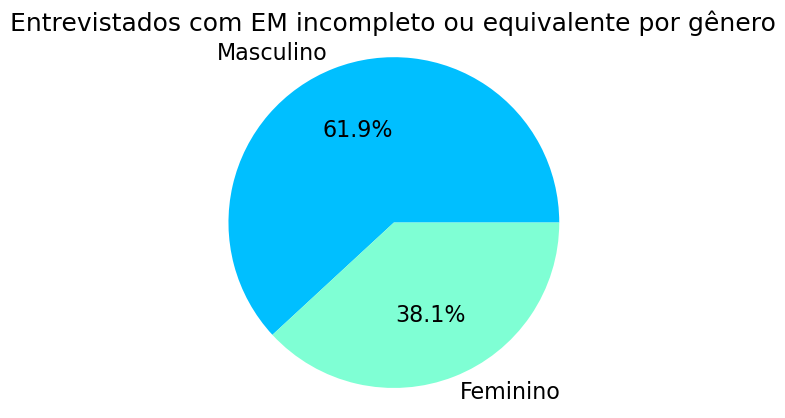

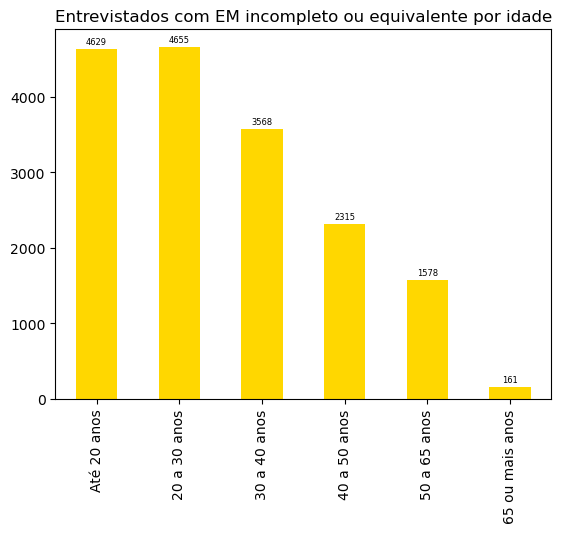

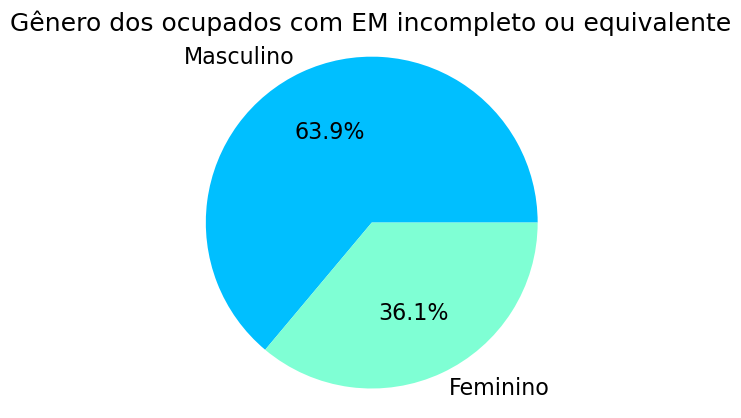

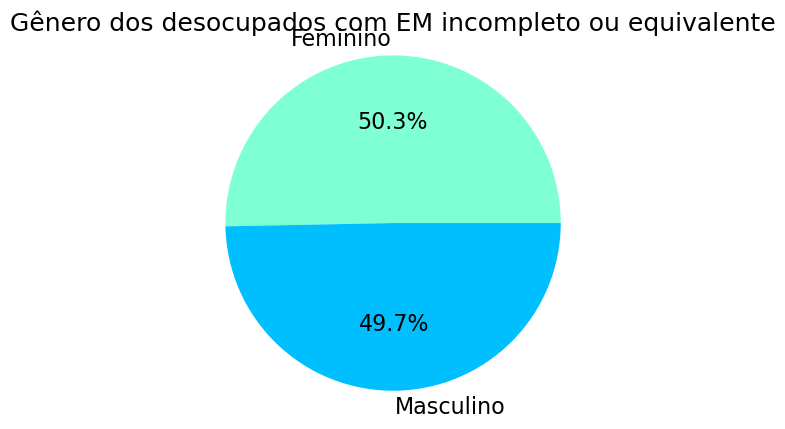

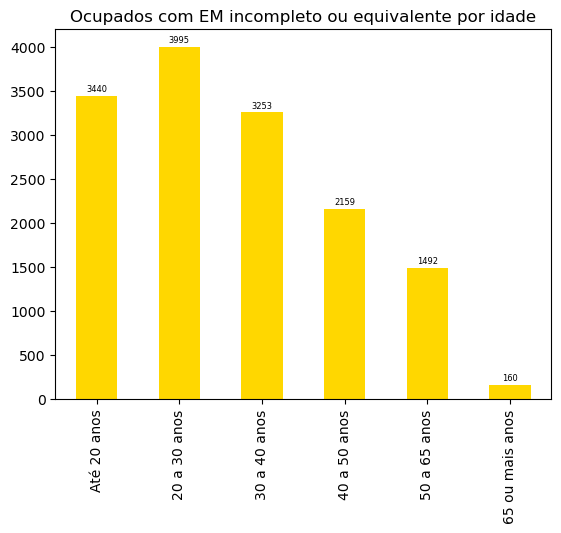

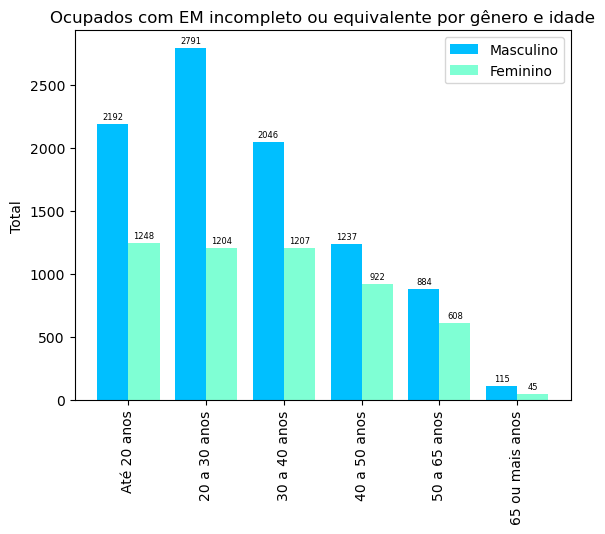

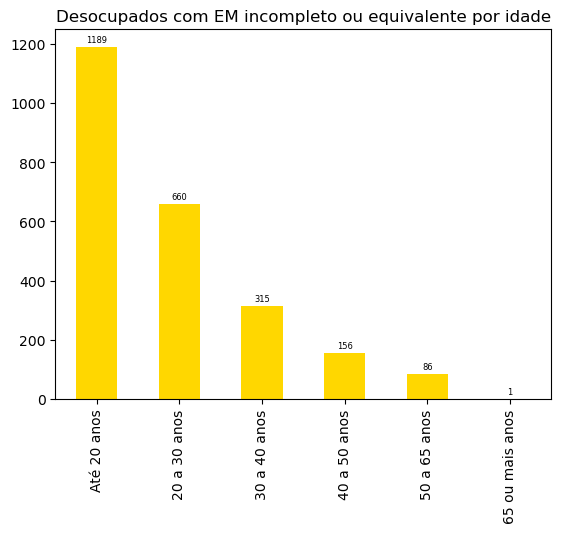

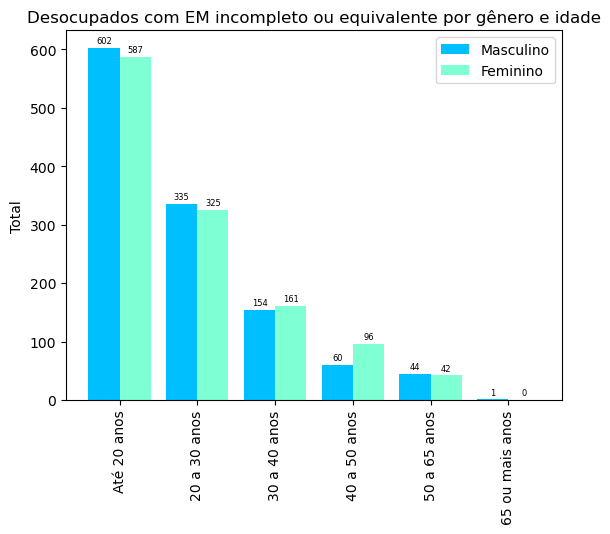

In [51]:
# Médio incompleto ou equivalente
graficoInstrucaoPorGenero(df_MedioIncompleto, 'Entrevistados com EM incompleto ou equivalente por gênero')
graficoEntrevistadosPorIdade(df_MedioIncompleto, 'Entrevistados com EM incompleto ou equivalente por idade')
s_ocupadosMI, s_desocupadosMI = ocupacao(df_MedioIncompleto)
graficoPorGenero(s_ocupadosMI, "Gênero dos ocupados com EM incompleto ou equivalente")
graficoPorGenero(s_desocupadosMI, "Gênero dos desocupados com EM incompleto ou equivalente")
graficoEntrevistadosPorIdade(s_ocupadosMI, 'Ocupados com EM incompleto ou equivalente por idade')
graficoPorGeneroIdade(s_ocupadosMI[['V2009','V2007']], 'Ocupados com EM incompleto ou equivalente por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosMI[['V2009','V2007']],'Desocupados com EM incompleto ou equivalente por idade')
graficoPorGeneroIdade(s_desocupadosMI[['V2009','V2007']], 'Desocupados com EM incompleto ou equivalente por gênero e idade')

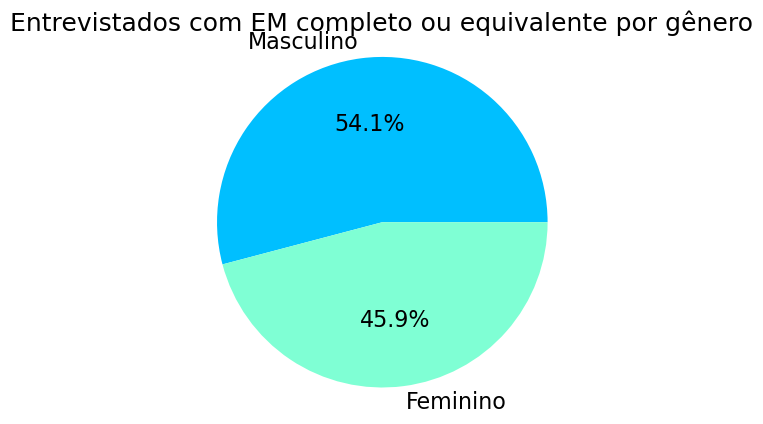

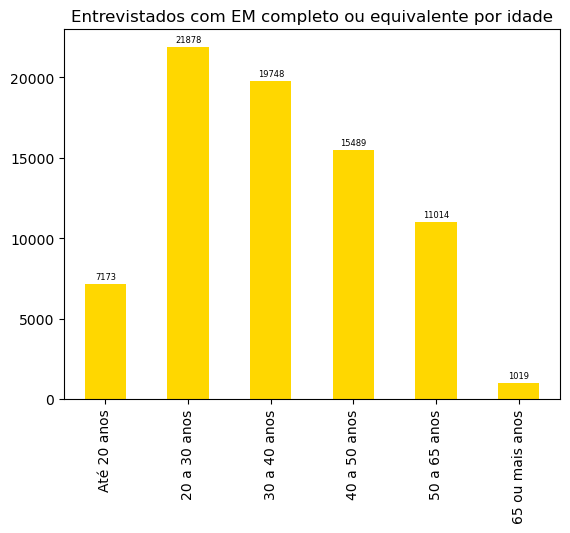

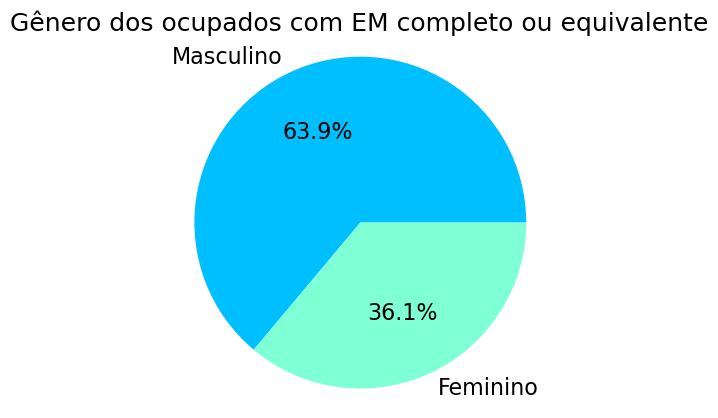

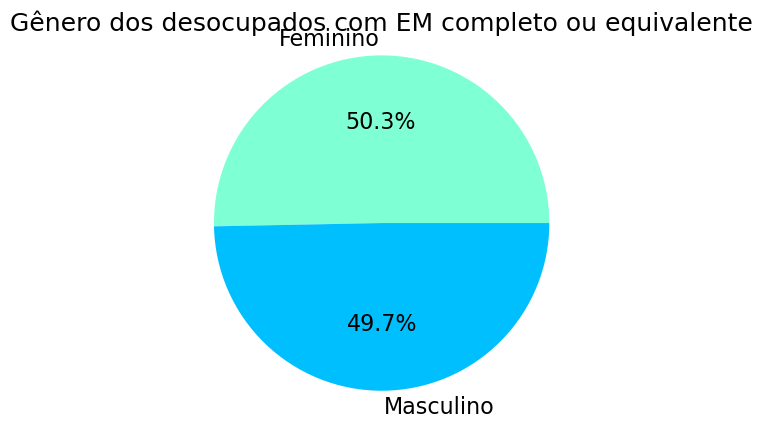

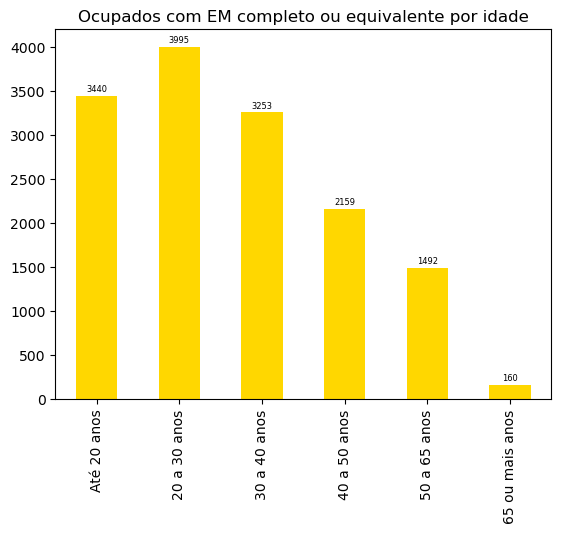

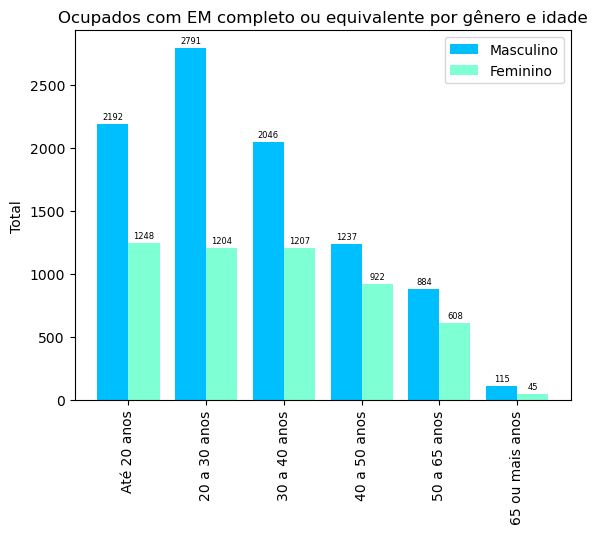

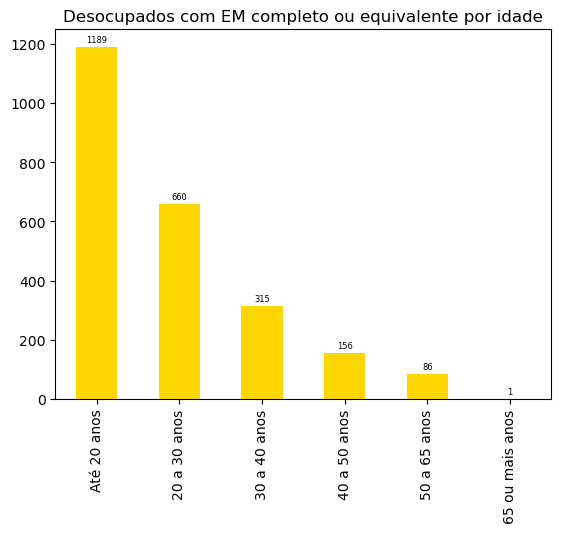

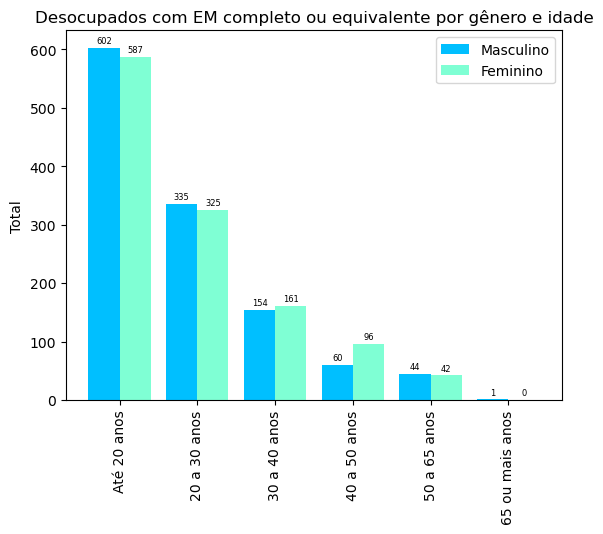

In [52]:
#  Médio completo ou equivalente
graficoInstrucaoPorGenero(df_MedioCompleto, 'Entrevistados com EM completo ou equivalente por gênero')
graficoEntrevistadosPorIdade(df_MedioCompleto, 'Entrevistados com EM completo ou equivalente por idade')
s_ocupadosMC, s_desocupadosMC = ocupacao(df_MedioIncompleto)
graficoPorGenero(s_ocupadosMC, "Gênero dos ocupados com EM completo ou equivalente")
graficoPorGenero(s_desocupadosMC, "Gênero dos desocupados com EM completo ou equivalente")
graficoEntrevistadosPorIdade(s_ocupadosMC, 'Ocupados com EM completo ou equivalente por idade')
graficoPorGeneroIdade(s_ocupadosMC[['V2009','V2007']], 'Ocupados com EM completo ou equivalente por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosMC[['V2009','V2007']],'Desocupados com EM completo ou equivalente por idade')
graficoPorGeneroIdade(s_desocupadosMC[['V2009','V2007']], 'Desocupados com EM completo ou equivalente por gênero e idade')

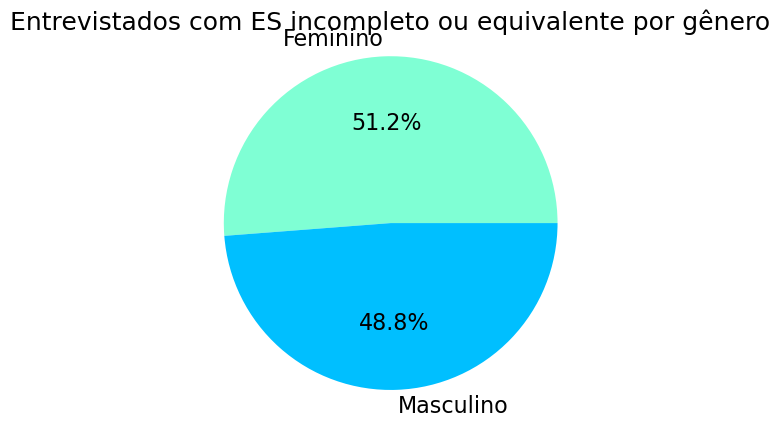

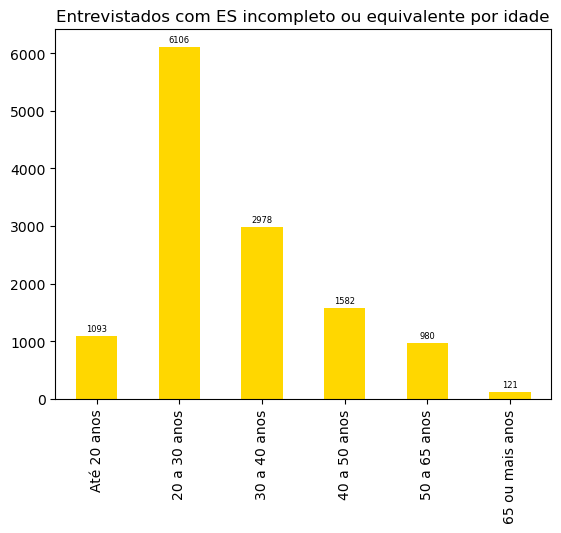

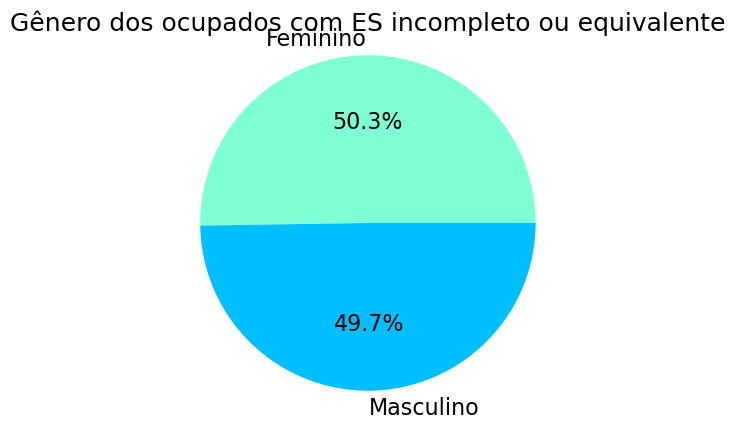

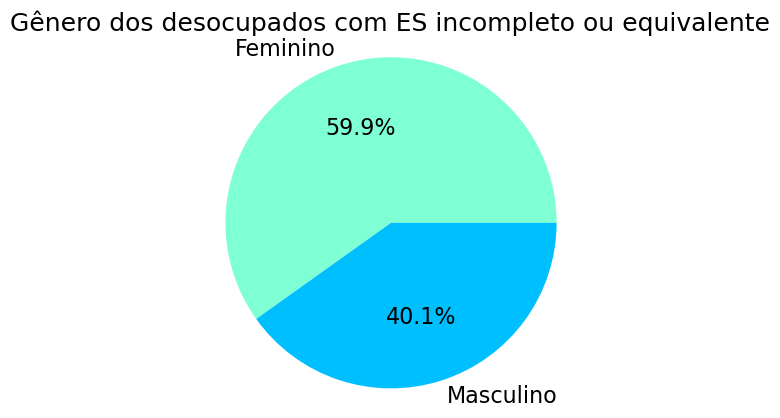

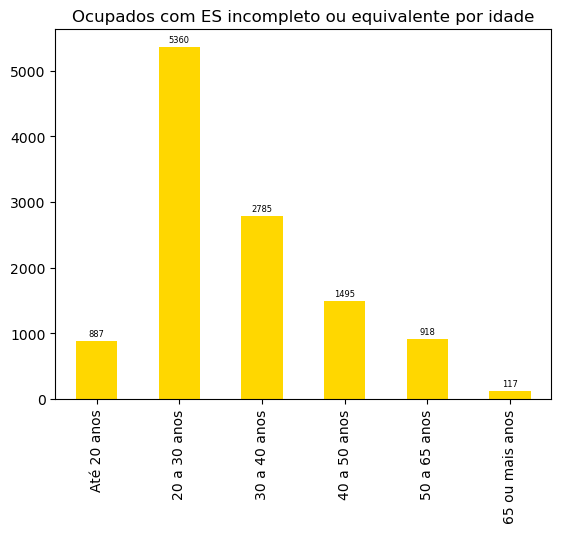

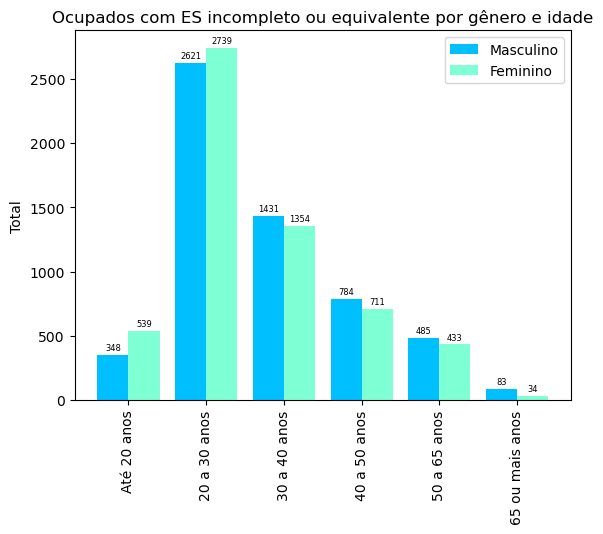

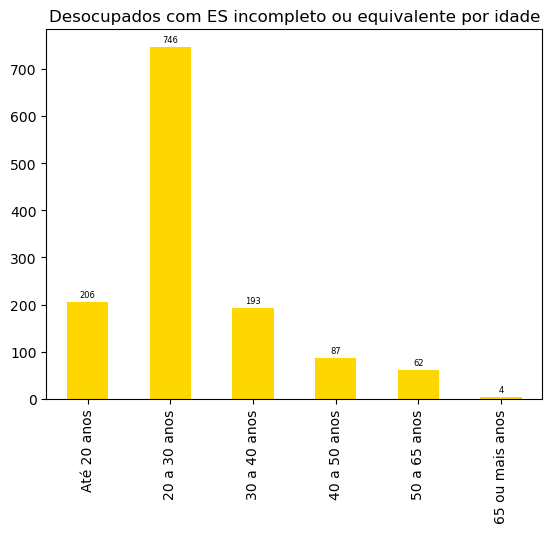

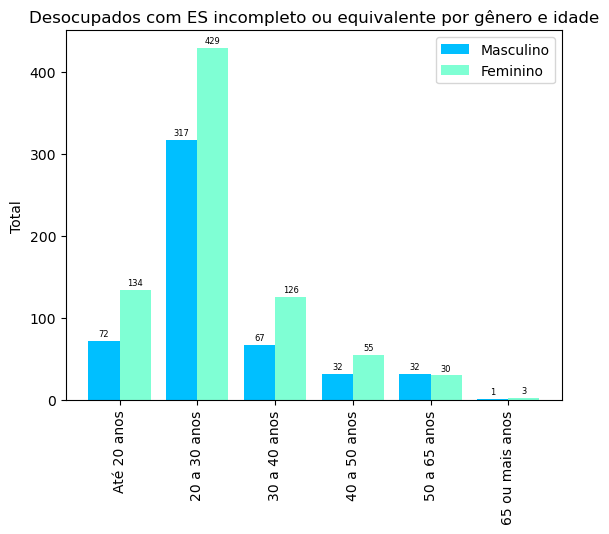

In [53]:
# 6 - Superior incompleto
graficoInstrucaoPorGenero(df_SupIncompleto, 'Entrevistados com ES incompleto ou equivalente por gênero')
graficoEntrevistadosPorIdade(df_SupIncompleto, 'Entrevistados com ES incompleto ou equivalente por idade')
s_ocupadosSI, s_desocupadosSI = ocupacao(df_SupIncompleto)
graficoPorGenero(s_ocupadosSI, "Gênero dos ocupados com ES incompleto ou equivalente")
graficoPorGenero(s_desocupadosSI, "Gênero dos desocupados com ES incompleto ou equivalente")
graficoEntrevistadosPorIdade(s_ocupadosSI, 'Ocupados com ES incompleto ou equivalente por idade')
graficoPorGeneroIdade(s_ocupadosSI[['V2009','V2007']], 'Ocupados com ES incompleto ou equivalente por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosSI[['V2009','V2007']],'Desocupados com ES incompleto ou equivalente por idade')
graficoPorGeneroIdade(s_desocupadosSI[['V2009','V2007']], 'Desocupados com ES incompleto ou equivalente por gênero e idade')    

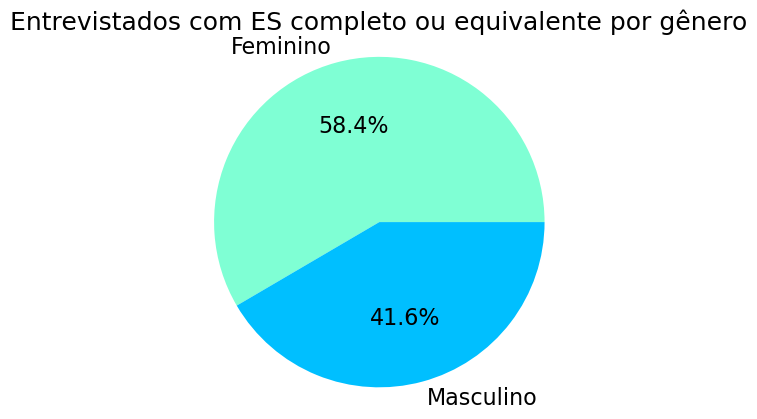

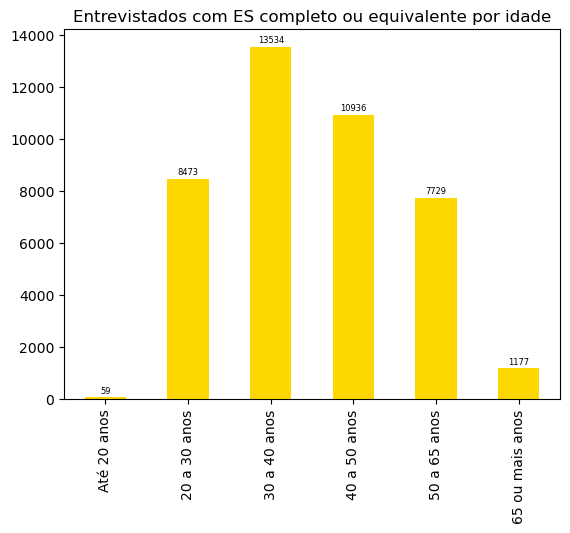

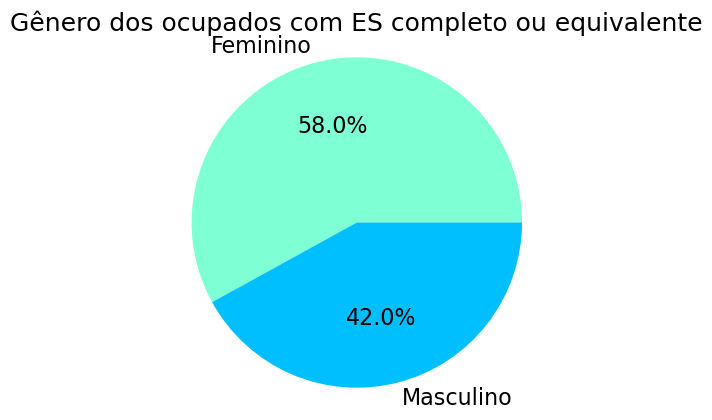

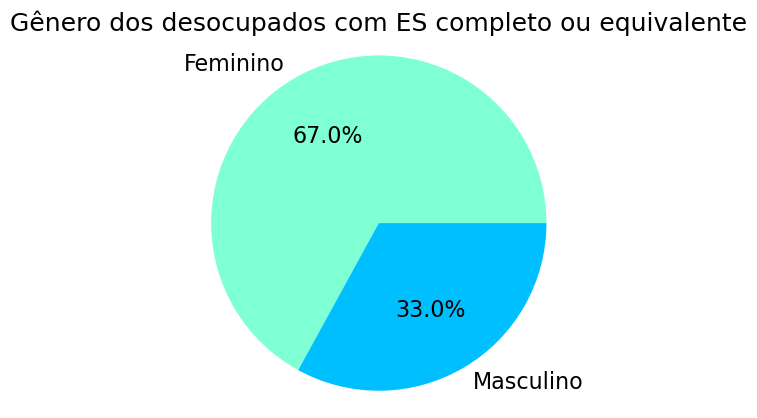

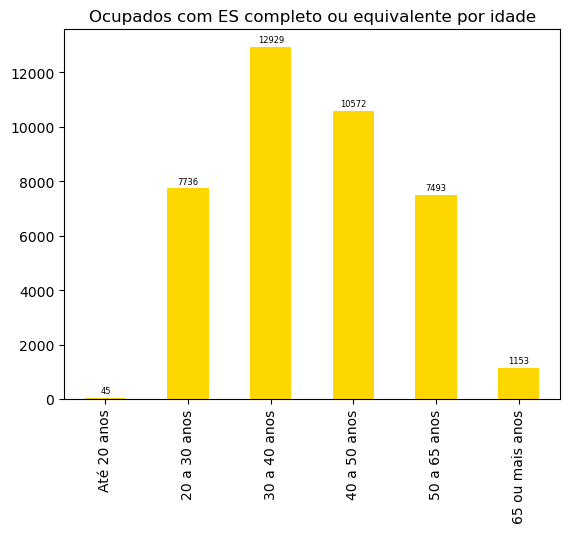

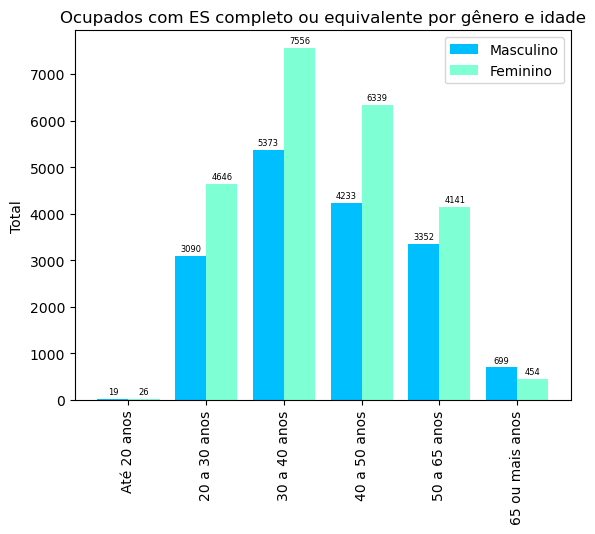

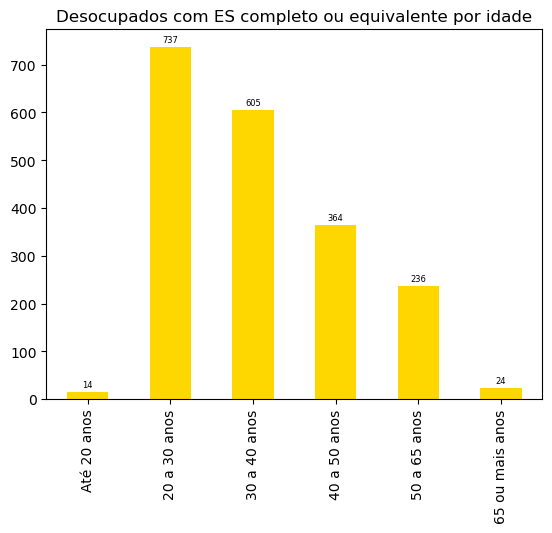

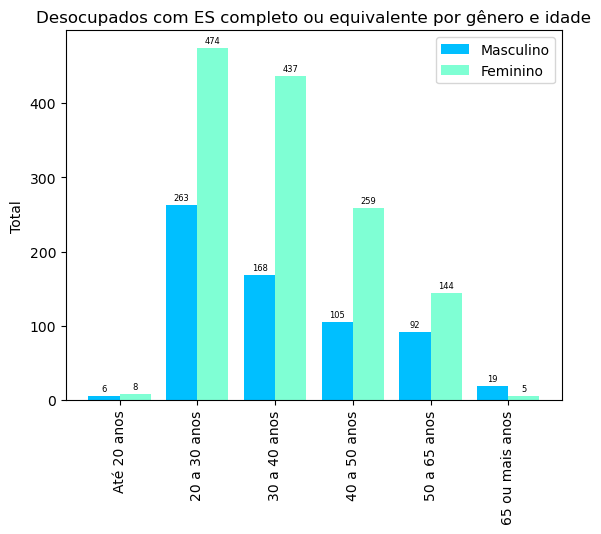

In [54]:
# 7 - Superior completo
graficoInstrucaoPorGenero(df_SupCompleto, 'Entrevistados com ES completo ou equivalente por gênero')
graficoEntrevistadosPorIdade(df_SupCompleto, 'Entrevistados com ES completo ou equivalente por idade')
s_ocupadosSC, s_desocupadosSC = ocupacao(df_SupCompleto)
graficoPorGenero(s_ocupadosSC, "Gênero dos ocupados com ES completo ou equivalente")
graficoPorGenero(s_desocupadosSC, "Gênero dos desocupados com ES completo ou equivalente")
graficoEntrevistadosPorIdade(s_ocupadosSC, 'Ocupados com ES completo ou equivalente por idade')
graficoPorGeneroIdade(s_ocupadosSC[['V2009','V2007']], 'Ocupados com ES completo ou equivalente por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosSC[['V2009','V2007']],'Desocupados com ES completo ou equivalente por idade')
graficoPorGeneroIdade(s_desocupadosSC[['V2009','V2007']], 'Desocupados com ES completo ou equivalente por gênero e idade')

In [55]:
# 3o Trimestre
df_terceiroTri = carregaTrimestre('PNADC_032022_vd.csv')

In [56]:
df_terceiroTri.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 487786 entries, 0 to 487785
Data columns (total 28 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Unnamed: 0  487786 non-null  int64  
 1   V2007       487786 non-null  int64  
 2   V2009       487786 non-null  int64  
 3   V3002       459244 non-null  float64
 4   V3008       342902 non-null  float64
 5   V3003A      116342 non-null  float64
 6   V3006       104081 non-null  float64
 7   V3006A      315 non-null     float64
 8   V3009A      322092 non-null  float64
 9   V3014       310574 non-null  float64
 10  V3010       89211 non-null   float64
 11  V3012       298727 non-null  float64
 12  V3013B      213 non-null     float64
 13  V3013A      369 non-null     float64
 14  V3013       289526 non-null  float64
 15  V3005A      17772 non-null   float64
 16  V3011A      45335 non-null   float64
 17  V3007       17772 non-null   float64
 18  V4009       211422 non-null  float64
 19  V4

In [57]:
# Iniciando tratamenos com a variavel VD4002 (Condição de ocupação)
# Verificando os valores que existem para a variavel
df_terceiroTri['VD4002'].unique()

array([ 1., nan,  2.])

In [58]:
# Reduzindo o dataframe apenas para os entrevistados ocupados e desocupados, desconsiderando os não aplicáveis
df_terceiroTriFiltrado = df_terceiroTri[(df_terceiroTri['VD4002'] == 1.0) | (df_terceiroTri['VD4002'] == 2.0)]
df_terceiroTriFiltrado['VD4002'].unique()

array([1., 2.])

In [59]:
df_terceiroTriFiltrado.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 230051 entries, 0 to 487784
Data columns (total 28 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Unnamed: 0  230051 non-null  int64  
 1   V2007       230051 non-null  int64  
 2   V2009       230051 non-null  int64  
 3   V3002       230051 non-null  float64
 4   V3008       205317 non-null  float64
 5   V3003A      24734 non-null   float64
 6   V3006       21458 non-null   float64
 7   V3006A      113 non-null     float64
 8   V3009A      200443 non-null  float64
 9   V3014       194927 non-null  float64
 10  V3010       53981 non-null   float64
 11  V3012       185906 non-null  float64
 12  V3013B      88 non-null      float64
 13  V3013A      184 non-null     float64
 14  V3013       182050 non-null  float64
 15  V3005A      12628 non-null   float64
 16  V3011A      35278 non-null   float64
 17  V3007       12628 non-null   float64
 18  V4009       211422 non-null  float64
 19  V4

In [60]:
df_terceiroTriFiltrado['VD3004'].unique()

array([5., 2., 4., 3., 1., 7., 6.])

In [61]:
# Filtrando apenas os campos necessários para as análises
df_terceiroTriFinal = df_terceiroTriFiltrado.loc[:, ['V2007', 'V2009', 'VD4002', 'VD3004']]
df_terceiroTriFinal

,V2007,V2009,VD4002,VD3004
0,2,38,1.0,5.0
1,1,42,1.0,2.0
8,1,20,1.0,4.0
10,1,26,1.0,4.0
11,1,19,1.0,3.0
...,...,...,...,...
487777,2,64,1.0,7.0
487780,1,46,1.0,7.0
487782,2,36,1.0,7.0
487783,2,41,1.0,5.0


In [62]:
df_terceiroTriFinal['trimestre'] = 3

In [63]:
# Verificação de valores 
df_genero = df_terceiroTriFinal['V2007']
df_genero.isnull().sum()
genero_entrevistados = df_genero.value_counts()
genero_entrevistados.info()

<class 'pandas.core.series.Series'>
Int64Index: 2 entries, 1 to 2
Series name: V2007
Non-Null Count  Dtype
--------------  -----
2 non-null      int64
dtypes: int64(1)
memory usage: 32.0 bytes


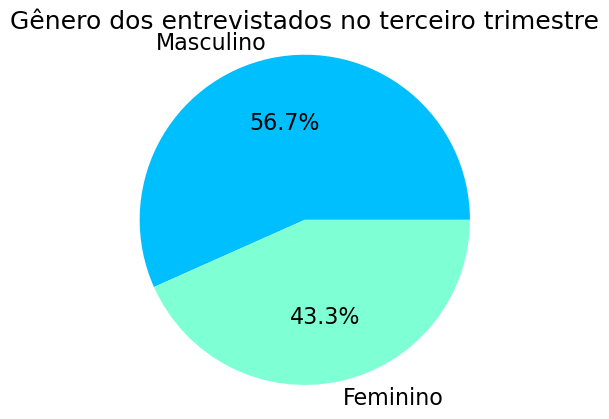

In [64]:
# Grafico de entrevistados por genero
graficoPorGenero(df_terceiroTriFinal, 'Gênero dos entrevistados no terceiro trimestre')

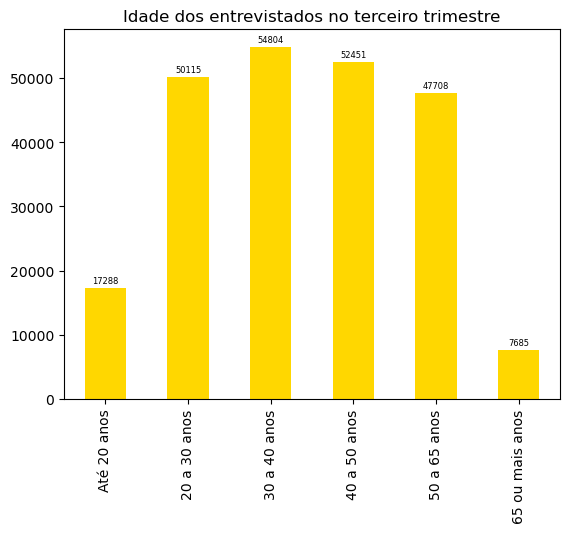

In [65]:
# Grafico por idade 
graficoEntrevistadosPorIdade(df_terceiroTriFinal, 'Idade dos entrevistados no terceiro trimestre')

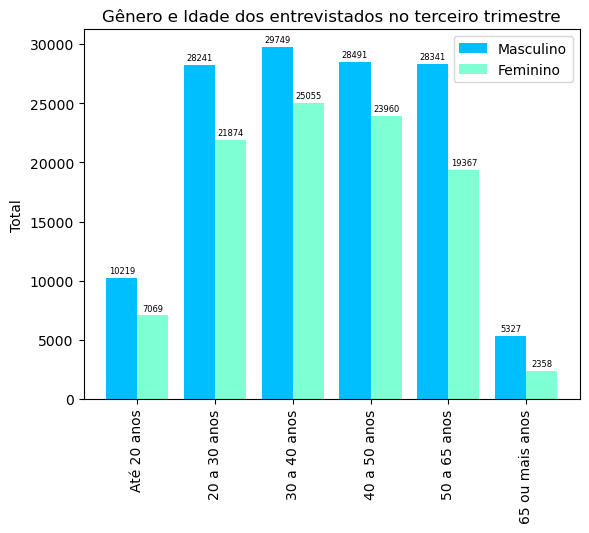

In [66]:
# Grafico por genero e idade
graficoPorGeneroIdade(df_terceiroTriFinal, 'Gênero e Idade dos entrevistados no terceiro trimestre')

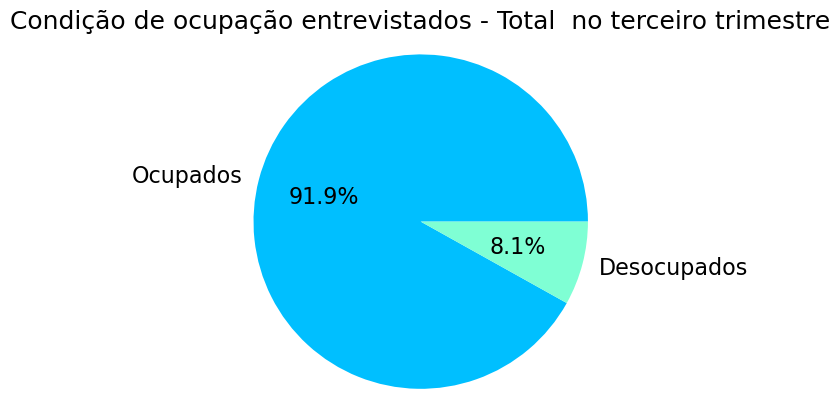

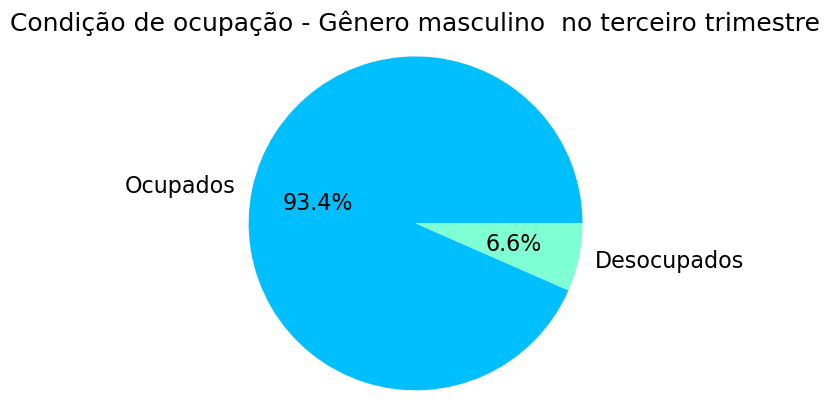

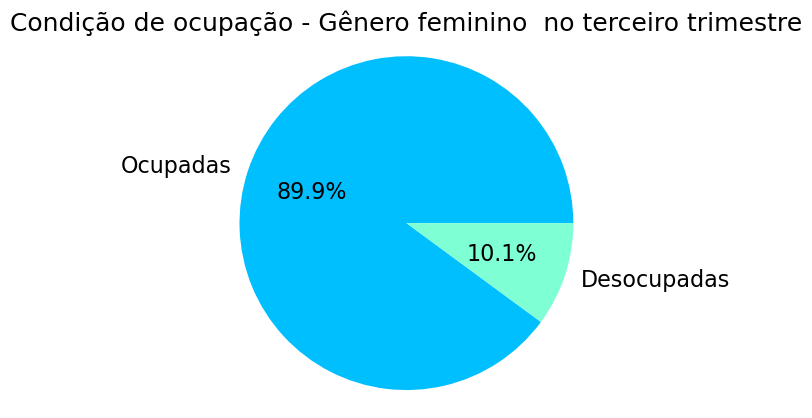

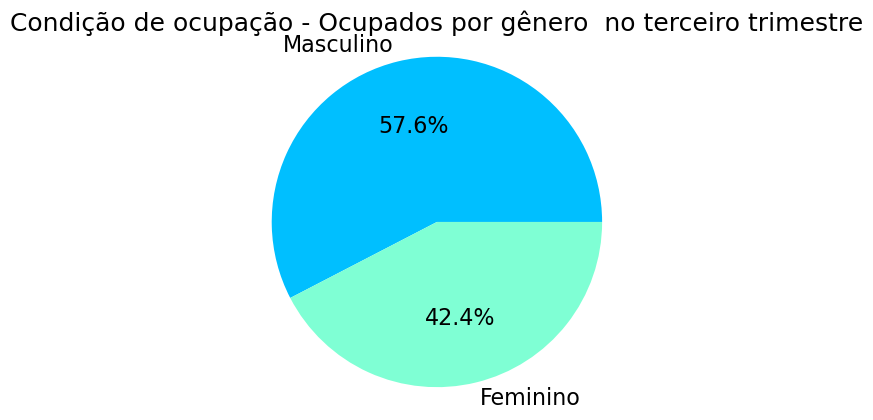

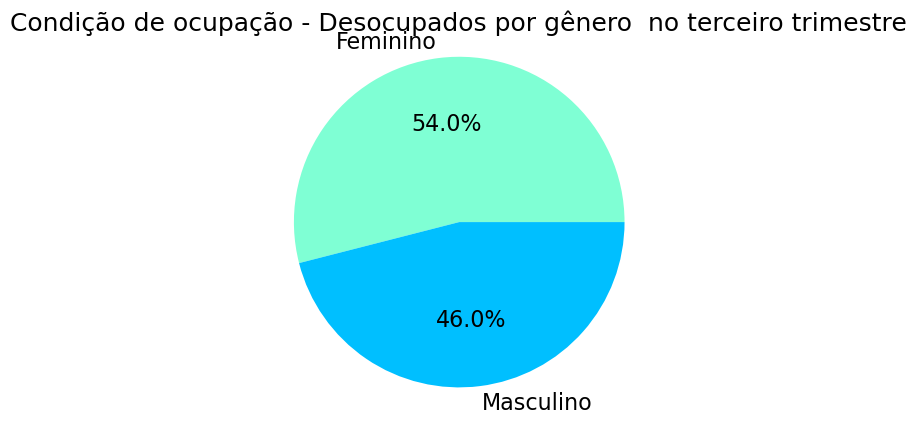

In [67]:
graficoOcupacao(df_terceiroTriFinal, ' no terceiro trimestre')

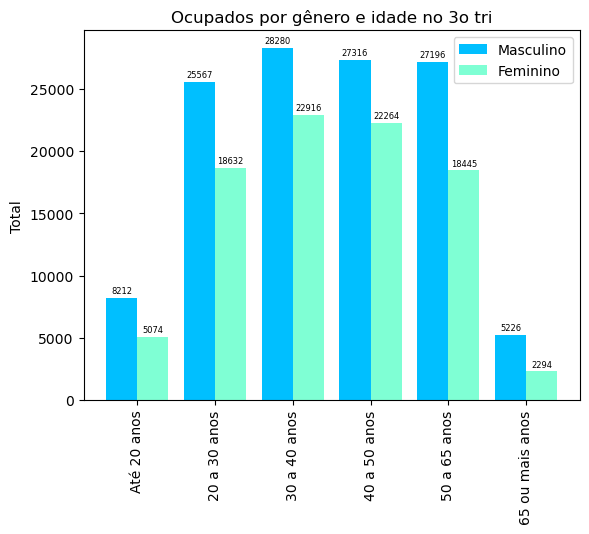

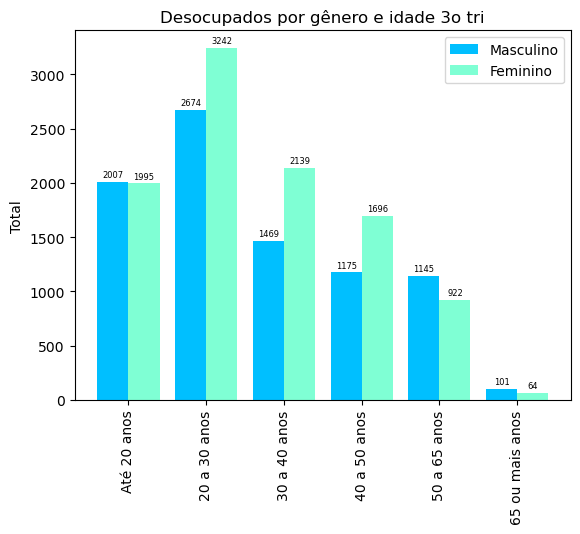

In [68]:
# Ocupados x Genero e Idade
#graficoPorGeneroIdade(df_primeiroTriFinal, )

s_ocupados, s_desocupados = ocupacao(df_terceiroTriFinal)

graficoPorGeneroIdade(s_ocupados, 'Ocupados por gênero e idade no 3o tri')
graficoPorGeneroIdade(s_desocupados, 'Desocupados por gênero e idade 3o tri')

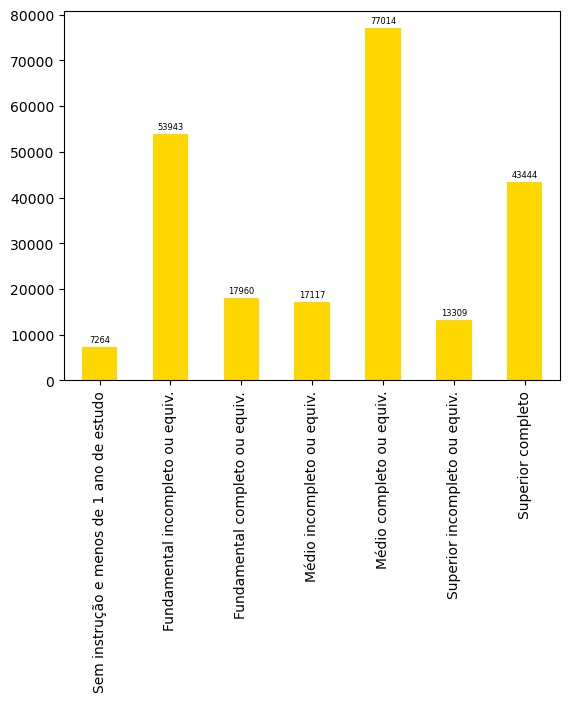

In [69]:
# Instrução dos entrevistados
graficoGrauInstrucao(df_terceiroTriFinal, 'Grau de instrução dos entrevistados no 3o tri')

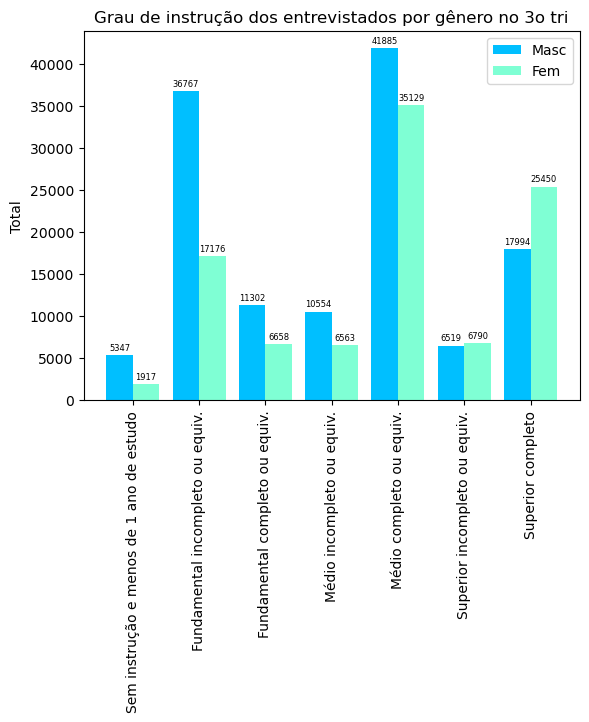

In [136]:
# Instrução dos entrevistados por sexo
graficoInstrucaoSexo(df_terceiroTriFinal, 'Grau de instrução dos entrevistados por gênero no 3o tri')

In [71]:
# Instrução
df_SemInstrucao,df_FundamentalIncompleto, df_FundamentalCompleto,  df_MedioIncompleto,  df_MedioCompleto, df_SupIncompleto, df_SupCompleto = instrucao(df_terceiroTriFinal)

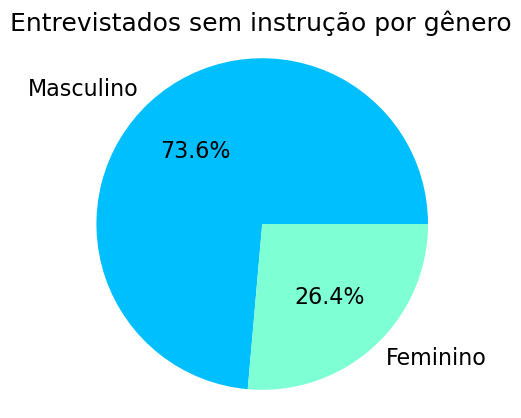

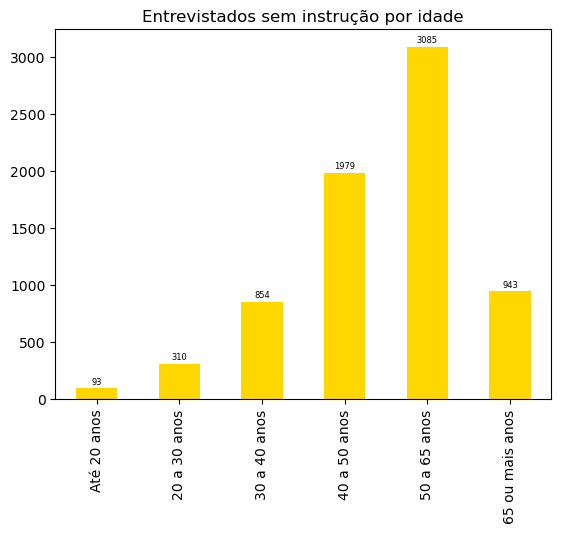

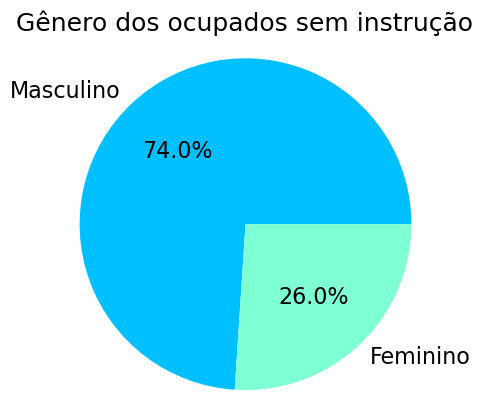

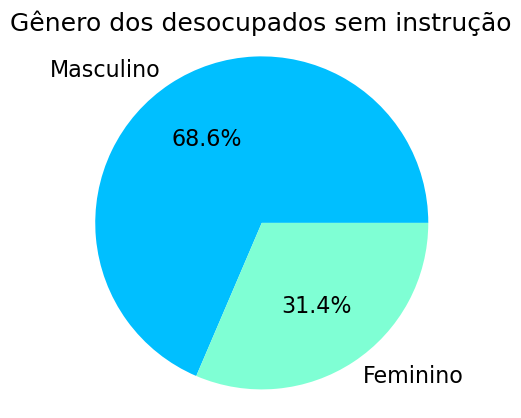

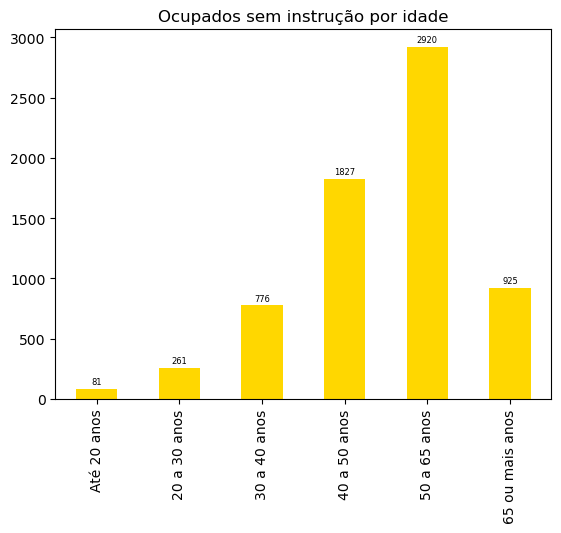

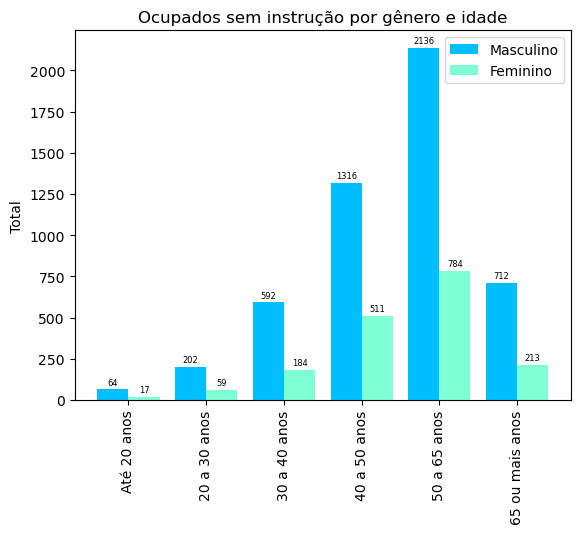

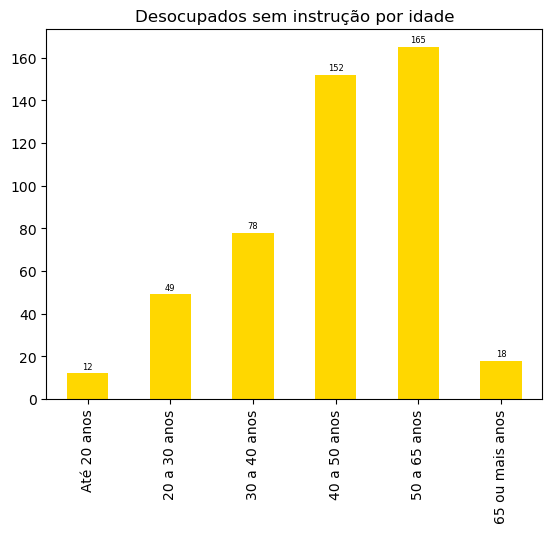

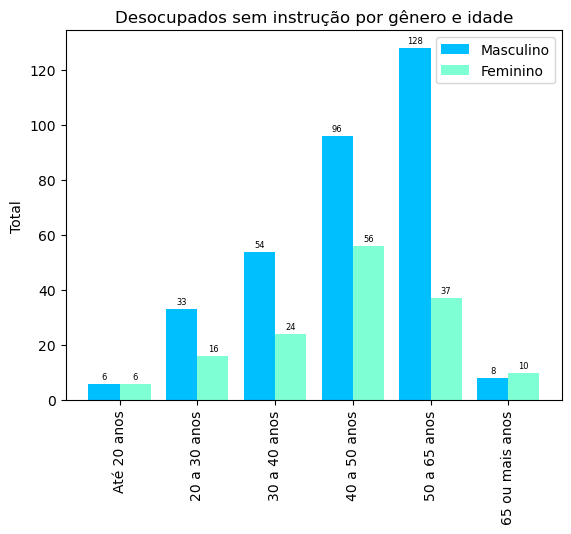

In [72]:
graficoInstrucaoPorGenero(df_SemInstrucao, 'Entrevistados sem instrução por gênero')
graficoEntrevistadosPorIdade(df_SemInstrucao, 'Entrevistados sem instrução por idade')

s_ocupadosSemInstrucao, s_desocupadosSemInstrucao = ocupacao(df_SemInstrucao)
graficoPorGenero(s_ocupadosSemInstrucao, "Gênero dos ocupados sem instrução")
graficoPorGenero(s_desocupadosSemInstrucao, "Gênero dos desocupados sem instrução")
graficoEntrevistadosPorIdade(s_ocupadosSemInstrucao, 'Ocupados sem instrução por idade')
graficoPorGeneroIdade(s_ocupadosSemInstrucao[['V2009','V2007']], 'Ocupados sem instrução por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosSemInstrucao[['V2009','V2007']],'Desocupados sem instrução por idade')
graficoPorGeneroIdade(s_desocupadosSemInstrucao[['V2009','V2007']], 'Desocupados sem instrução por gênero e idade')

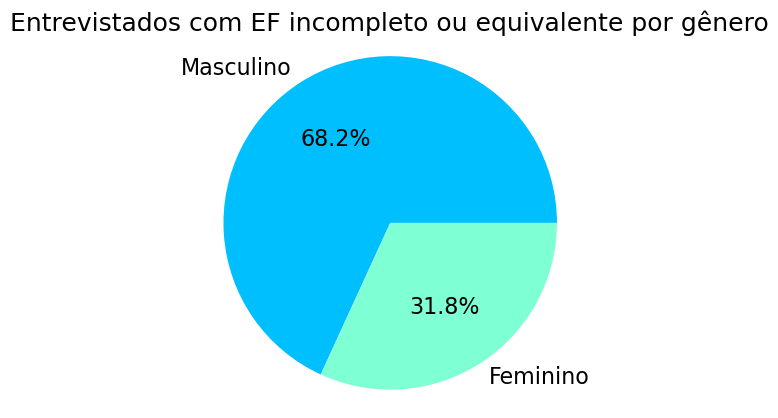

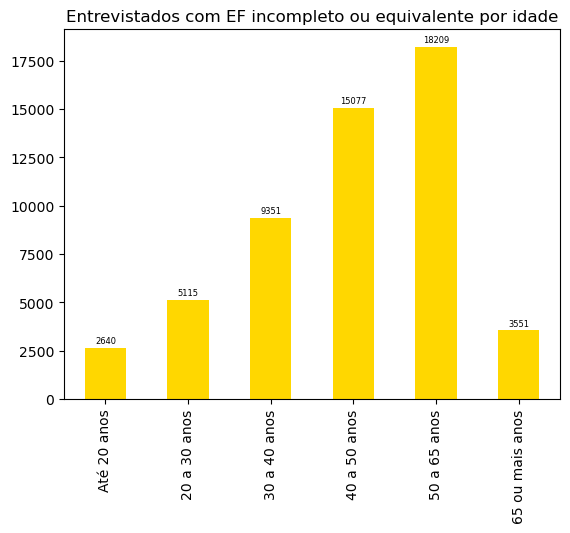

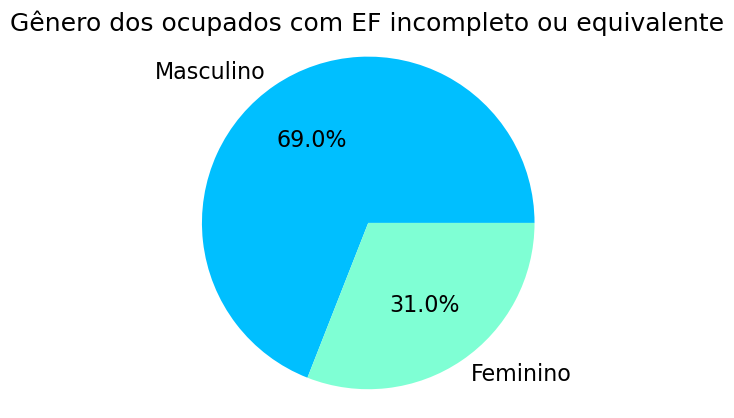

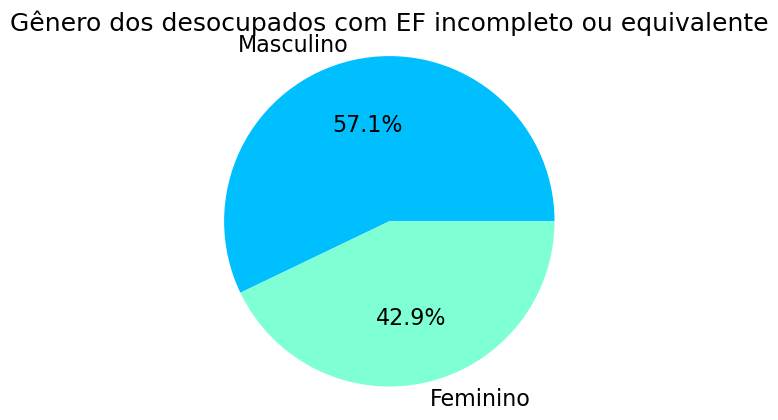

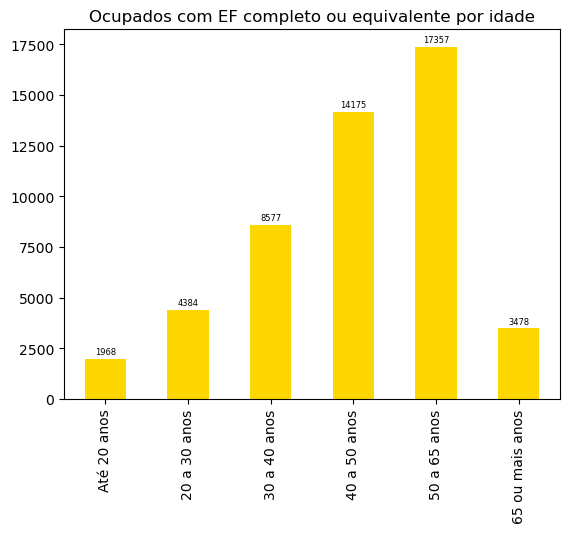

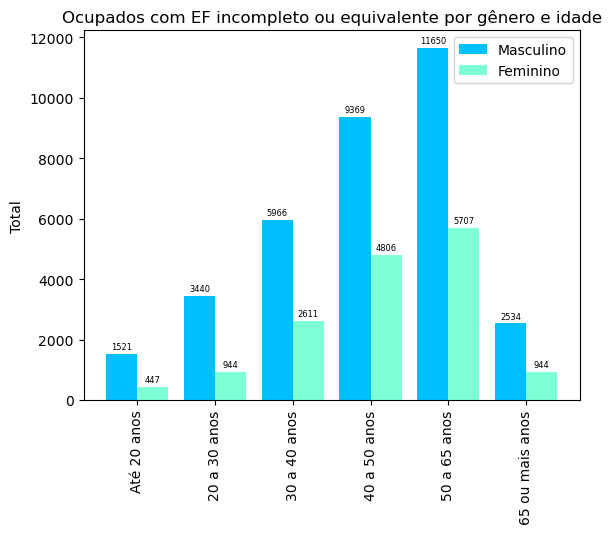

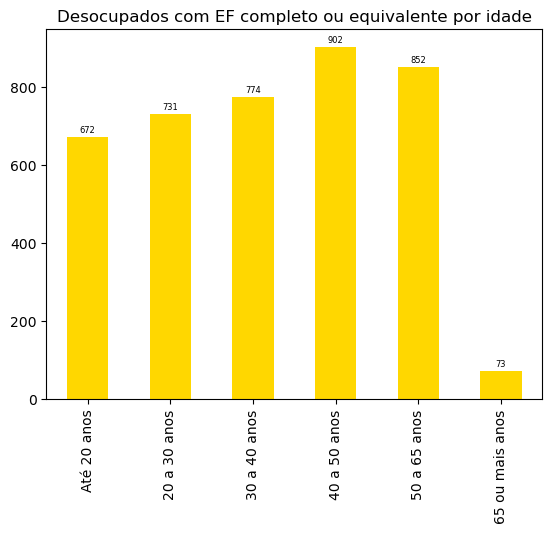

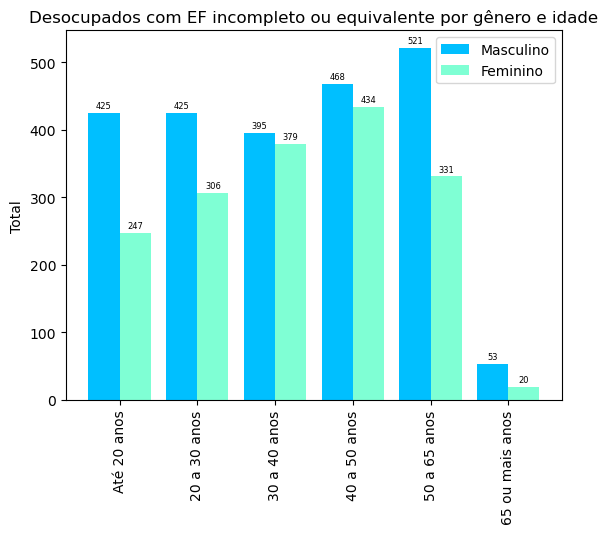

In [73]:
# Fundamental incompleto ou equivalente                     
graficoInstrucaoPorGenero(df_FundamentalIncompleto, 'Entrevistados com EF incompleto ou equivalente por gênero')
graficoEntrevistadosPorIdade(df_FundamentalIncompleto, 'Entrevistados com EF incompleto ou equivalente por idade')

s_ocupadosFundamental, s_desocupadosFundamental = ocupacao(df_FundamentalIncompleto)
graficoPorGenero(s_ocupadosFundamental, "Gênero dos ocupados com EF incompleto ou equivalente")
graficoPorGenero(s_desocupadosFundamental, "Gênero dos desocupados com EF incompleto ou equivalente")
graficoEntrevistadosPorIdade(s_ocupadosFundamental, 'Ocupados com EF completo ou equivalente por idade')
graficoPorGeneroIdade(s_ocupadosFundamental[['V2009','V2007']], 'Ocupados com EF incompleto ou equivalente por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosFundamental[['V2009','V2007']],'Desocupados com EF completo ou equivalente por idade')
graficoPorGeneroIdade(s_desocupadosFundamental[['V2009','V2007']], 'Desocupados com EF incompleto ou equivalente por gênero e idade')

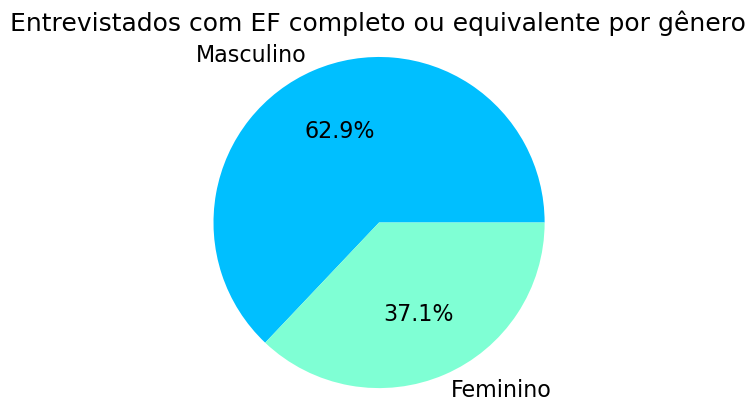

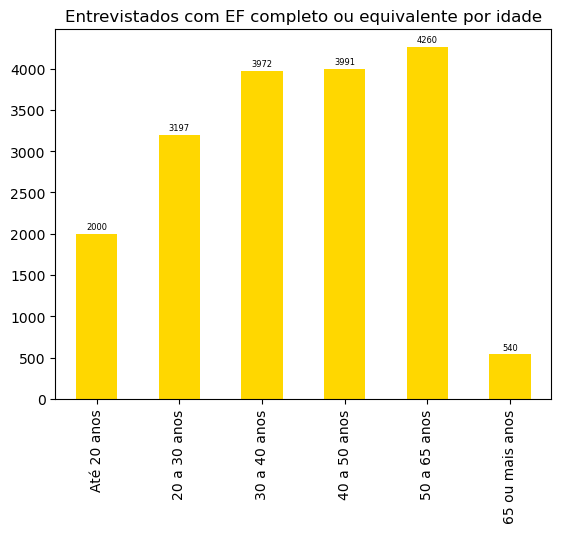

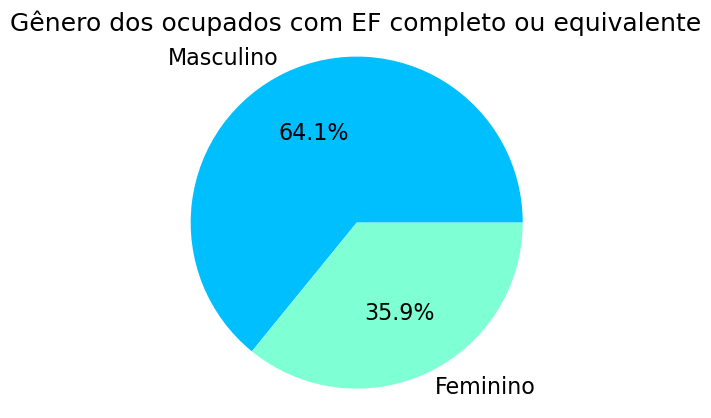

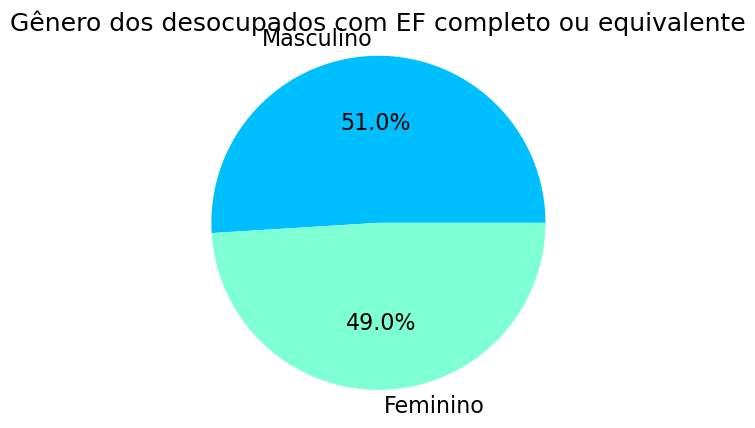

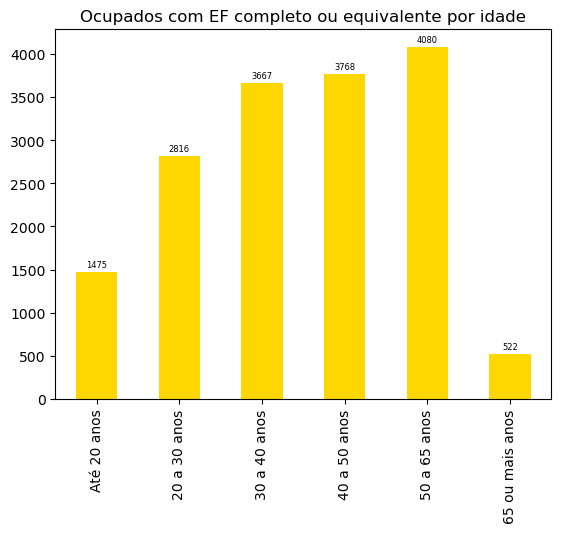

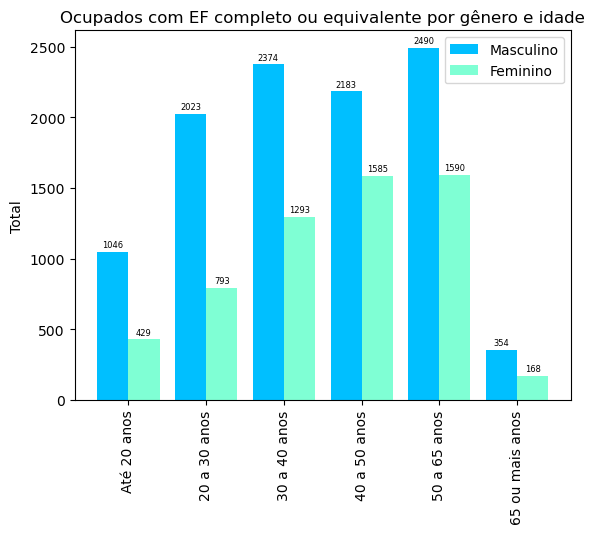

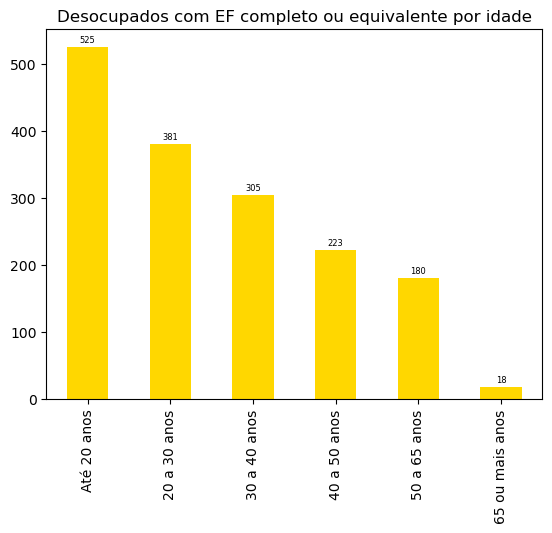

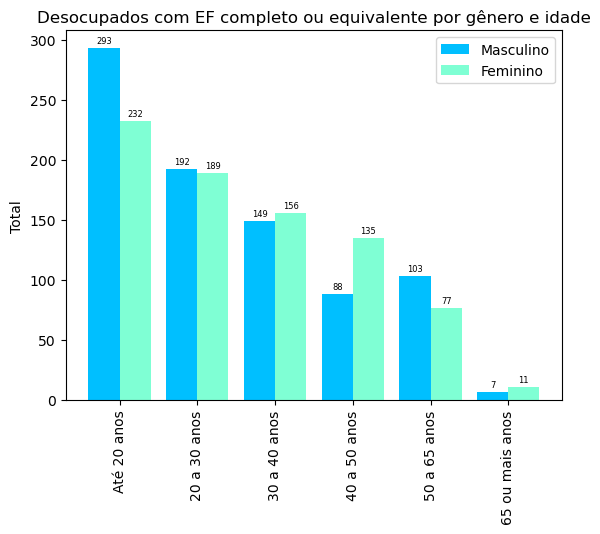

In [74]:
# Fundamental completo ou equivalente                     
graficoInstrucaoPorGenero(df_FundamentalCompleto, 'Entrevistados com EF completo ou equivalente por gênero')
graficoEntrevistadosPorIdade(df_FundamentalCompleto, 'Entrevistados com EF completo ou equivalente por idade')

s_ocupadosFundamental, s_desocupadosFundamental = ocupacao(df_FundamentalCompleto)
graficoPorGenero(s_ocupadosFundamental, "Gênero dos ocupados com EF completo ou equivalente")
graficoPorGenero(s_desocupadosFundamental, "Gênero dos desocupados com EF completo ou equivalente")
graficoEntrevistadosPorIdade(s_ocupadosFundamental, 'Ocupados com EF completo ou equivalente por idade')
graficoPorGeneroIdade(s_ocupadosFundamental[['V2009','V2007']], 'Ocupados com EF completo ou equivalente por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosFundamental[['V2009','V2007']],'Desocupados com EF completo ou equivalente por idade')
graficoPorGeneroIdade(s_desocupadosFundamental[['V2009','V2007']], 'Desocupados com EF completo ou equivalente por gênero e idade')

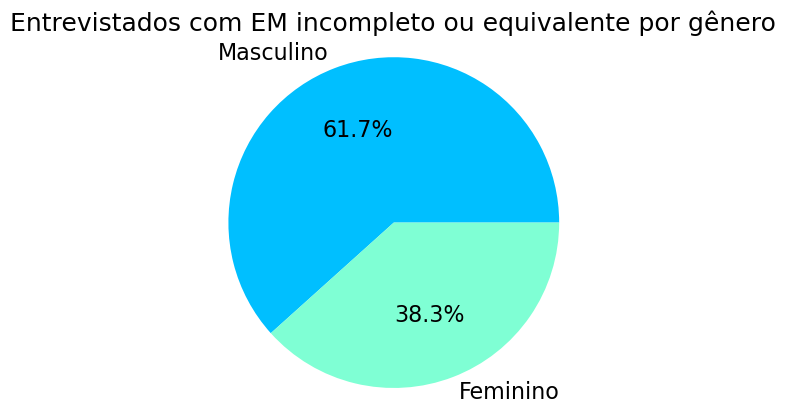

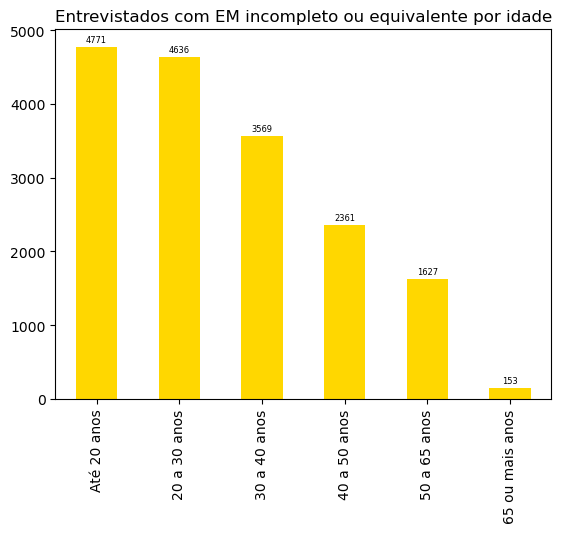

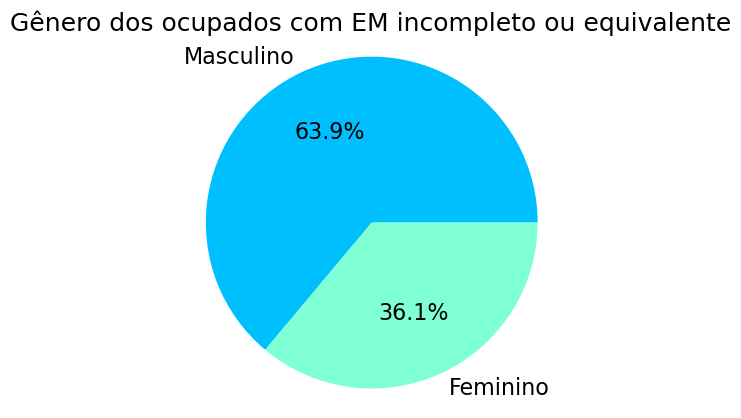

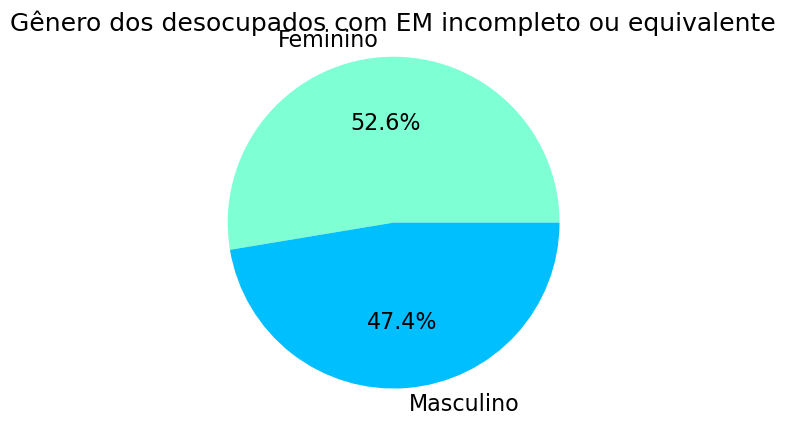

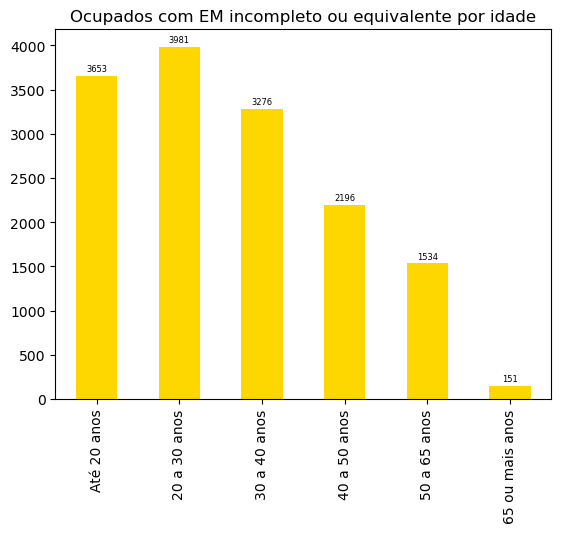

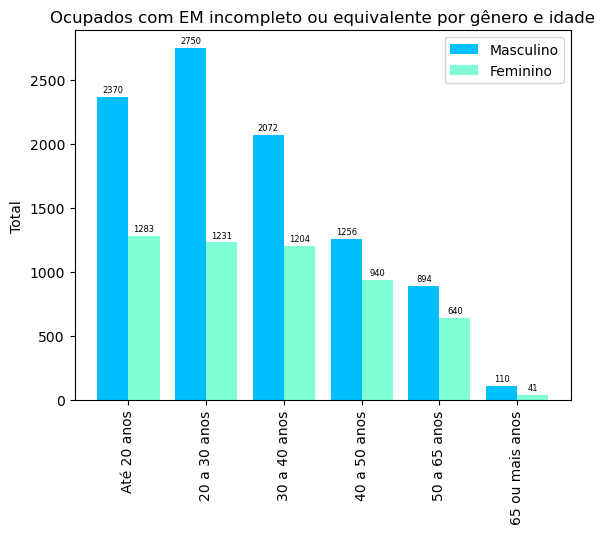

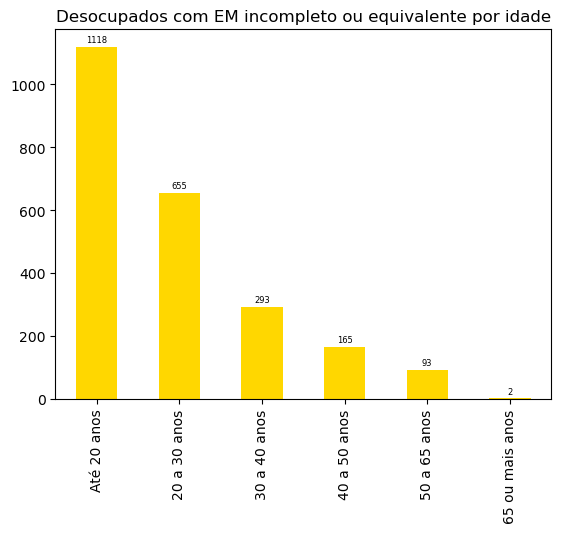

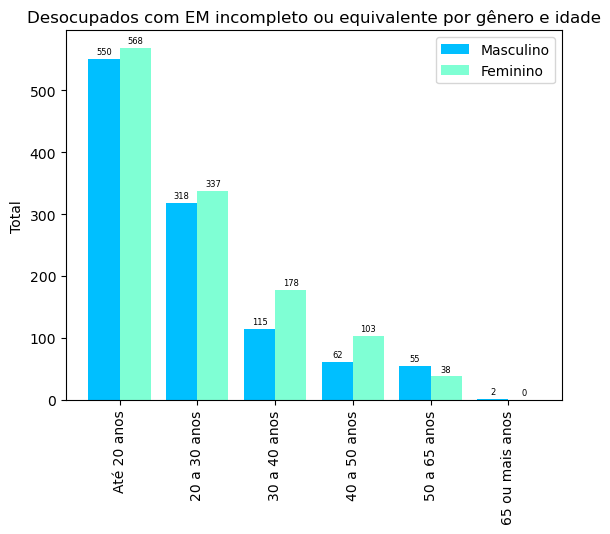

In [75]:
# Médio incompleto ou equivalente
graficoInstrucaoPorGenero(df_MedioIncompleto, 'Entrevistados com EM incompleto ou equivalente por gênero')
graficoEntrevistadosPorIdade(df_MedioIncompleto, 'Entrevistados com EM incompleto ou equivalente por idade')

s_ocupadosMI, s_desocupadosMI = ocupacao(df_MedioIncompleto)
graficoPorGenero(s_ocupadosMI, "Gênero dos ocupados com EM incompleto ou equivalente")
graficoPorGenero(s_desocupadosMI, "Gênero dos desocupados com EM incompleto ou equivalente")
graficoEntrevistadosPorIdade(s_ocupadosMI, 'Ocupados com EM incompleto ou equivalente por idade')
graficoPorGeneroIdade(s_ocupadosMI[['V2009','V2007']], 'Ocupados com EM incompleto ou equivalente por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosMI[['V2009','V2007']],'Desocupados com EM incompleto ou equivalente por idade')
graficoPorGeneroIdade(s_desocupadosMI[['V2009','V2007']], 'Desocupados com EM incompleto ou equivalente por gênero e idade')

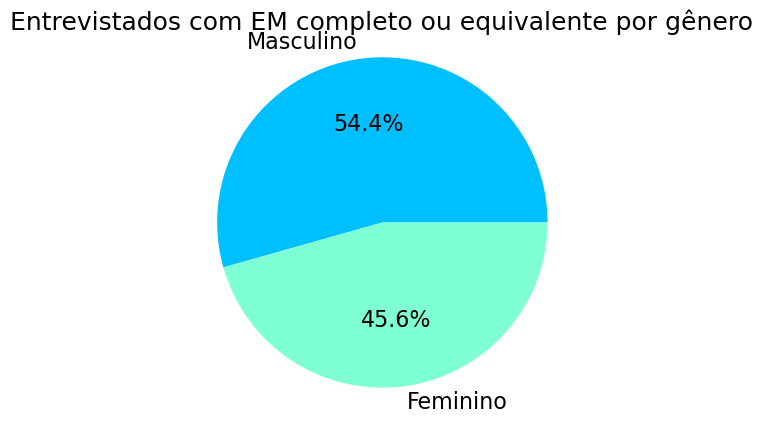

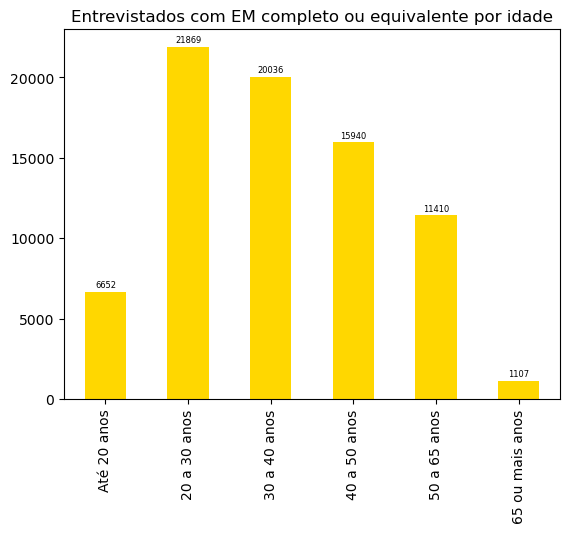

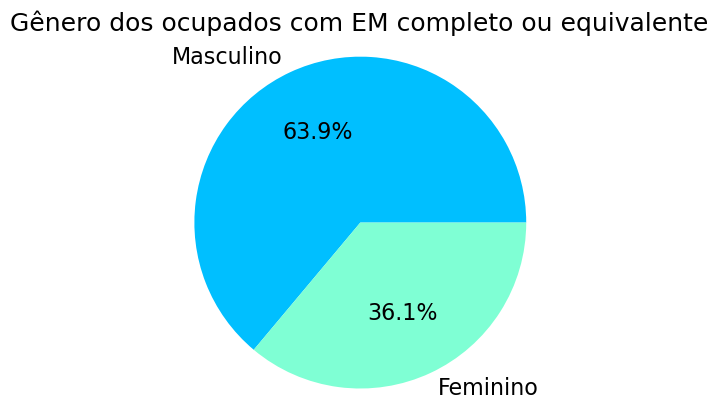

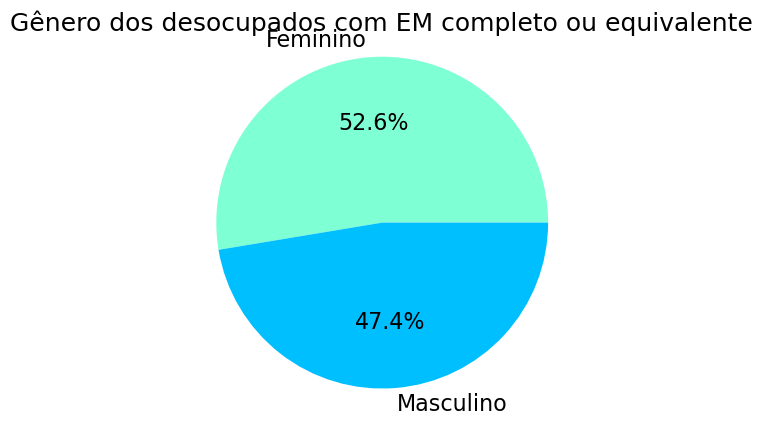

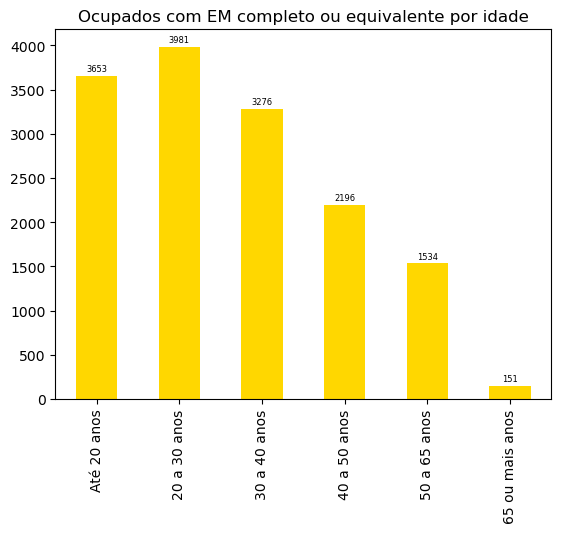

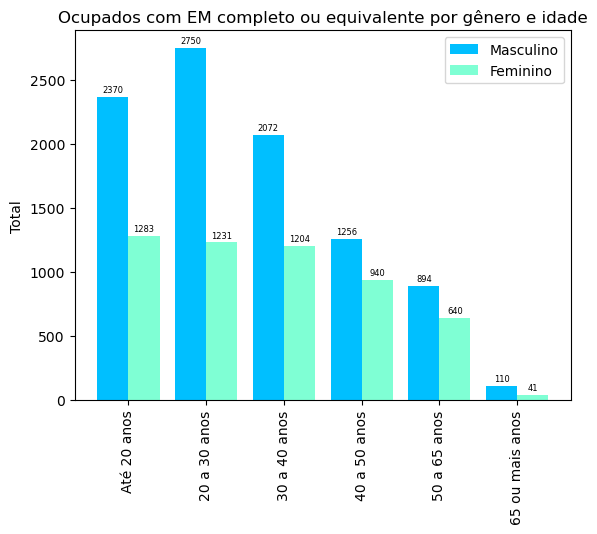

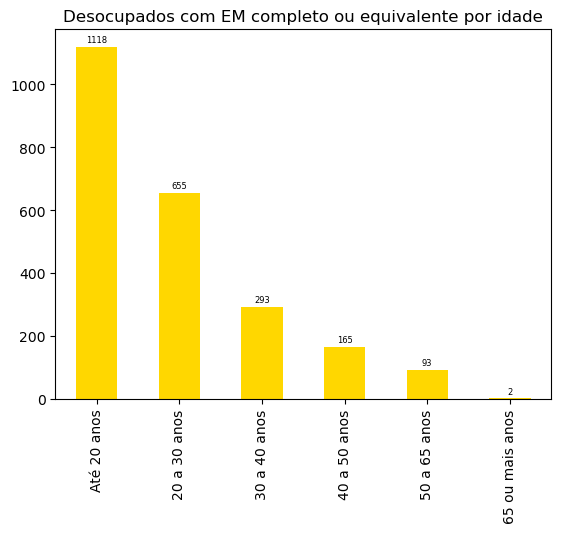

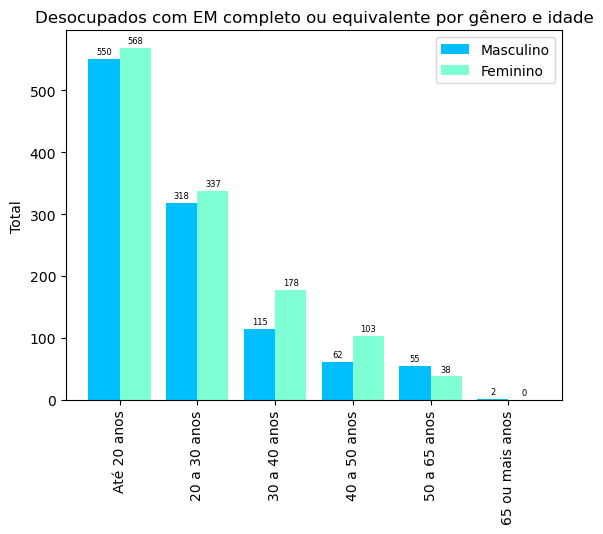

In [76]:
#  Médio completo ou equivalente
graficoInstrucaoPorGenero(df_MedioCompleto, 'Entrevistados com EM completo ou equivalente por gênero')
graficoEntrevistadosPorIdade(df_MedioCompleto, 'Entrevistados com EM completo ou equivalente por idade')

s_ocupadosMC, s_desocupadosMC = ocupacao(df_MedioIncompleto)
graficoPorGenero(s_ocupadosMC, "Gênero dos ocupados com EM completo ou equivalente")
graficoPorGenero(s_desocupadosMC, "Gênero dos desocupados com EM completo ou equivalente")
graficoEntrevistadosPorIdade(s_ocupadosMC, 'Ocupados com EM completo ou equivalente por idade')
graficoPorGeneroIdade(s_ocupadosMC[['V2009','V2007']], 'Ocupados com EM completo ou equivalente por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosMC[['V2009','V2007']],'Desocupados com EM completo ou equivalente por idade')
graficoPorGeneroIdade(s_desocupadosMC[['V2009','V2007']], 'Desocupados com EM completo ou equivalente por gênero e idade')

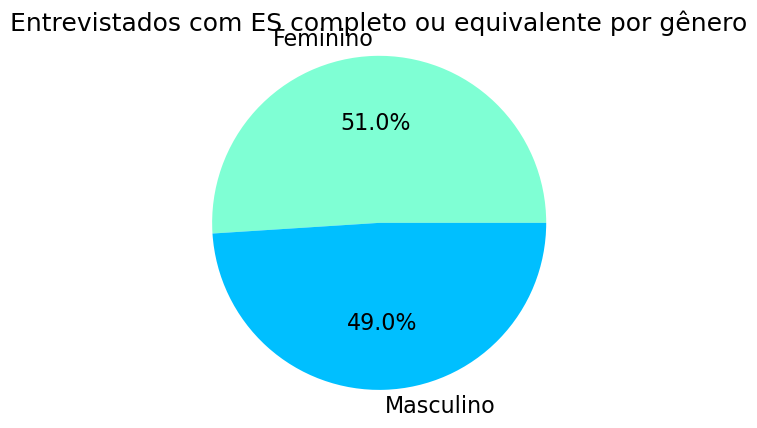

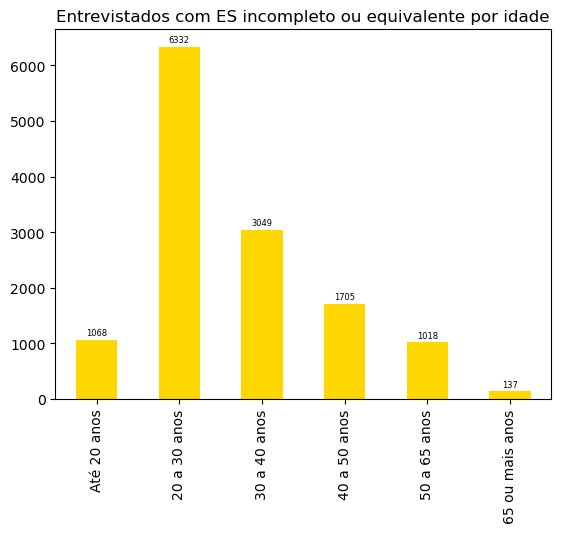

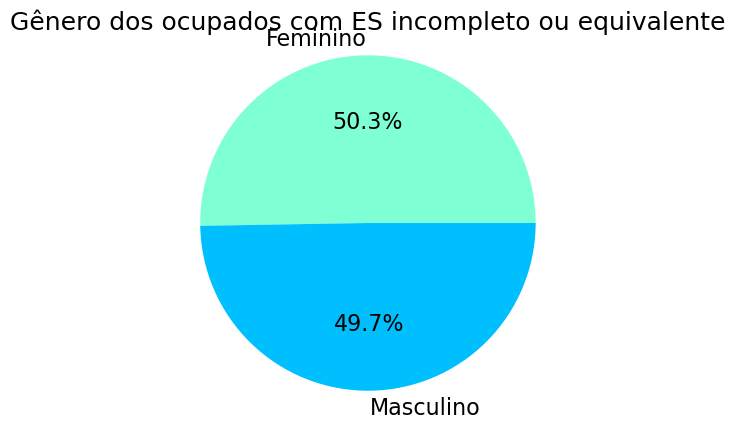

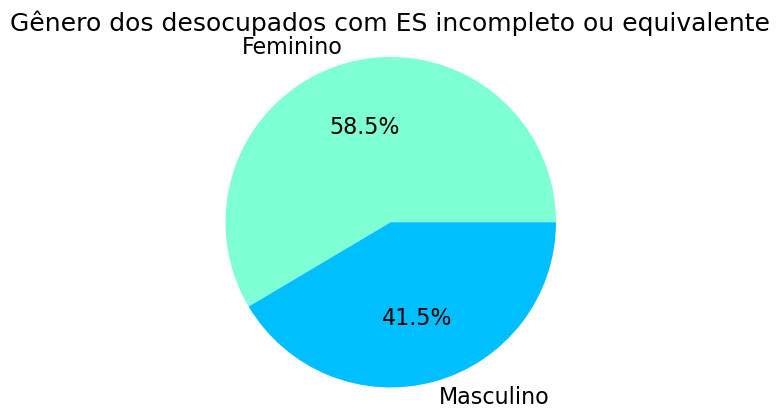

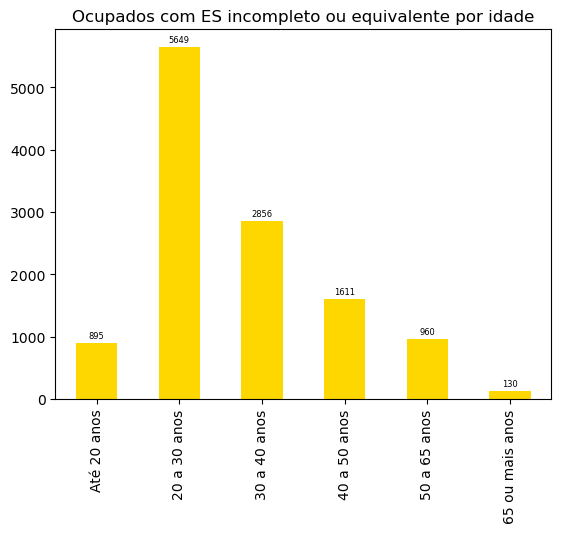

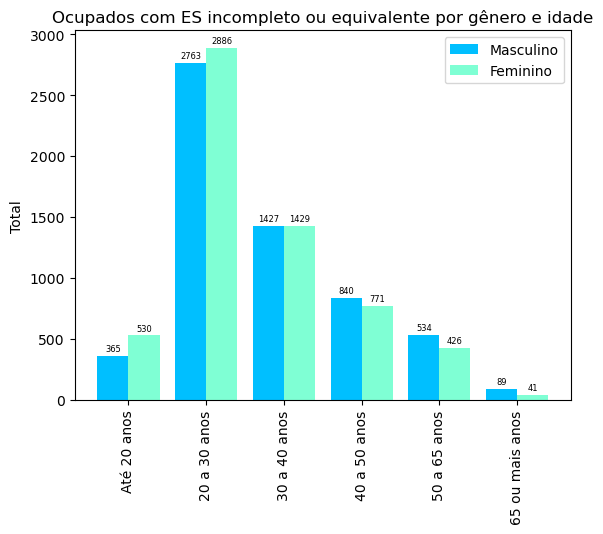

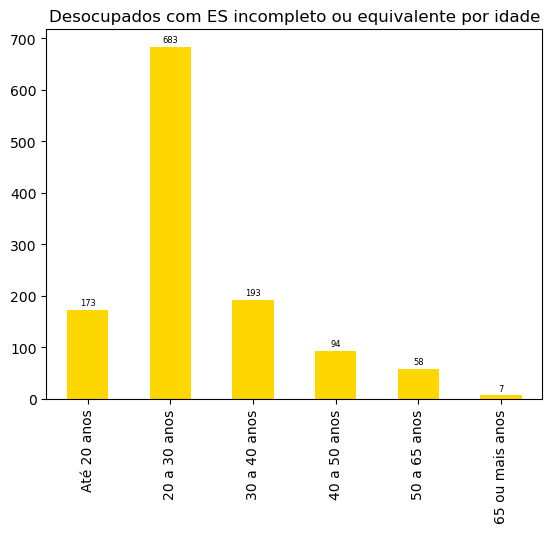

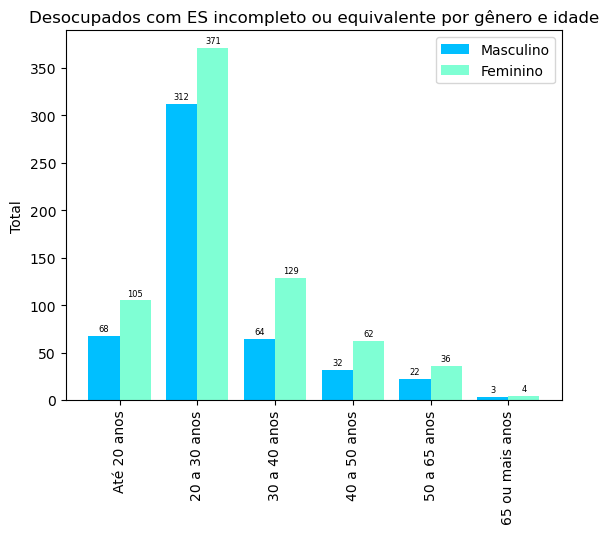

In [77]:
# 6 - Superior incompleto
graficoInstrucaoPorGenero(df_SupIncompleto, 'Entrevistados com ES completo ou equivalente por gênero')
graficoEntrevistadosPorIdade(df_SupIncompleto, 'Entrevistados com ES incompleto ou equivalente por idade')

s_ocupadosSI, s_desocupadosSI = ocupacao(df_SupIncompleto)
graficoPorGenero(s_ocupadosSI, "Gênero dos ocupados com ES incompleto ou equivalente")
graficoPorGenero(s_desocupadosSI, "Gênero dos desocupados com ES incompleto ou equivalente")
graficoEntrevistadosPorIdade(s_ocupadosSI, 'Ocupados com ES incompleto ou equivalente por idade')
graficoPorGeneroIdade(s_ocupadosSI[['V2009','V2007']], 'Ocupados com ES incompleto ou equivalente por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosSI[['V2009','V2007']],'Desocupados com ES incompleto ou equivalente por idade')
graficoPorGeneroIdade(s_desocupadosSI[['V2009','V2007']], 'Desocupados com ES incompleto ou equivalente por gênero e idade')    

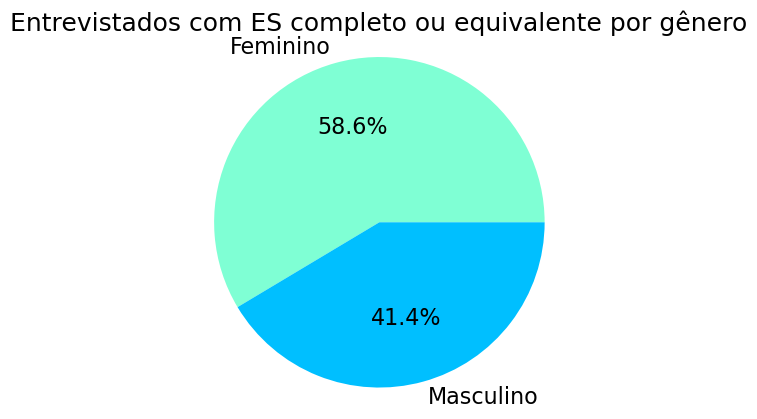

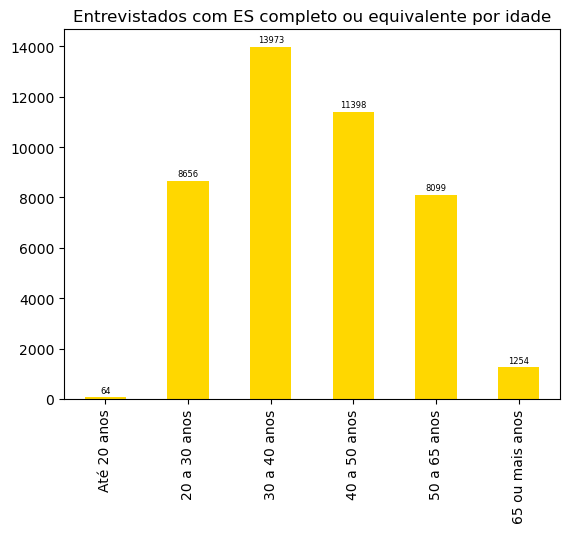

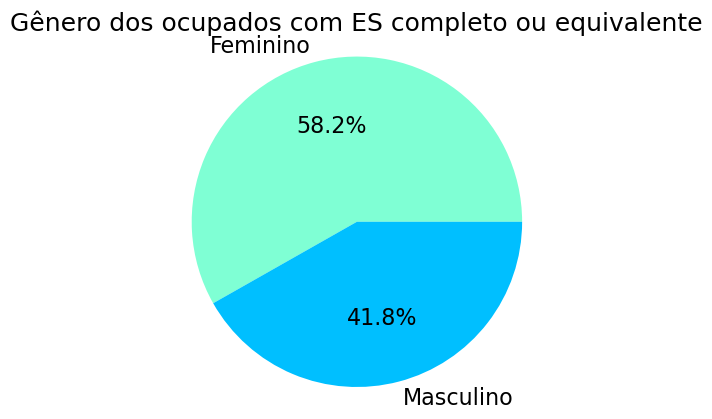

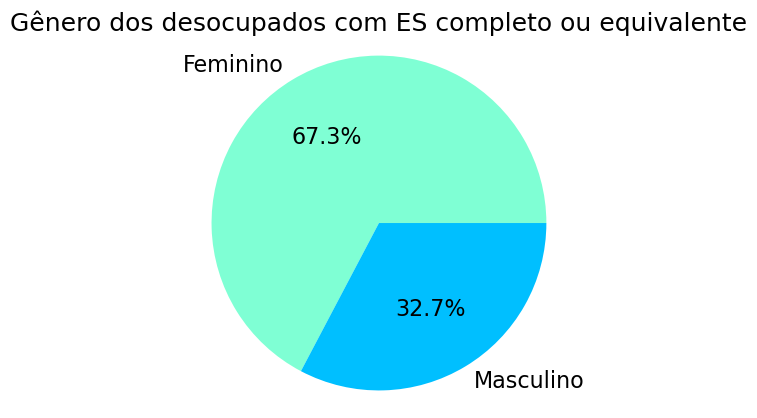

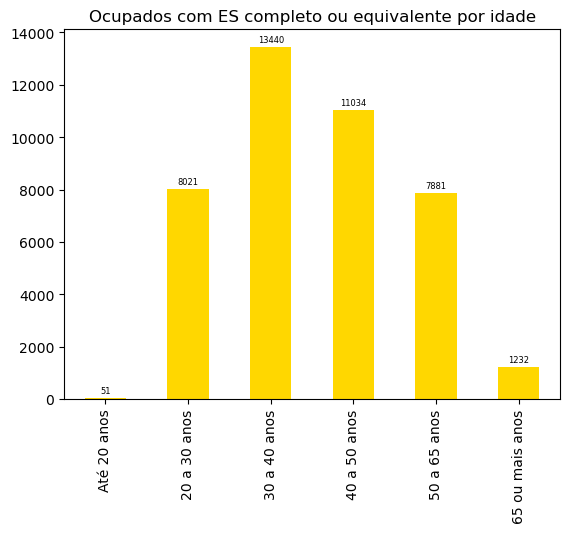

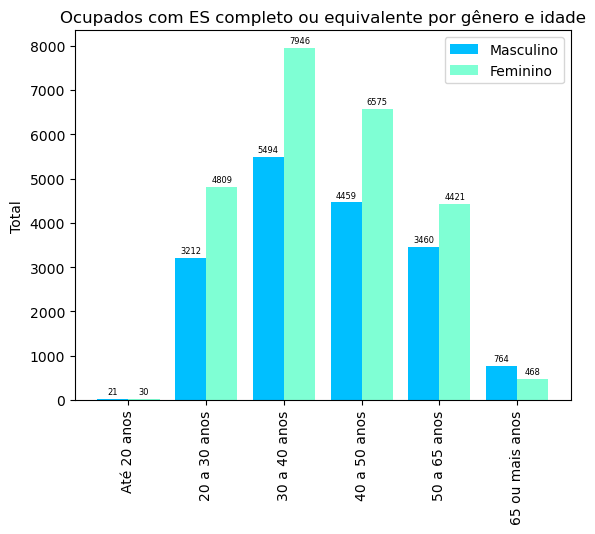

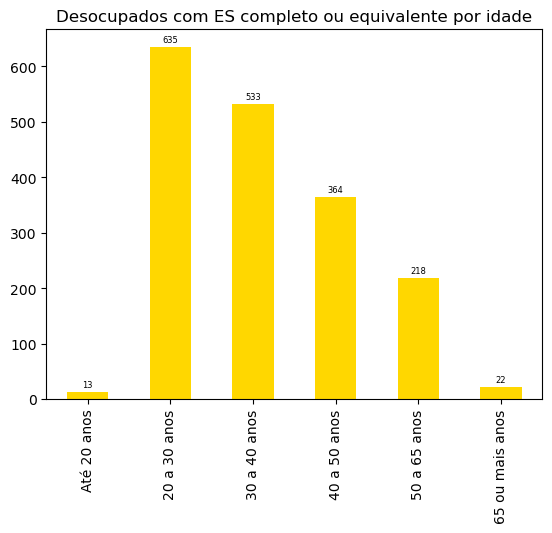

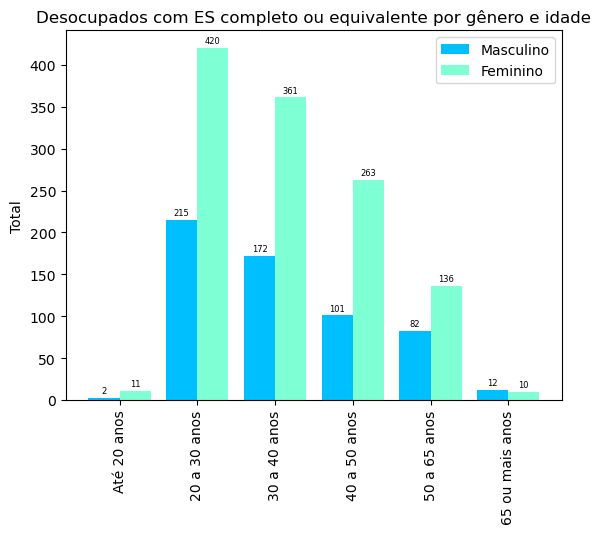

In [78]:
# 7 - Superior completo
graficoInstrucaoPorGenero(df_SupCompleto, 'Entrevistados com ES completo ou equivalente por gênero')
graficoEntrevistadosPorIdade(df_SupCompleto, 'Entrevistados com ES completo ou equivalente por idade')

s_ocupadosSC, s_desocupadosSC = ocupacao(df_SupCompleto)
graficoPorGenero(s_ocupadosSC, "Gênero dos ocupados com ES completo ou equivalente")
graficoPorGenero(s_desocupadosSC, "Gênero dos desocupados com ES completo ou equivalente")
graficoEntrevistadosPorIdade(s_ocupadosSC, 'Ocupados com ES completo ou equivalente por idade')
graficoPorGeneroIdade(s_ocupadosSC[['V2009','V2007']], 'Ocupados com ES completo ou equivalente por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosSC[['V2009','V2007']],'Desocupados com ES completo ou equivalente por idade')
graficoPorGeneroIdade(s_desocupadosSC[['V2009','V2007']], 'Desocupados com ES completo ou equivalente por gênero e idade')

In [79]:
# 4o Trimestre
df_quartoTri = carregaTrimestre('PNADC_042022_vd.csv')

In [80]:
df_quartoTri.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 478091 entries, 0 to 478090
Data columns (total 28 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Unnamed: 0  478091 non-null  int64  
 1   V2007       478091 non-null  int64  
 2   V2009       478091 non-null  int64  
 3   V3002       450486 non-null  float64
 4   V3008       336897 non-null  float64
 5   V3003A      113589 non-null  float64
 6   V3006       100842 non-null  float64
 7   V3006A      266 non-null     float64
 8   V3009A      316531 non-null  float64
 9   V3014       304941 non-null  float64
 10  V3010       87028 non-null   float64
 11  V3012       293232 non-null  float64
 12  V3013B      204 non-null     float64
 13  V3013A      359 non-null     float64
 14  V3013       284069 non-null  float64
 15  V3005A      16901 non-null   float64
 16  V3011A      44909 non-null   float64
 17  V3007       16901 non-null   float64
 18  V4009       206289 non-null  float64
 19  V4

In [81]:
# Iniciando tratamenos com a variavel VD4002 (Condição de ocupação)
# Verificando os valores que existem para a variavel
df_quartoTri['VD4002'].unique()

array([ 1., nan,  2.])

In [82]:
# Reduzindo o dataframe apenas para os entrevistados ocupados e desocupados, desconsiderando os não aplicáveis
df_quartoTriFiltrado = df_quartoTri[(df_quartoTri['VD4002'] == 1.0) | (df_quartoTri['VD4002'] == 2.0)]
df_quartoTriFiltrado['VD4002'].unique()

array([1., 2.])

In [83]:
df_quartoTriFiltrado.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 223071 entries, 0 to 478090
Data columns (total 28 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Unnamed: 0  223071 non-null  int64  
 1   V2007       223071 non-null  int64  
 2   V2009       223071 non-null  int64  
 3   V3002       223071 non-null  float64
 4   V3008       199389 non-null  float64
 5   V3003A      23682 non-null   float64
 6   V3006       20406 non-null   float64
 7   V3006A      90 non-null      float64
 8   V3009A      194720 non-null  float64
 9   V3014       189294 non-null  float64
 10  V3010       51896 non-null   float64
 11  V3012       180477 non-null  float64
 12  V3013B      88 non-null      float64
 13  V3013A      179 non-null     float64
 14  V3013       176679 non-null  float64
 15  V3005A      11953 non-null   float64
 16  V3011A      34735 non-null   float64
 17  V3007       11953 non-null   float64
 18  V4009       206289 non-null  float64
 19  V4

In [84]:
df_quartoTriFiltrado['VD3004'].unique()

array([5., 7., 2., 6., 4., 3., 1.])

In [85]:
# Filtrando apenas os campos necessários para as análises
df_quartoTriFinal = df_quartoTriFiltrado.loc[:, ['V2007', 'V2009', 'VD4002', 'VD3004']]
df_quartoTriFinal

,V2007,V2009,VD4002,VD3004
0,1,30,1.0,5.0
2,2,49,1.0,7.0
7,2,54,1.0,7.0
9,1,37,1.0,5.0
11,1,32,1.0,5.0
...,...,...,...,...
478083,2,64,1.0,7.0
478086,1,47,1.0,7.0
478088,2,36,1.0,7.0
478089,2,41,1.0,5.0


In [86]:
df_quartoTriFinal['trimestre'] = 4

In [87]:
# Verificação de valores 
df_genero = df_quartoTriFiltrado['V2007']
df_genero.isnull().sum()
genero_entrevistados = df_genero.value_counts()
genero_entrevistados.info()

<class 'pandas.core.series.Series'>
Int64Index: 2 entries, 1 to 2
Series name: V2007
Non-Null Count  Dtype
--------------  -----
2 non-null      int64
dtypes: int64(1)
memory usage: 32.0 bytes


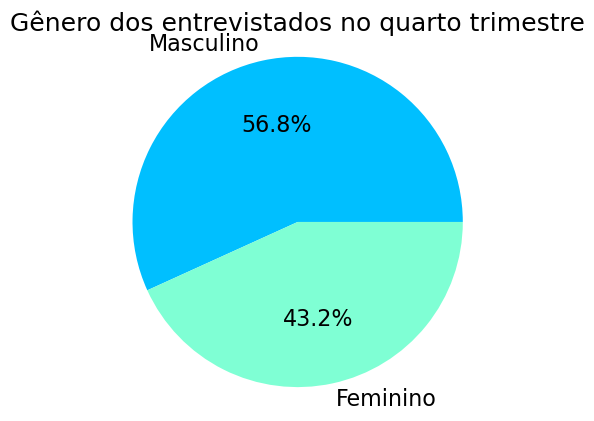

In [88]:
# Grafico de entrevistados por genero
graficoPorGenero(df_quartoTriFiltrado, 'Gênero dos entrevistados no quarto trimestre')

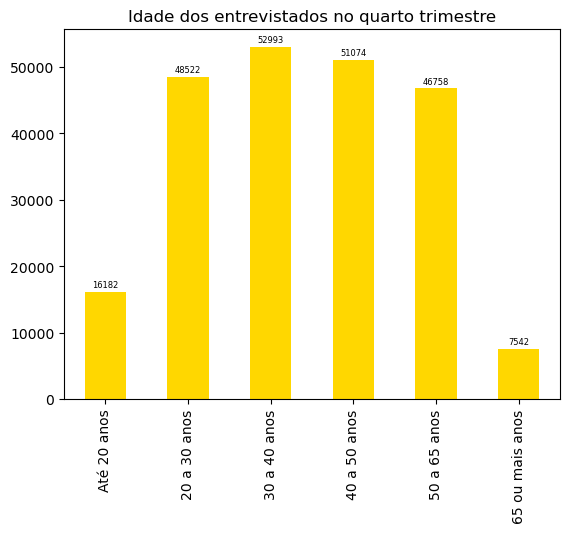

In [89]:
# Grafico por idade 
graficoEntrevistadosPorIdade(df_quartoTriFiltrado, 'Idade dos entrevistados no quarto trimestre')

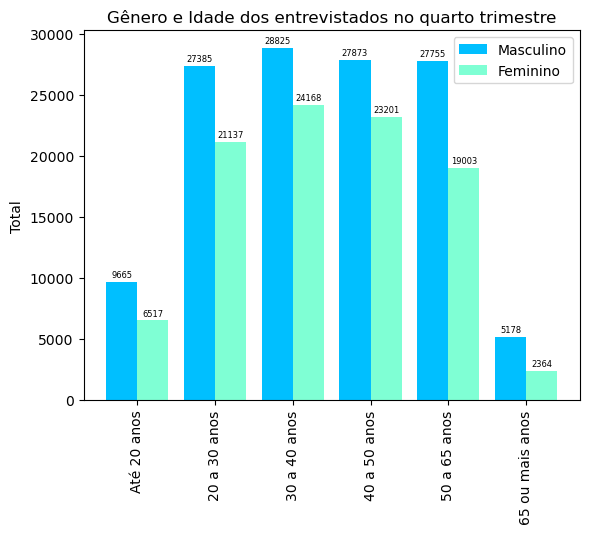

In [90]:
# Grafico por genero e idade
graficoPorGeneroIdade(df_quartoTriFiltrado, 'Gênero e Idade dos entrevistados no quarto trimestre')

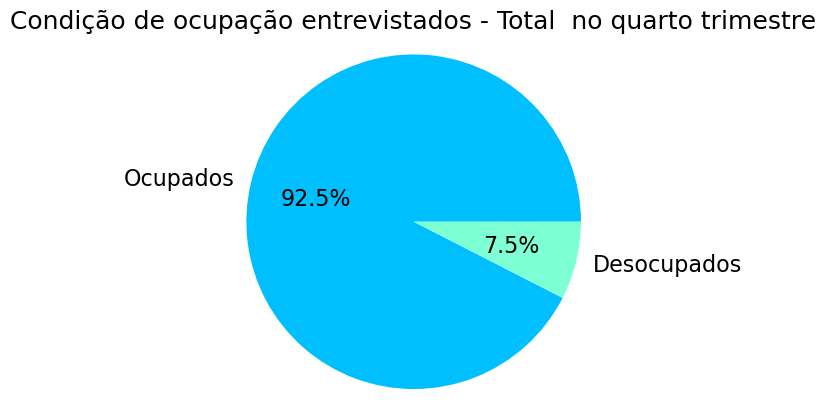

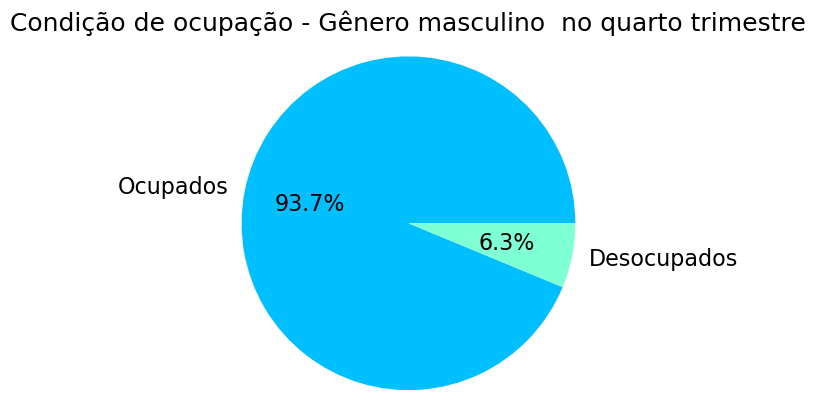

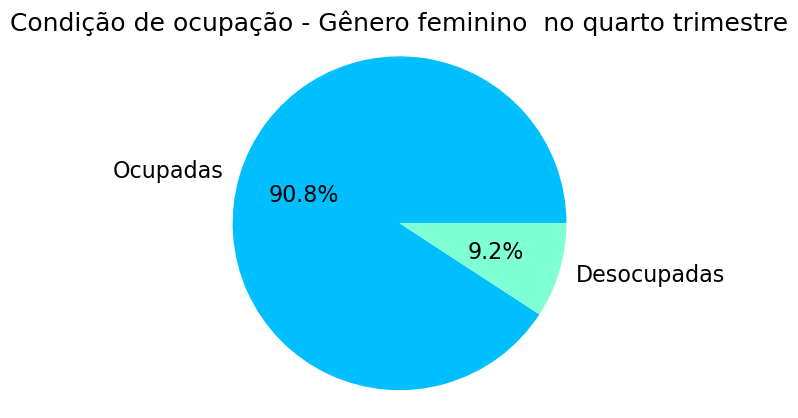

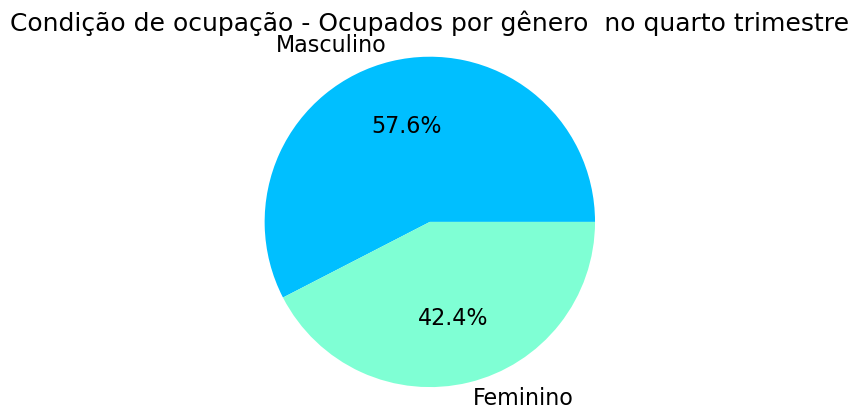

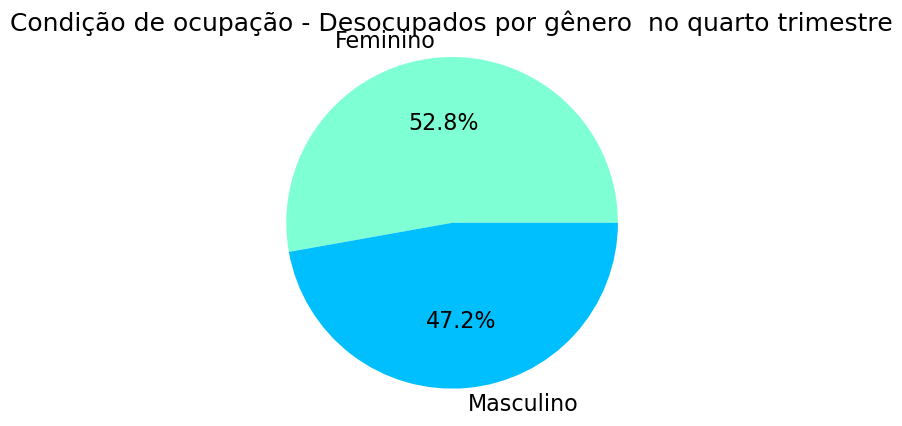

In [91]:
graficoOcupacao(df_quartoTriFiltrado, ' no quarto trimestre')

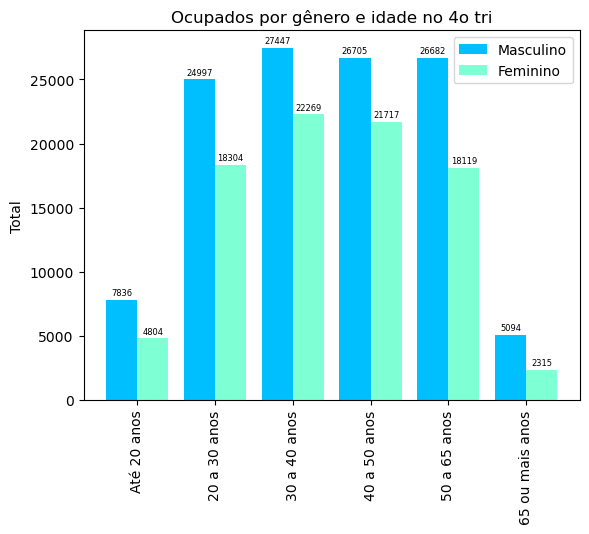

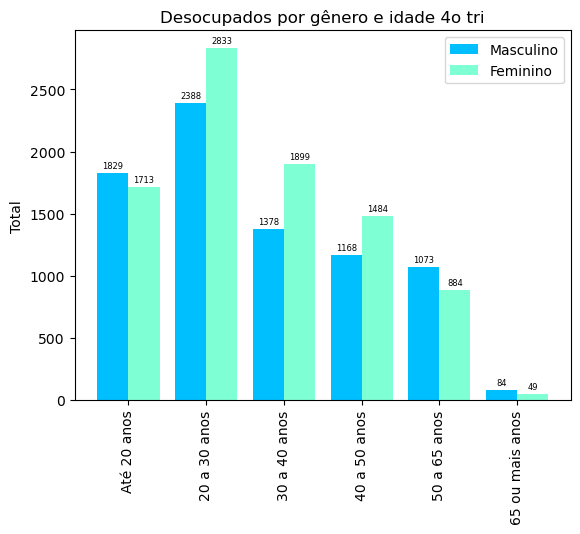

In [92]:
# Ocupados x Genero e Idade
s_ocupados, s_desocupados = ocupacao(df_quartoTriFiltrado)

graficoPorGeneroIdade(s_ocupados, 'Ocupados por gênero e idade no 4o tri')
graficoPorGeneroIdade(s_desocupados, 'Desocupados por gênero e idade 4o tri')

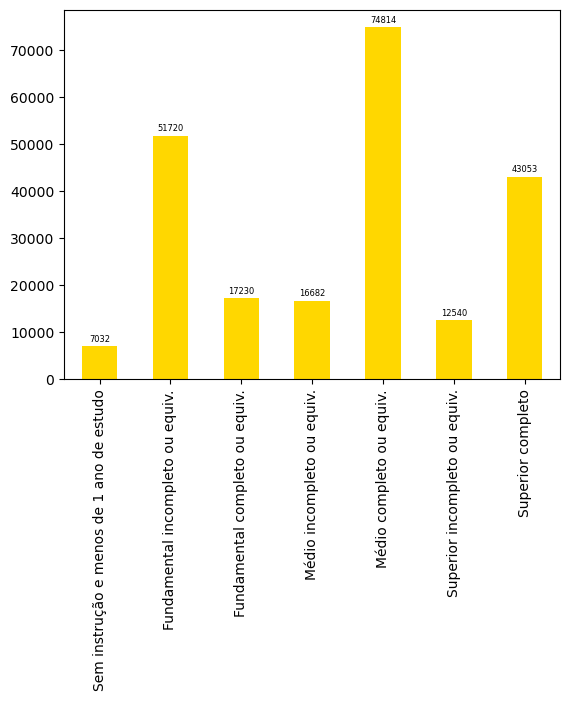

In [93]:
# Instrução dos entrevistados
graficoGrauInstrucao(df_quartoTriFiltrado, 'Grau de instrução dos entrevistados no 4o tri')

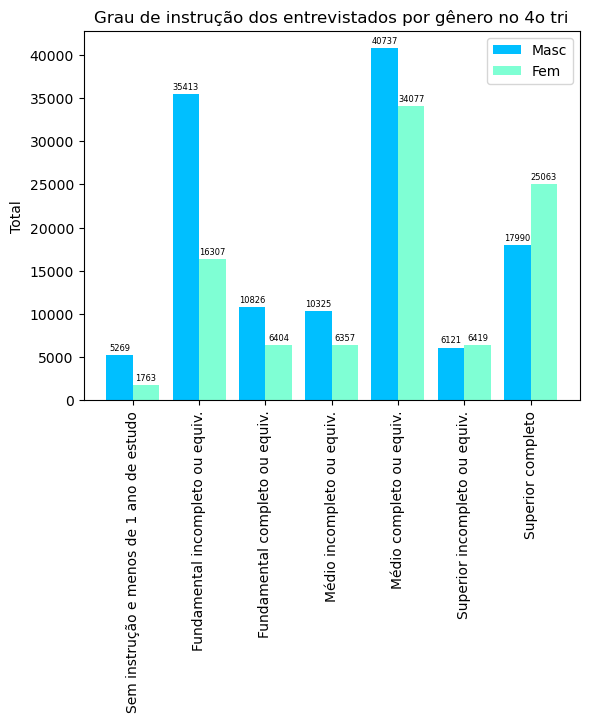

In [135]:
# Instrução dos entrevistados por sexo
graficoInstrucaoSexo(df_quartoTriFiltrado, 'Grau de instrução dos entrevistados por gênero no 4o tri')

In [95]:
# Instrução
df_SemInstrucao,df_FundamentalIncompleto, df_FundamentalCompleto,  df_MedioIncompleto,  df_MedioCompleto, df_SupIncompleto, df_SupCompleto = instrucao(df_quartoTriFiltrado)

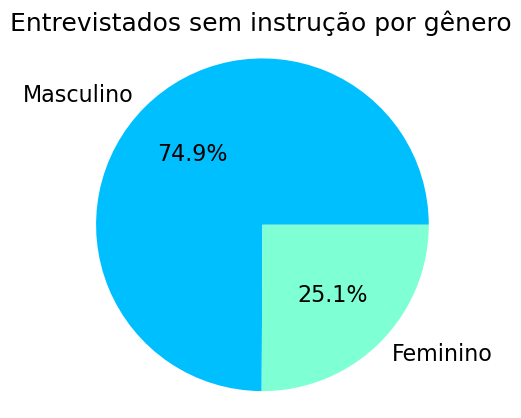

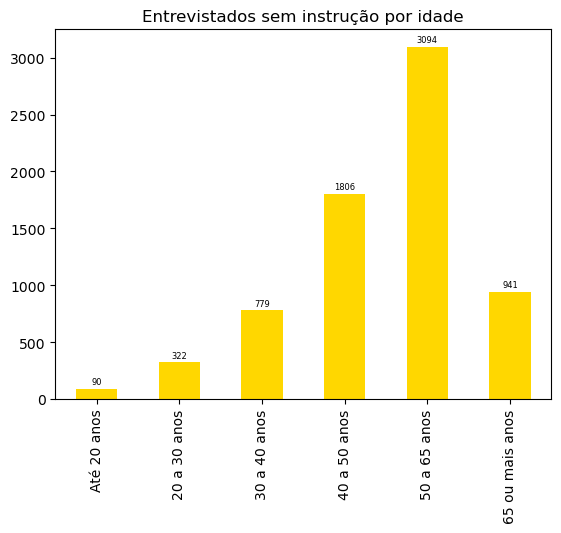

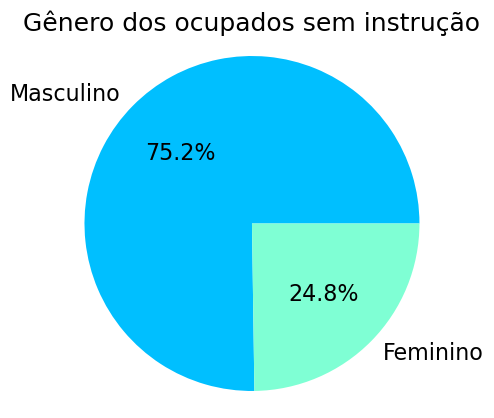

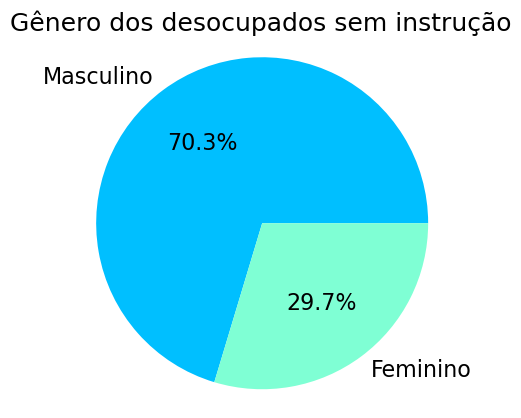

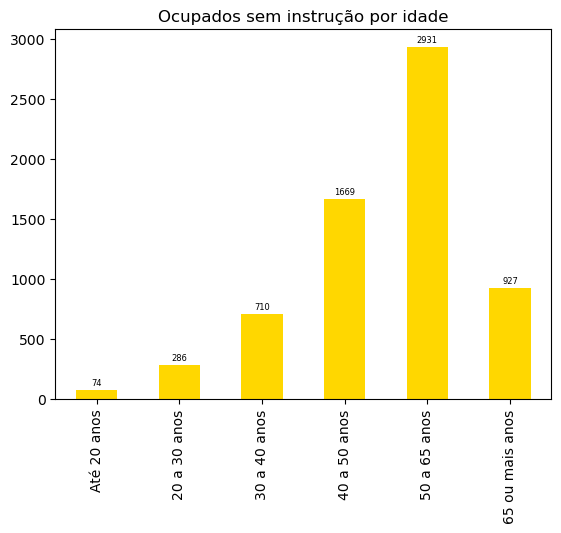

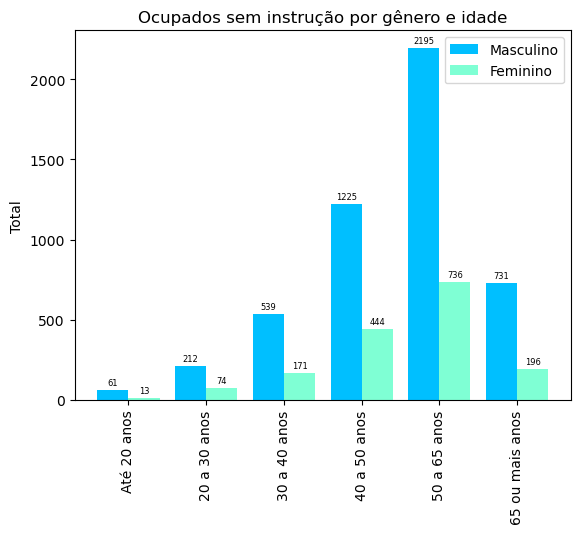

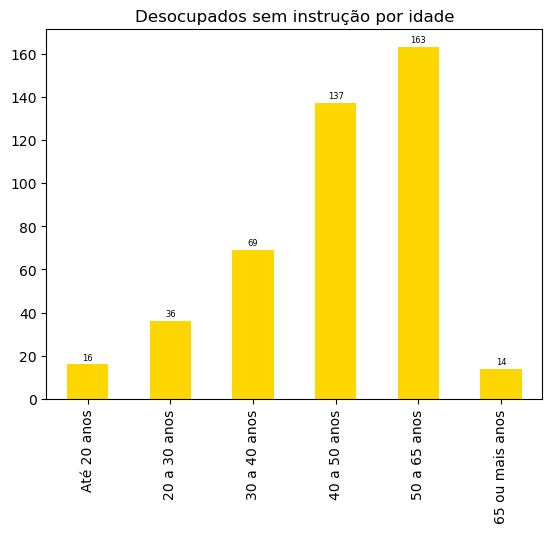

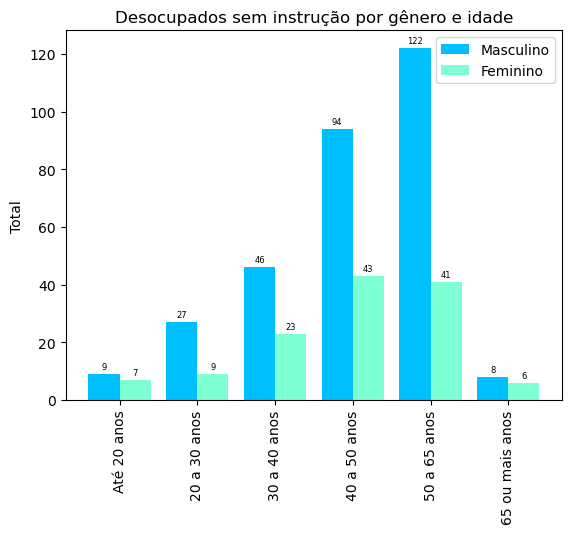

In [96]:
graficoInstrucaoPorGenero(df_SemInstrucao, 'Entrevistados sem instrução por gênero')
graficoEntrevistadosPorIdade(df_SemInstrucao, 'Entrevistados sem instrução por idade')

s_ocupadosSemInstrucao, s_desocupadosSemInstrucao = ocupacao(df_SemInstrucao)
graficoPorGenero(s_ocupadosSemInstrucao, "Gênero dos ocupados sem instrução")
graficoPorGenero(s_desocupadosSemInstrucao, "Gênero dos desocupados sem instrução")
graficoEntrevistadosPorIdade(s_ocupadosSemInstrucao, 'Ocupados sem instrução por idade')
graficoPorGeneroIdade(s_ocupadosSemInstrucao[['V2009','V2007']], 'Ocupados sem instrução por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosSemInstrucao[['V2009','V2007']],'Desocupados sem instrução por idade')
graficoPorGeneroIdade(s_desocupadosSemInstrucao[['V2009','V2007']], 'Desocupados sem instrução por gênero e idade')

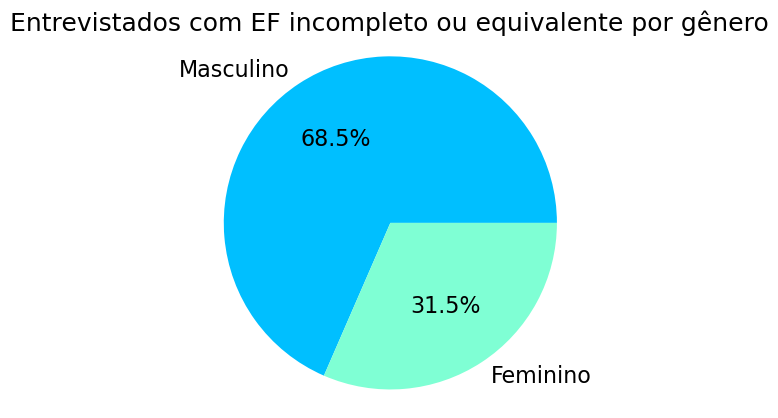

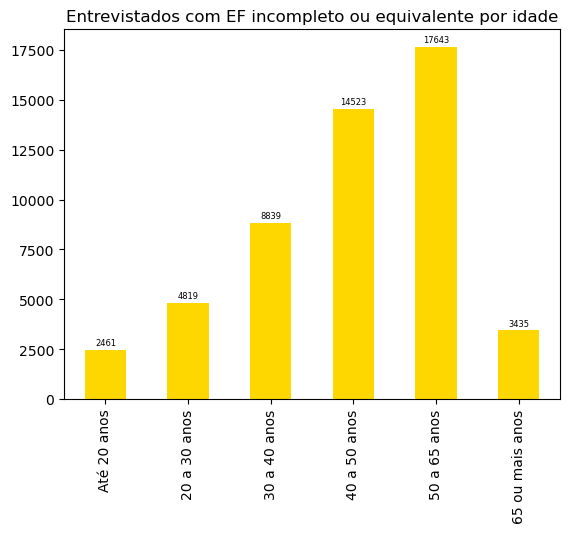

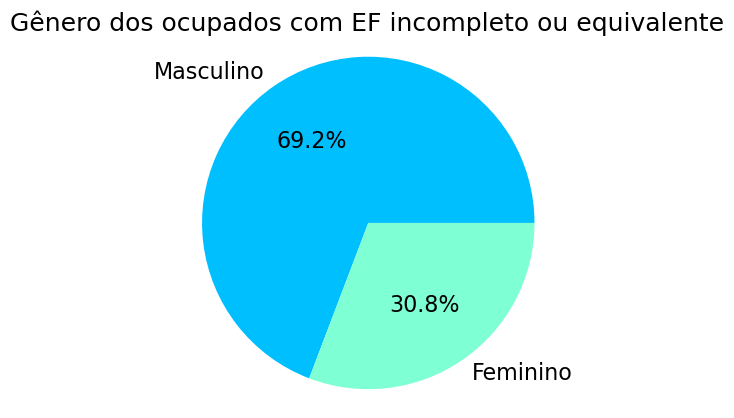

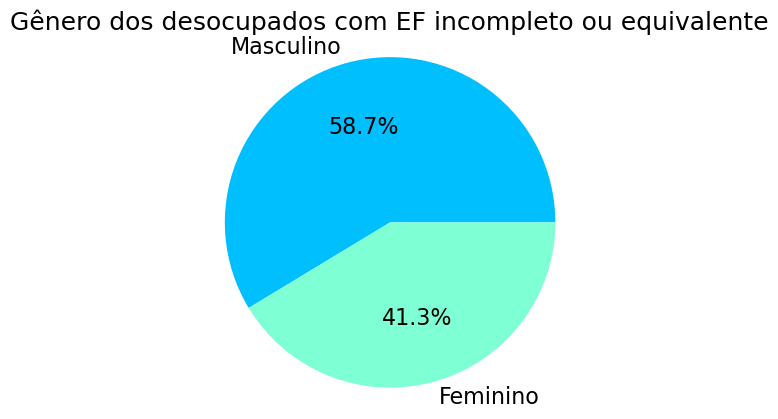

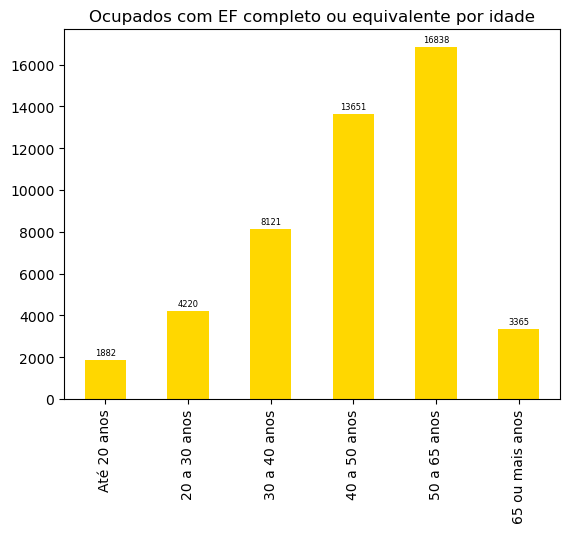

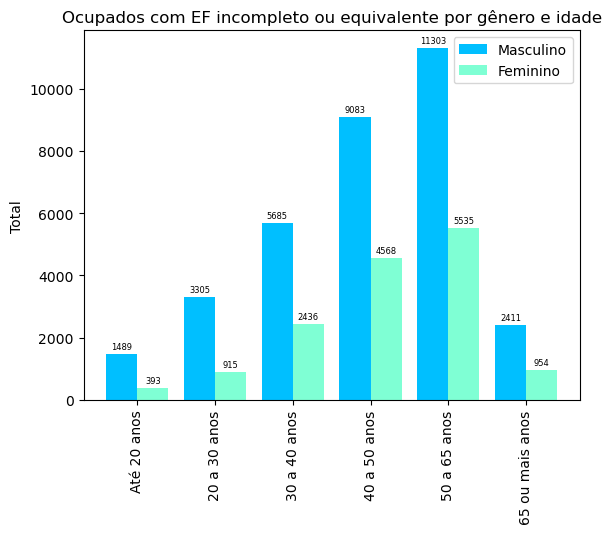

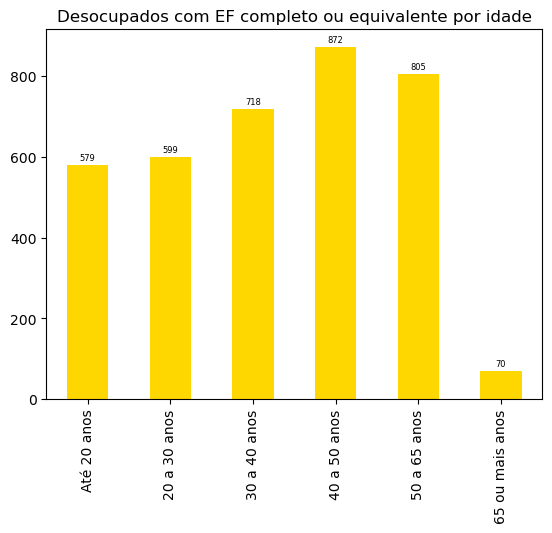

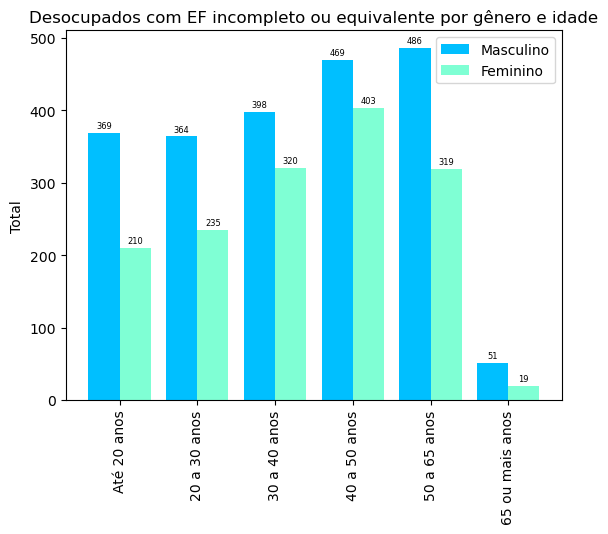

In [97]:
# Fundamental incompleto ou equivalente                     
graficoInstrucaoPorGenero(df_FundamentalIncompleto, 'Entrevistados com EF incompleto ou equivalente por gênero')
graficoEntrevistadosPorIdade(df_FundamentalIncompleto, 'Entrevistados com EF incompleto ou equivalente por idade')

s_ocupadosFundamental, s_desocupadosFundamental = ocupacao(df_FundamentalIncompleto)
graficoPorGenero(s_ocupadosFundamental, "Gênero dos ocupados com EF incompleto ou equivalente")
graficoPorGenero(s_desocupadosFundamental, "Gênero dos desocupados com EF incompleto ou equivalente")
graficoEntrevistadosPorIdade(s_ocupadosFundamental, 'Ocupados com EF completo ou equivalente por idade')
graficoPorGeneroIdade(s_ocupadosFundamental[['V2009','V2007']], 'Ocupados com EF incompleto ou equivalente por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosFundamental[['V2009','V2007']],'Desocupados com EF completo ou equivalente por idade')
graficoPorGeneroIdade(s_desocupadosFundamental[['V2009','V2007']], 'Desocupados com EF incompleto ou equivalente por gênero e idade')

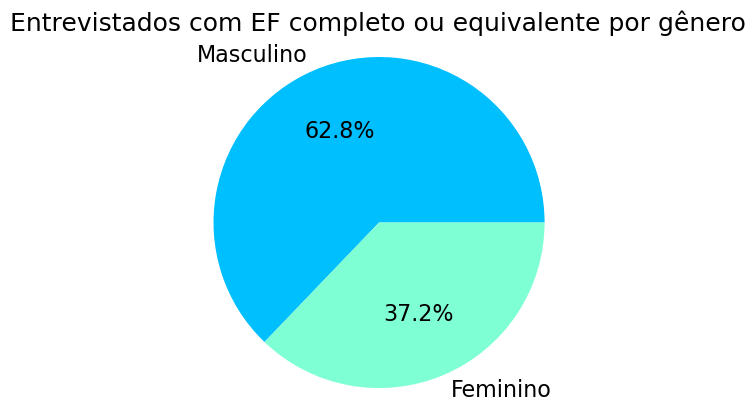

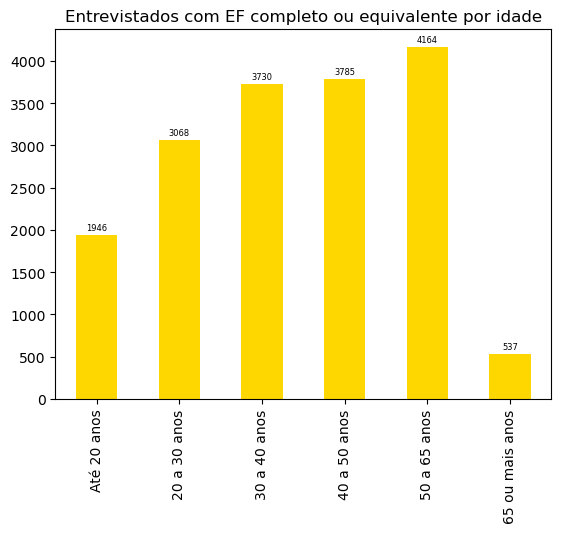

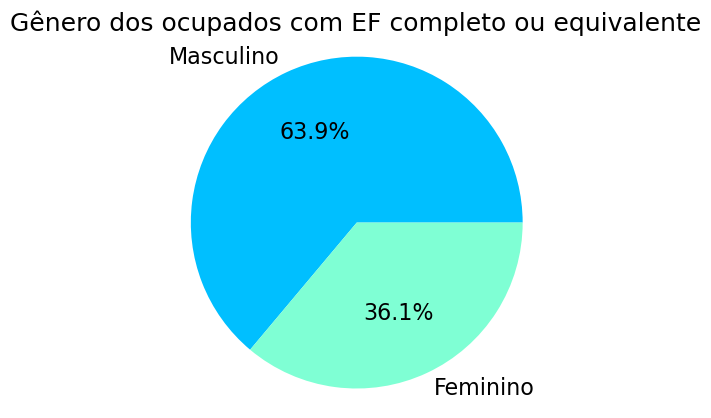

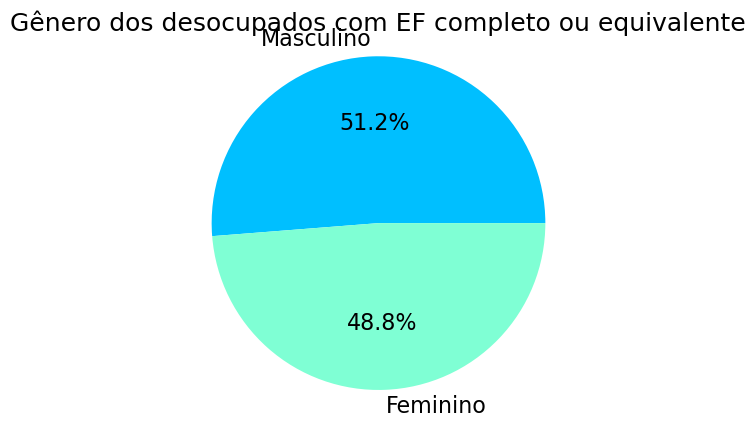

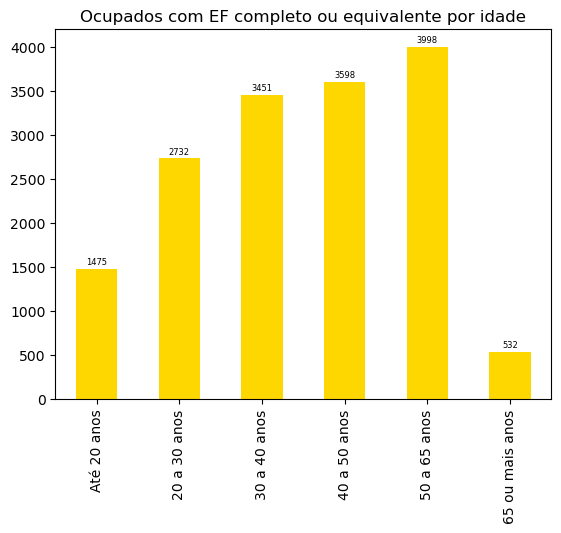

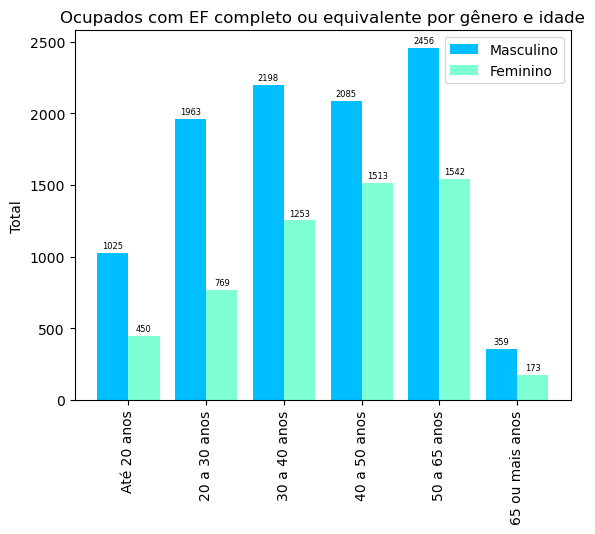

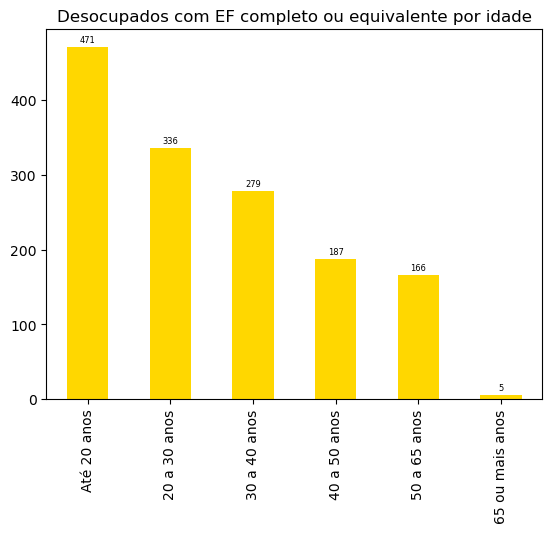

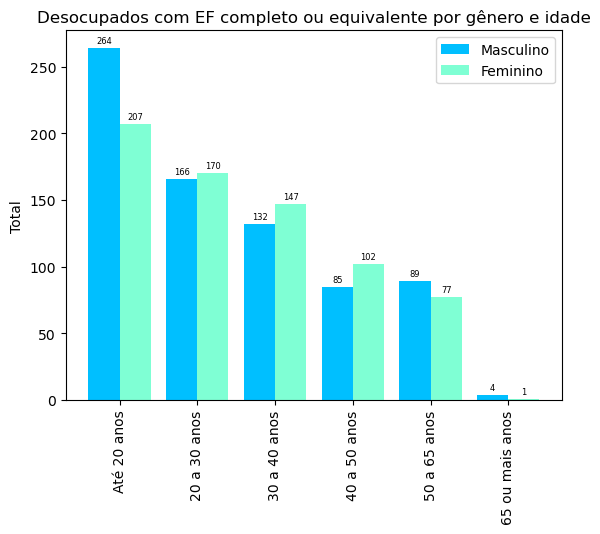

In [98]:
# Fundamental completo ou equivalente                     
graficoInstrucaoPorGenero(df_FundamentalCompleto, 'Entrevistados com EF completo ou equivalente por gênero')
graficoEntrevistadosPorIdade(df_FundamentalCompleto, 'Entrevistados com EF completo ou equivalente por idade')

s_ocupadosFundamental, s_desocupadosFundamental = ocupacao(df_FundamentalCompleto)
graficoPorGenero(s_ocupadosFundamental, "Gênero dos ocupados com EF completo ou equivalente")
graficoPorGenero(s_desocupadosFundamental, "Gênero dos desocupados com EF completo ou equivalente")
graficoEntrevistadosPorIdade(s_ocupadosFundamental, 'Ocupados com EF completo ou equivalente por idade')
graficoPorGeneroIdade(s_ocupadosFundamental[['V2009','V2007']], 'Ocupados com EF completo ou equivalente por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosFundamental[['V2009','V2007']],'Desocupados com EF completo ou equivalente por idade')
graficoPorGeneroIdade(s_desocupadosFundamental[['V2009','V2007']], 'Desocupados com EF completo ou equivalente por gênero e idade')

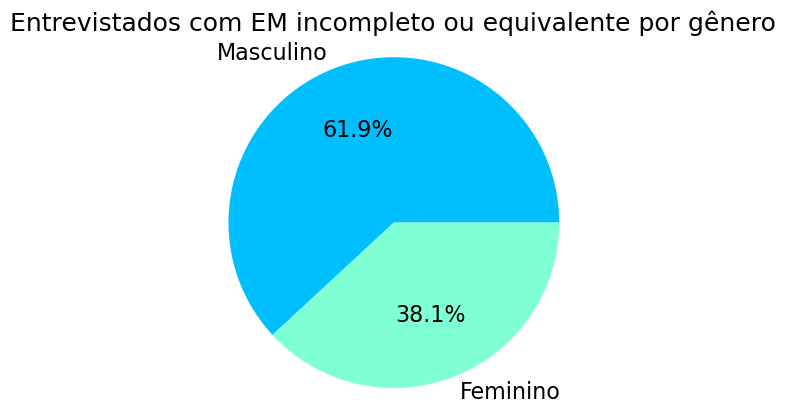

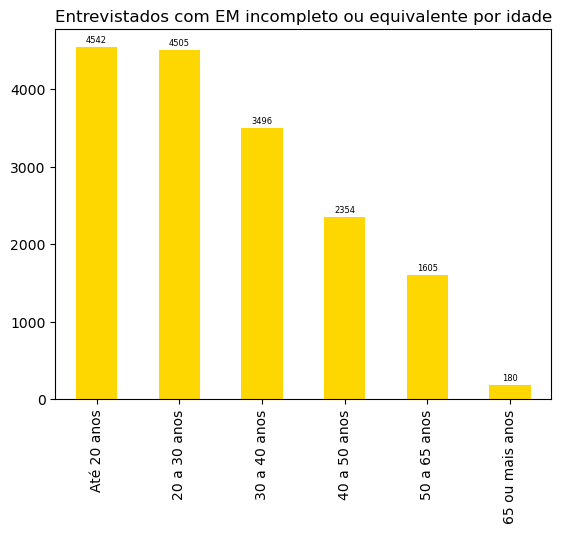

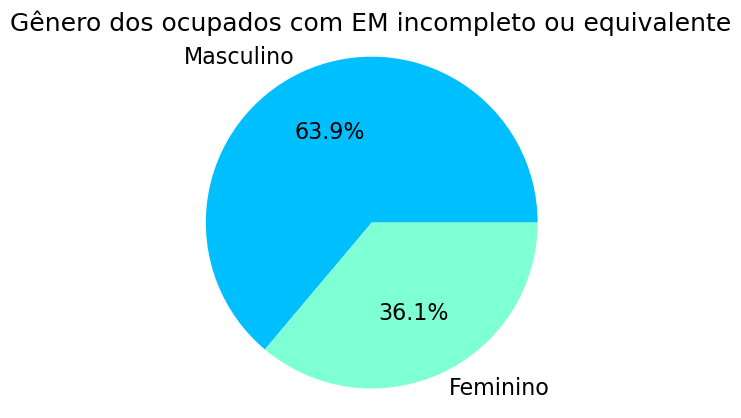

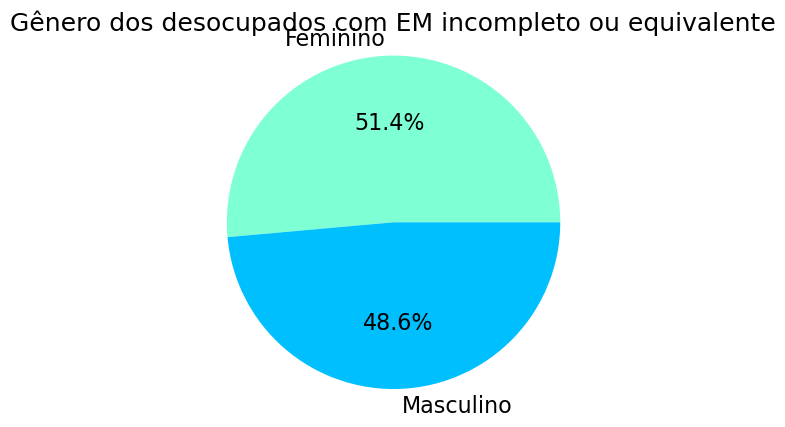

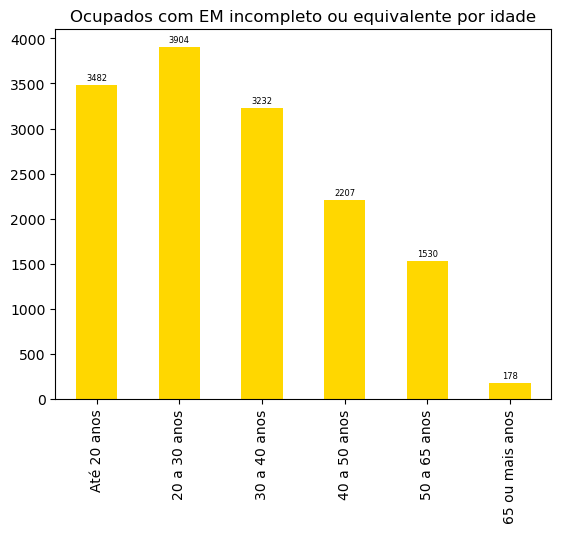

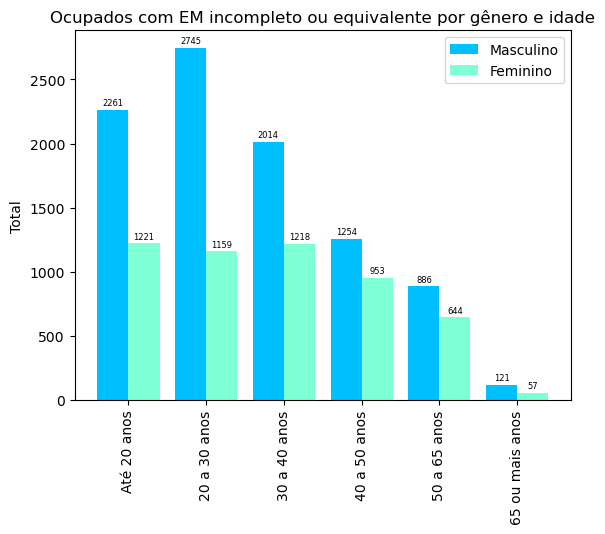

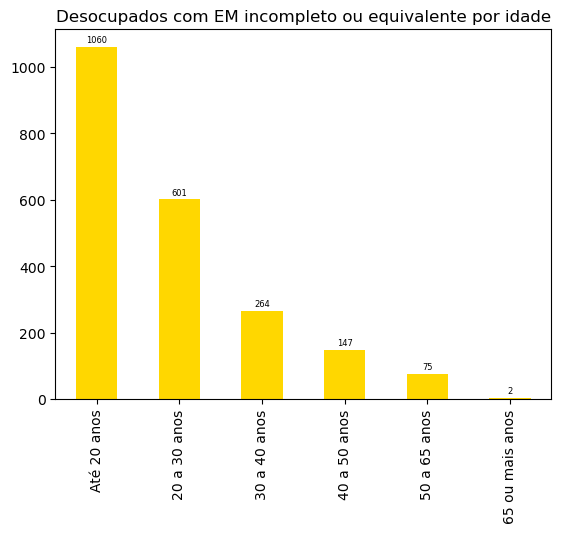

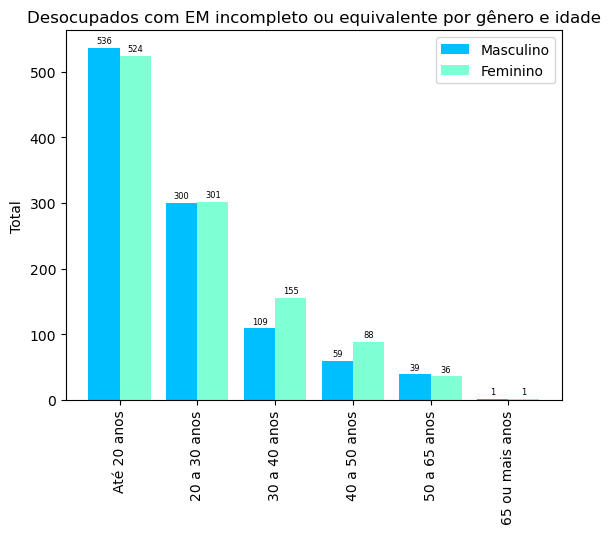

In [99]:
# Médio incompleto ou equivalente
graficoInstrucaoPorGenero(df_MedioIncompleto, 'Entrevistados com EM incompleto ou equivalente por gênero')
graficoEntrevistadosPorIdade(df_MedioIncompleto, 'Entrevistados com EM incompleto ou equivalente por idade')

s_ocupadosMI, s_desocupadosMI = ocupacao(df_MedioIncompleto)
graficoPorGenero(s_ocupadosMI, "Gênero dos ocupados com EM incompleto ou equivalente")
graficoPorGenero(s_desocupadosMI, "Gênero dos desocupados com EM incompleto ou equivalente")
graficoEntrevistadosPorIdade(s_ocupadosMI, 'Ocupados com EM incompleto ou equivalente por idade')
graficoPorGeneroIdade(s_ocupadosMI[['V2009','V2007']], 'Ocupados com EM incompleto ou equivalente por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosMI[['V2009','V2007']],'Desocupados com EM incompleto ou equivalente por idade')
graficoPorGeneroIdade(s_desocupadosMI[['V2009','V2007']], 'Desocupados com EM incompleto ou equivalente por gênero e idade')

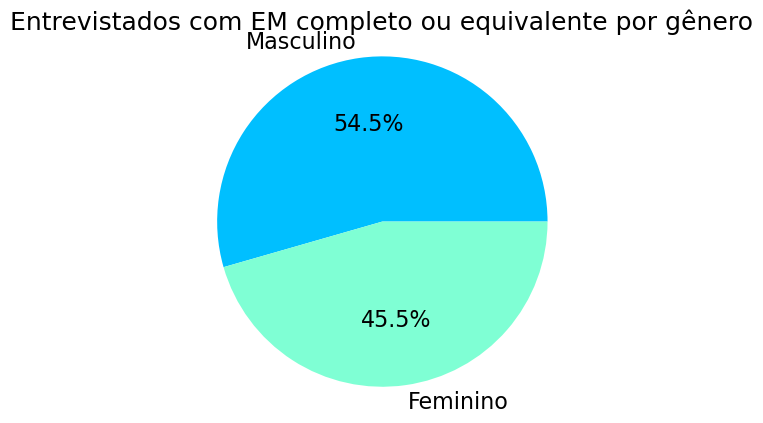

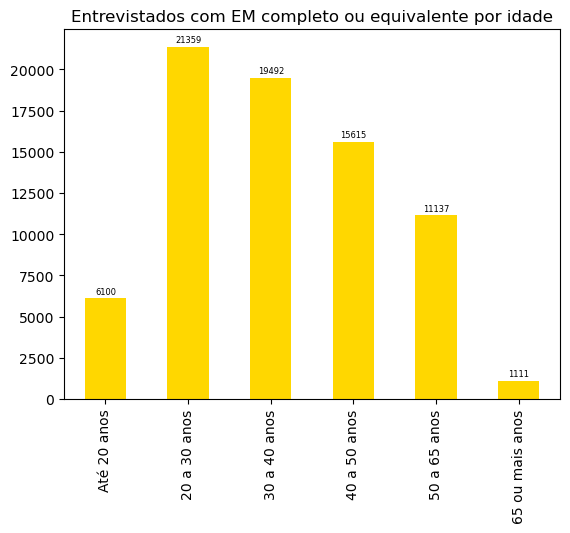

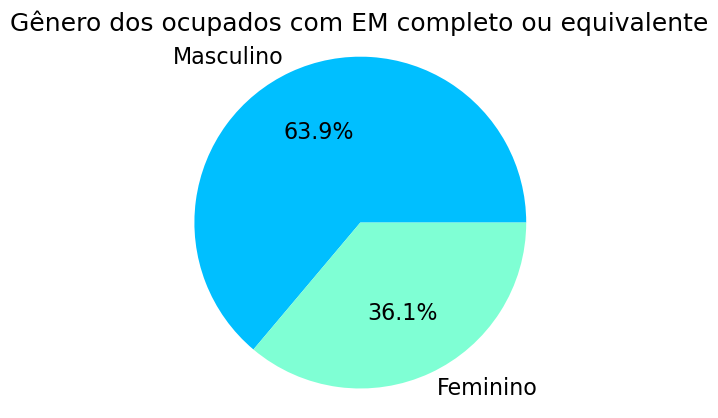

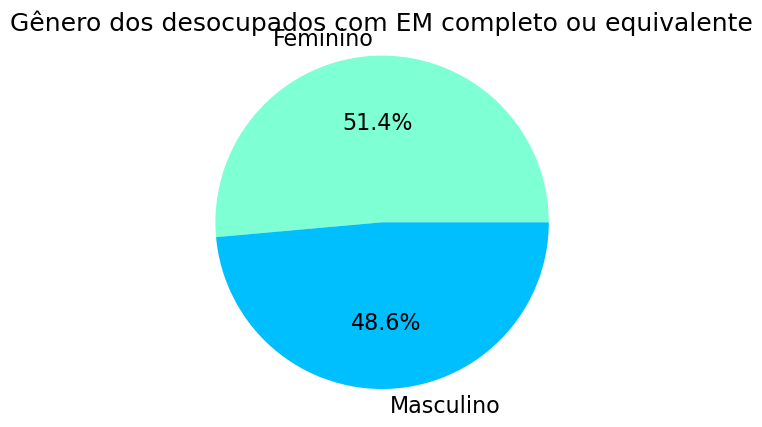

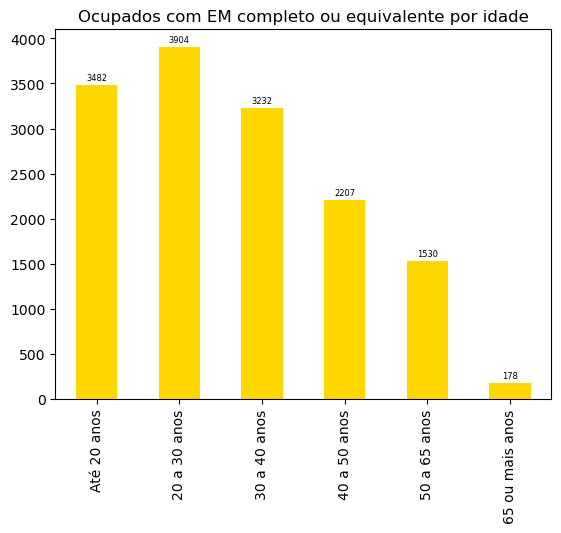

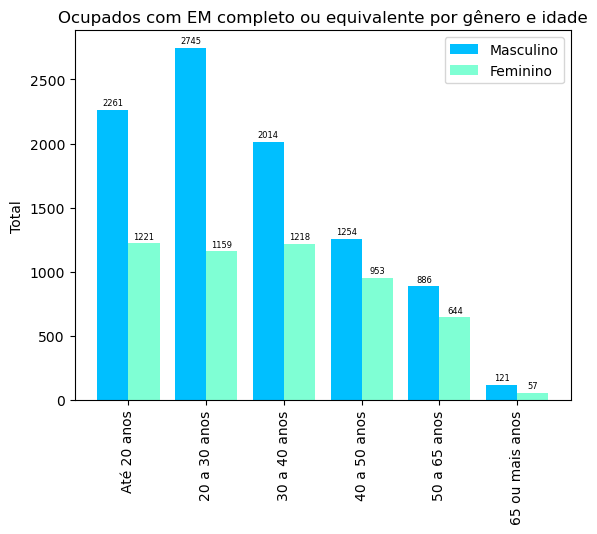

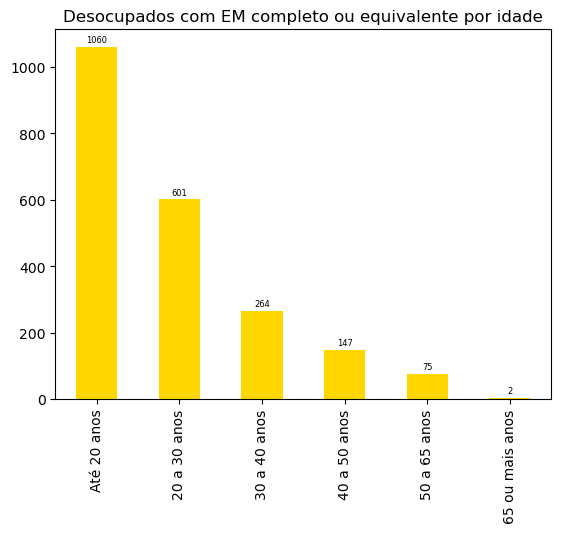

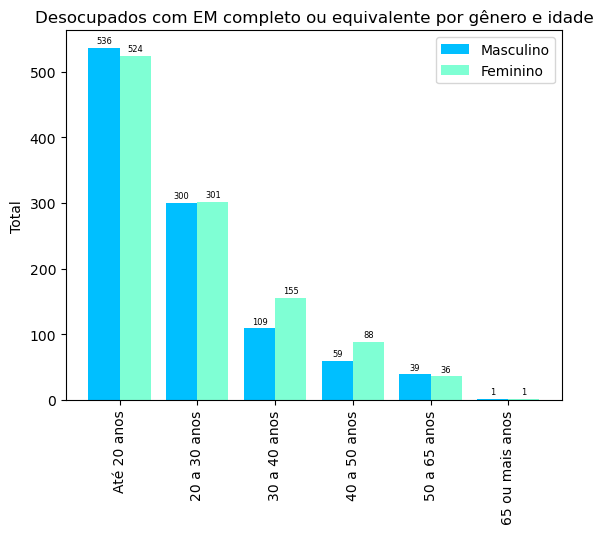

In [100]:
#  Médio completo ou equivalente
graficoInstrucaoPorGenero(df_MedioCompleto, 'Entrevistados com EM completo ou equivalente por gênero')
graficoEntrevistadosPorIdade(df_MedioCompleto, 'Entrevistados com EM completo ou equivalente por idade')

s_ocupadosMC, s_desocupadosMC = ocupacao(df_MedioIncompleto)
graficoPorGenero(s_ocupadosMC, "Gênero dos ocupados com EM completo ou equivalente")
graficoPorGenero(s_desocupadosMC, "Gênero dos desocupados com EM completo ou equivalente")
graficoEntrevistadosPorIdade(s_ocupadosMC, 'Ocupados com EM completo ou equivalente por idade')
graficoPorGeneroIdade(s_ocupadosMC[['V2009','V2007']], 'Ocupados com EM completo ou equivalente por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosMC[['V2009','V2007']],'Desocupados com EM completo ou equivalente por idade')
graficoPorGeneroIdade(s_desocupadosMC[['V2009','V2007']], 'Desocupados com EM completo ou equivalente por gênero e idade')

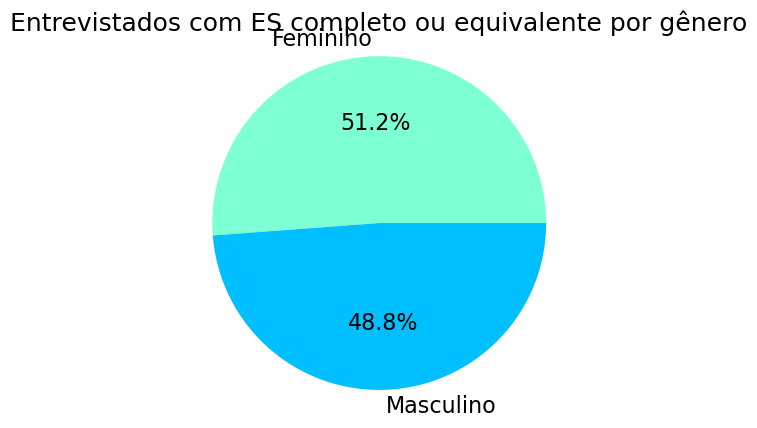

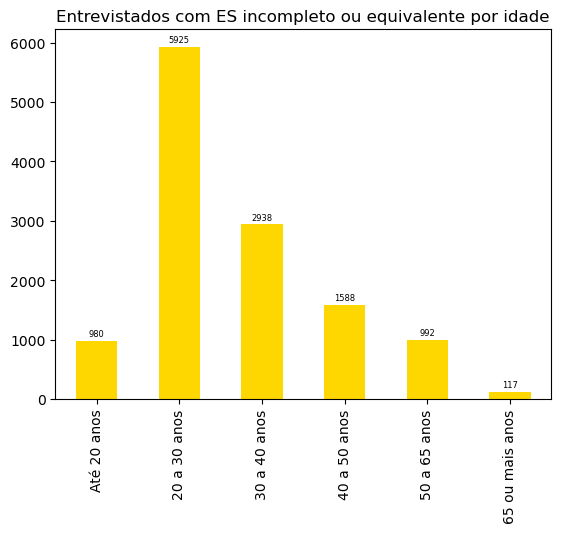

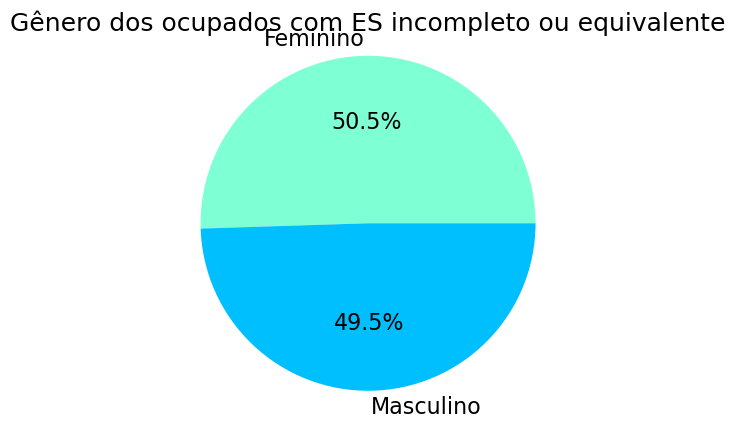

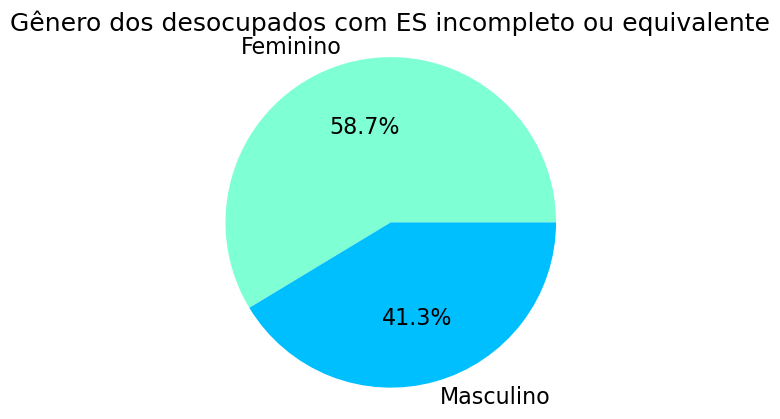

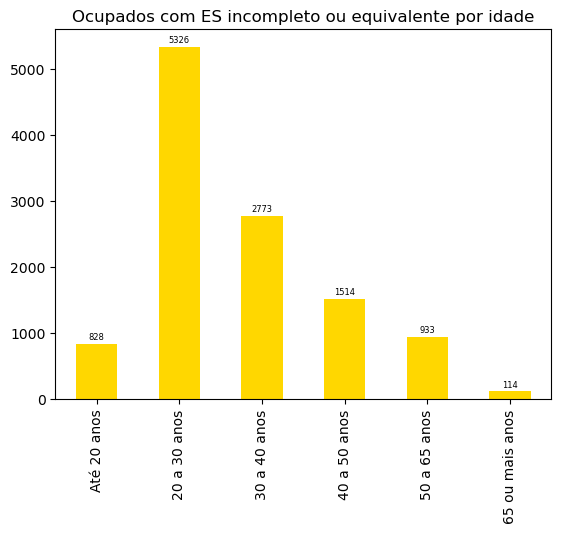

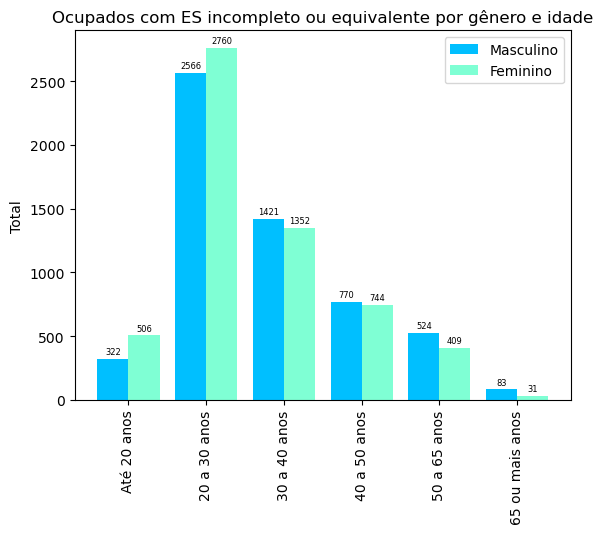

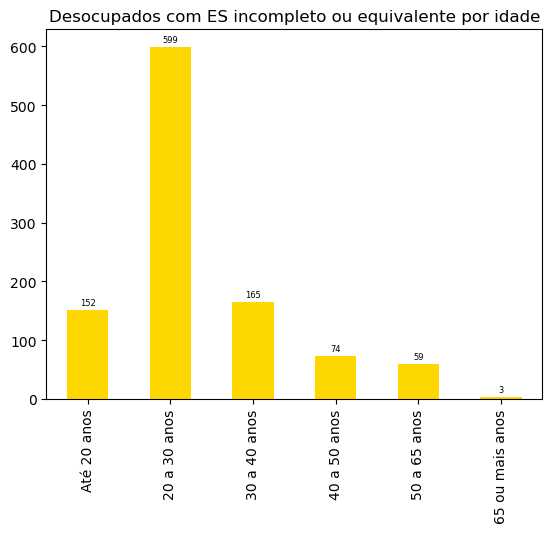

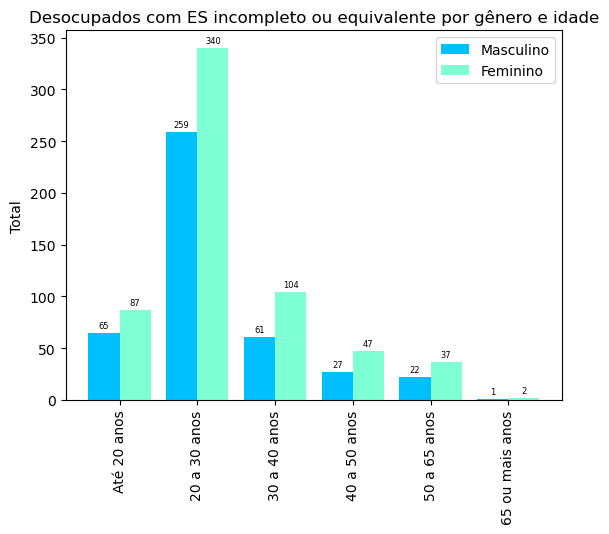

In [101]:
# 6 - Superior incompleto
graficoInstrucaoPorGenero(df_SupIncompleto, 'Entrevistados com ES completo ou equivalente por gênero')
graficoEntrevistadosPorIdade(df_SupIncompleto, 'Entrevistados com ES incompleto ou equivalente por idade')

s_ocupadosSI, s_desocupadosSI = ocupacao(df_SupIncompleto)
graficoPorGenero(s_ocupadosSI, "Gênero dos ocupados com ES incompleto ou equivalente")
graficoPorGenero(s_desocupadosSI, "Gênero dos desocupados com ES incompleto ou equivalente")
graficoEntrevistadosPorIdade(s_ocupadosSI, 'Ocupados com ES incompleto ou equivalente por idade')
graficoPorGeneroIdade(s_ocupadosSI[['V2009','V2007']], 'Ocupados com ES incompleto ou equivalente por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosSI[['V2009','V2007']],'Desocupados com ES incompleto ou equivalente por idade')
graficoPorGeneroIdade(s_desocupadosSI[['V2009','V2007']], 'Desocupados com ES incompleto ou equivalente por gênero e idade')    

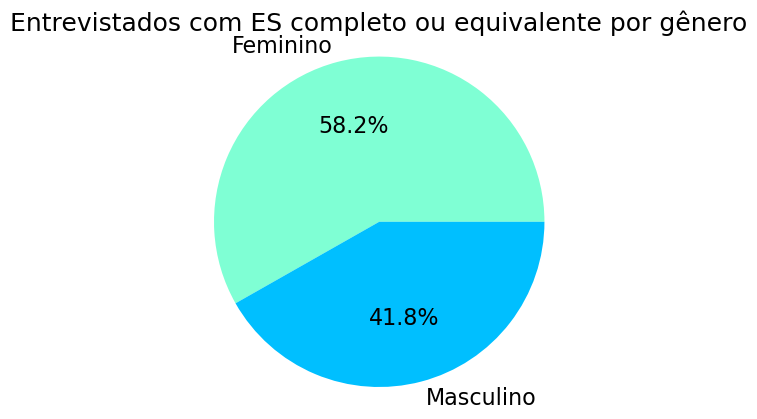

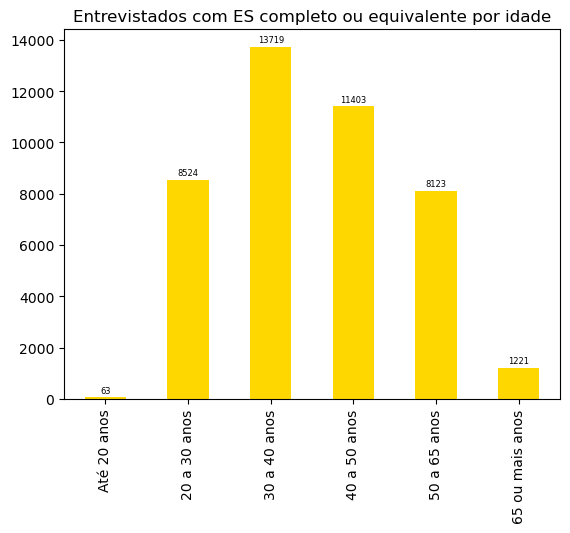

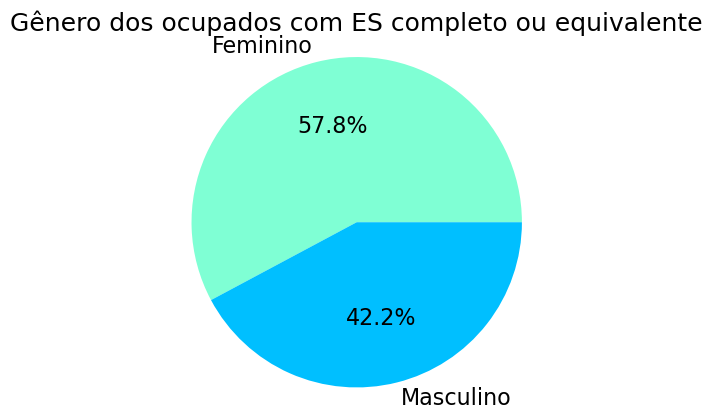

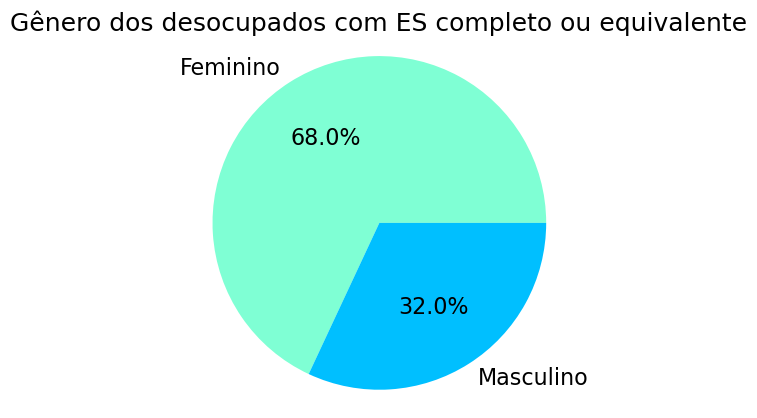

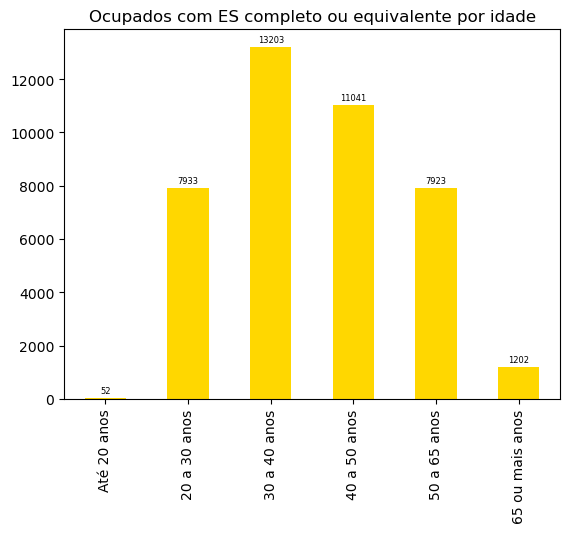

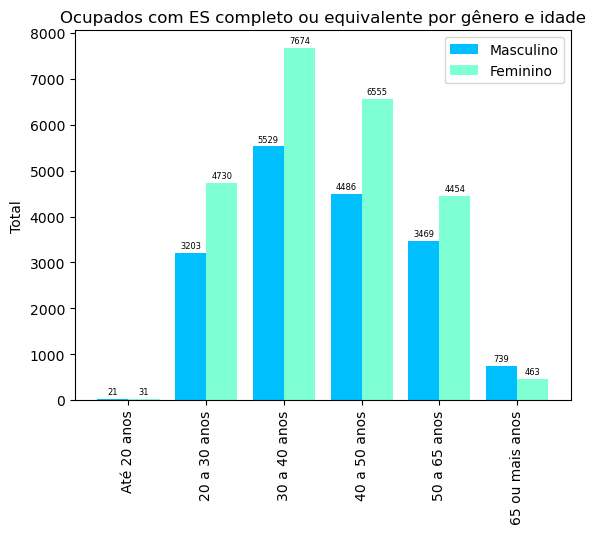

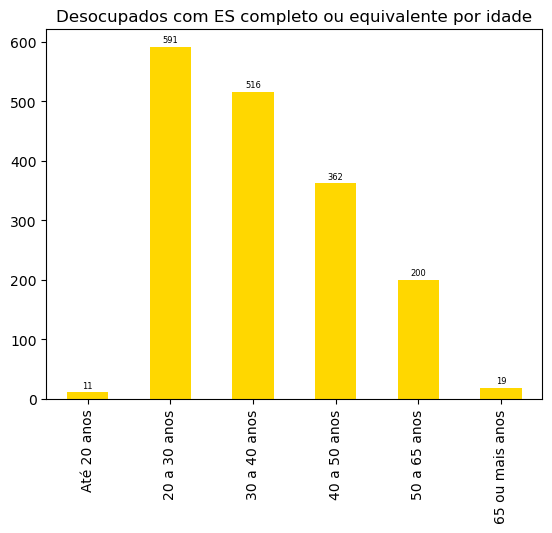

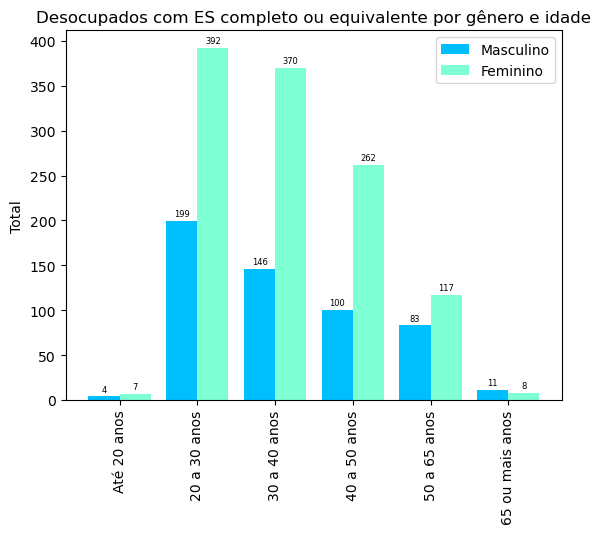

In [102]:
# 7 - Superior completo
graficoInstrucaoPorGenero(df_SupCompleto, 'Entrevistados com ES completo ou equivalente por gênero')
graficoEntrevistadosPorIdade(df_SupCompleto, 'Entrevistados com ES completo ou equivalente por idade')

s_ocupadosSC, s_desocupadosSC = ocupacao(df_SupCompleto)
graficoPorGenero(s_ocupadosSC, "Gênero dos ocupados com ES completo ou equivalente")
graficoPorGenero(s_desocupadosSC, "Gênero dos desocupados com ES completo ou equivalente")
graficoEntrevistadosPorIdade(s_ocupadosSC, 'Ocupados com ES completo ou equivalente por idade')
graficoPorGeneroIdade(s_ocupadosSC[['V2009','V2007']], 'Ocupados com ES completo ou equivalente por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosSC[['V2009','V2007']],'Desocupados com ES completo ou equivalente por idade')
graficoPorGeneroIdade(s_desocupadosSC[['V2009','V2007']], 'Desocupados com ES completo ou equivalente por gênero e idade')

In [103]:
# Visão ANO

df_ano = pd.concat([df_primeiroTriFinal, df_segundoTriFinal,df_terceiroTriFinal, df_quartoTriFinal],  ignore_index=True)

df_ano.info

<bound method DataFrame.info of         V2007  V2009  VD4002  VD3004  trimestre
0           2     45     1.0     4.0          1
1           1     26     2.0     4.0          1
2           1     18     2.0     3.0          1
3           2     22     2.0     4.0          1
4           1     50     1.0     7.0          1
...       ...    ...     ...     ...        ...
899449      2     64     1.0     7.0          4
899450      1     47     1.0     7.0          4
899451      2     36     1.0     7.0          4
899452      2     41     1.0     5.0          4
899453      1     53     1.0     2.0          4

[899454 rows x 5 columns]>

In [104]:
# Iniciando tratamenos com a variavel VD4002 (Condição de ocupação)
# Verificando os valores que existem para a variavel
df_ano['VD4002'].unique()

array([1., 2.])

In [105]:
# Verificação de valores 
df_genero = df_ano['V2007']
df_genero.isnull().sum()
genero_entrevistados = df_genero.value_counts()
genero_entrevistados.info()

<class 'pandas.core.series.Series'>
Int64Index: 2 entries, 1 to 2
Series name: V2007
Non-Null Count  Dtype
--------------  -----
2 non-null      int64
dtypes: int64(1)
memory usage: 32.0 bytes


In [106]:
df_ano[df_ano['V2007'] == 1]

,V2007,V2009,VD4002,VD3004,trimestre
1,1,26,2.0,4.0,1
2,1,18,2.0,3.0,1
4,1,50,1.0,7.0,1
5,1,20,1.0,5.0,1
6,1,45,1.0,3.0,1
...,...,...,...,...,...
899445,1,53,1.0,5.0,4
899446,1,23,1.0,7.0,4
899448,1,30,1.0,7.0,4
899450,1,47,1.0,7.0,4


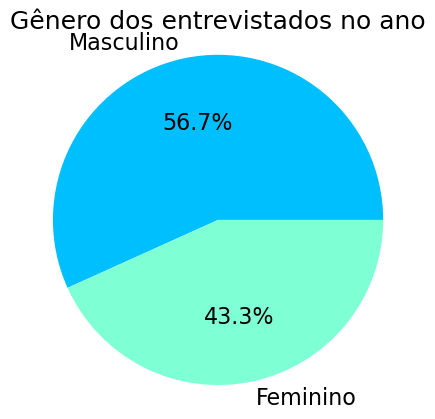

In [107]:
# Grafico de entrevistados por genero
graficoPorGenero(df_ano, 'Gênero dos entrevistados no ano')

In [108]:
df_ano['V2007'].value_counts().rename({1: 'Masculino', 2: 'Feminino'})

Masculino    510427
Feminino     389027
Name: V2007, dtype: int64

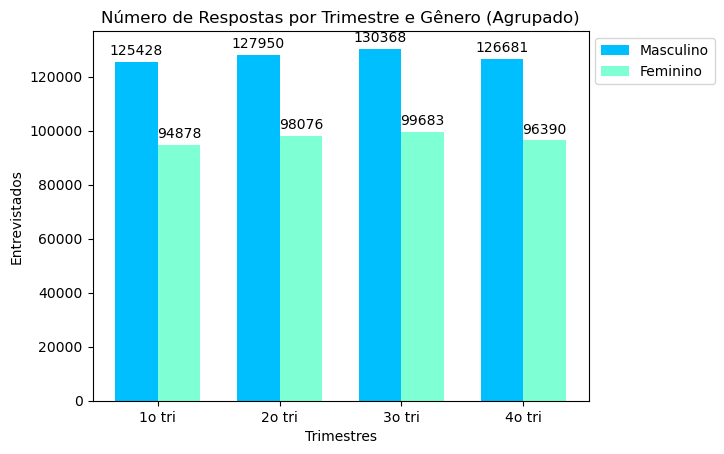

In [109]:
categories = ["1o tri","2o tri", "3o tri", "4o tri"]
index = len(categories)
x = np.arange(index)

width = 0.35

primeiroTri = df_ano[df_ano['trimestre'] == 1]['V2007'].value_counts().rename({1: 'Masculino', 2: 'Feminino'})
segundoTri = df_ano[df_ano['trimestre'] == 2]['V2007'].value_counts().rename({1: 'Masculino', 2: 'Feminino'})
terceiroTri = df_ano[df_ano['trimestre'] == 3]['V2007'].value_counts().rename({1: 'Masculino', 2: 'Feminino'})
quartoTri = df_ano[df_ano['trimestre'] == 4]['V2007'].value_counts().rename({1: 'Masculino', 2: 'Feminino'})

l_masculino = [primeiroTri.Masculino
              ,segundoTri.Masculino
              ,terceiroTri.Masculino
              ,quartoTri.Masculino]
l_feminino = [primeiroTri.Feminino
              ,segundoTri.Feminino
              ,terceiroTri.Feminino
              ,quartoTri.Feminino]
fig, ax = plt.subplots()
bar1 = ax.bar(x - width/2, l_masculino, width, color='deepskyblue', label='Masculino')
bar2 = ax.bar(x + width/2,  l_feminino, width, color='aquamarine', label='Feminino')

# Adding labels and title
ax.set_xlabel('Trimestres')
ax.set_ylabel('Entrevistados')
ax.set_title('Número de Respostas por Trimestre e Gênero (Agrupado)')
ax.set_xticks(x)
ax.set_xticklabels(categories)
ax.legend(bbox_to_anchor=(1, 1), loc='upper left')

line_values = [
    primeiroTri.Masculino - primeiroTri.Feminino
    , segundoTri.Masculino - segundoTri.Feminino
    , terceiroTri.Masculino - terceiroTri.Feminino
    , quartoTri.Masculino - quartoTri.Feminino
]


#Linha
#ax2 = ax.twinx()
#ax2.plot(x, line_values, color='r', marker='o', label='Line Values')
#ax2.set_ylabel('Line Values', color='r')


def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

autolabel(bar1)
autolabel(bar2)

plt.show()

In [110]:
df_ano[df_ano['V2009'] < 14].value_counts()

Series([], dtype: int64)

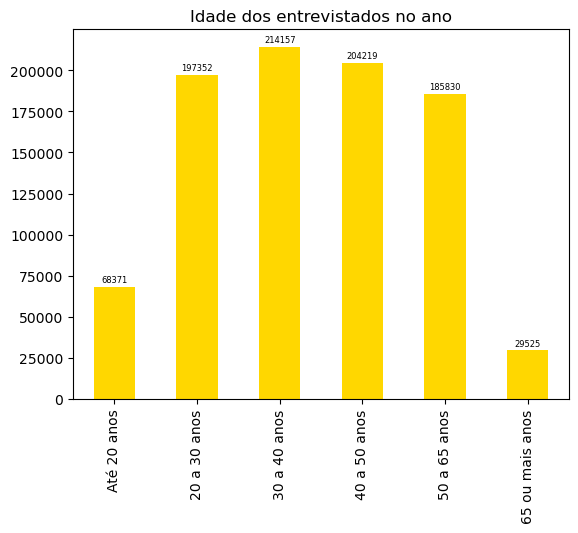

In [111]:
# Grafico por idade 
graficoEntrevistadosPorIdade(df_ano, 'Idade dos entrevistados no ano')

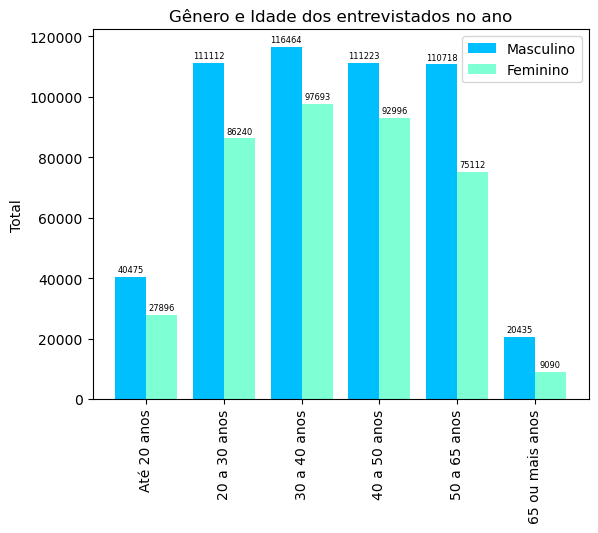

In [112]:
# Grafico por genero e idade
graficoPorGeneroIdade(df_ano, 'Gênero e Idade dos entrevistados no ano')

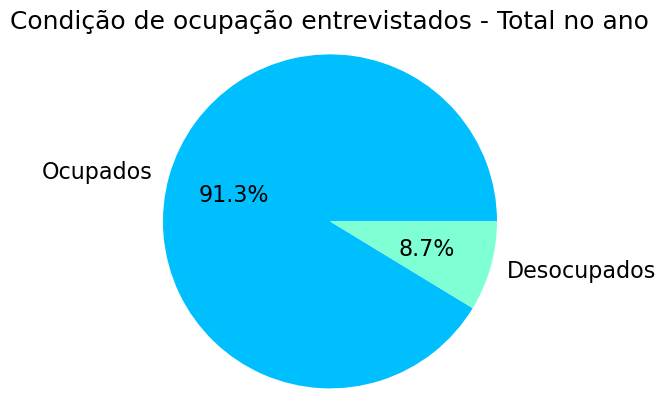

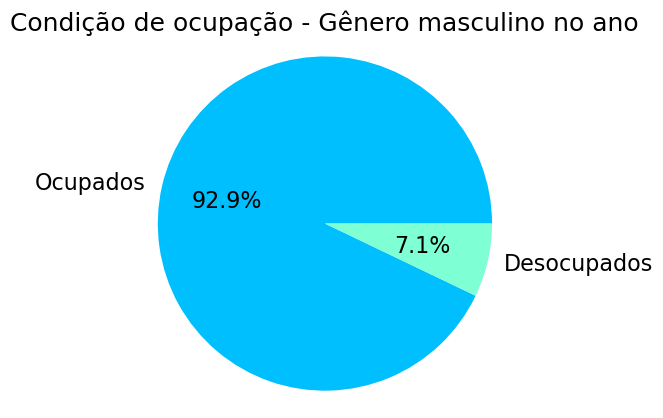

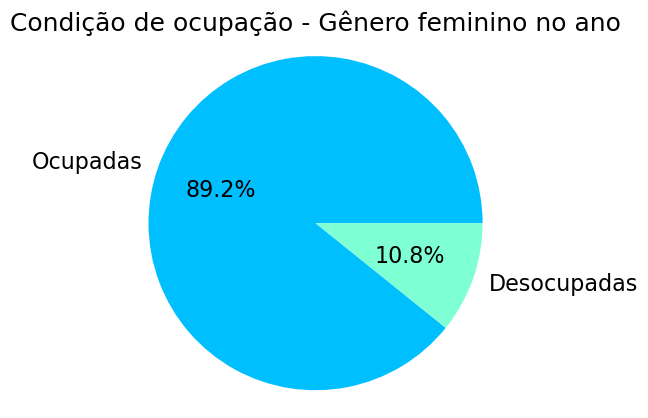

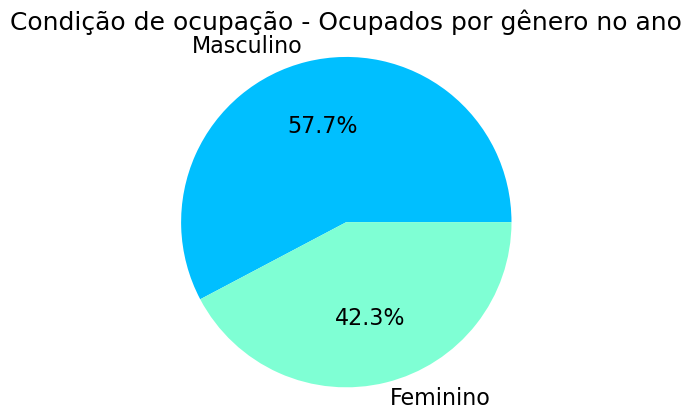

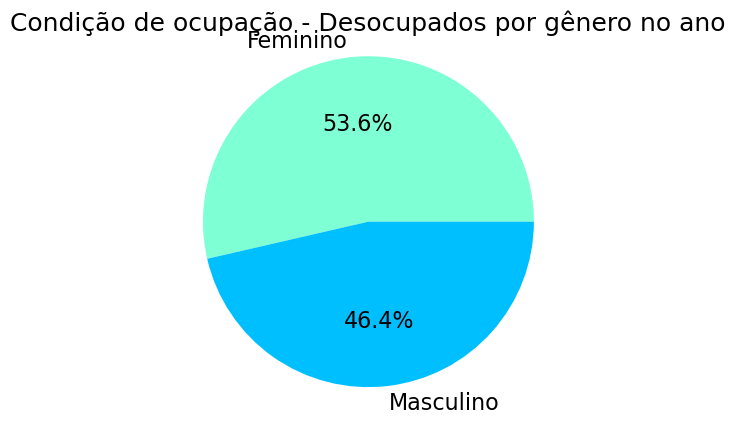

In [113]:
graficoOcupacao(df_ano, 'no ano')

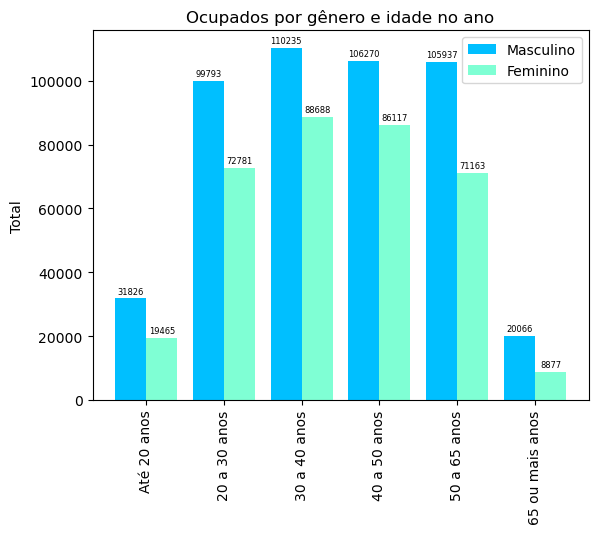

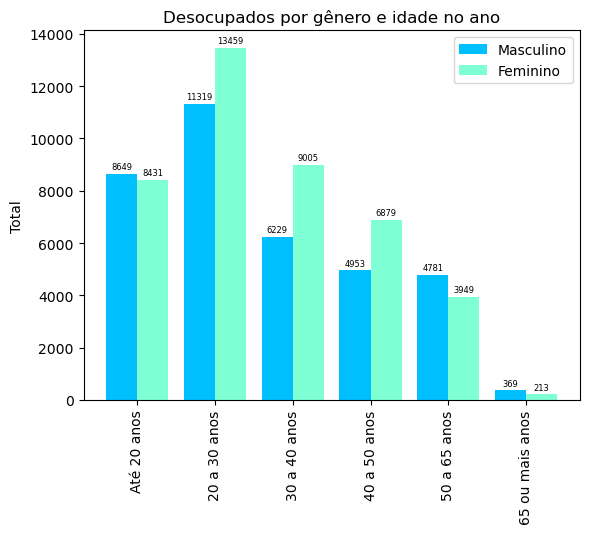

In [114]:
# Ocupados x Genero e Idade
#graficoPorGeneroIdade(df_primeiroTriFinal, )

s_ocupados, s_desocupados = ocupacao(df_ano)

graficoPorGeneroIdade(s_ocupados, 'Ocupados por gênero e idade no ano')
graficoPorGeneroIdade(s_desocupados, 'Desocupados por gênero e idade no ano')

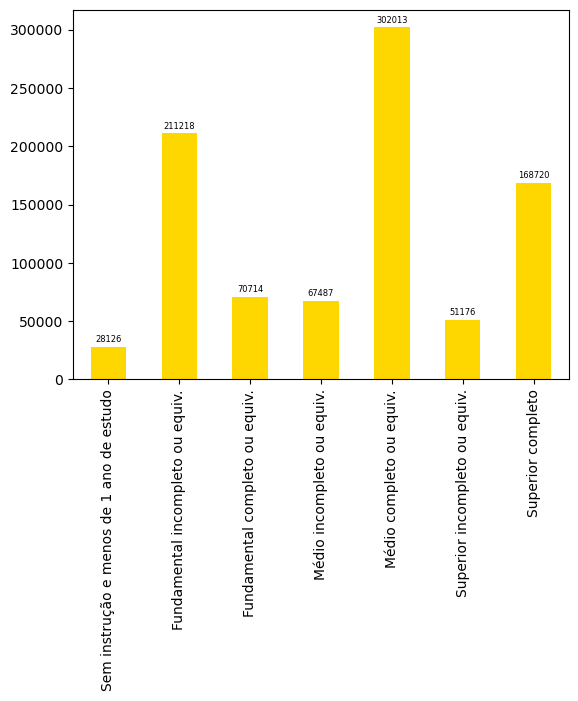

In [115]:
# Instrução dos entrevistados
graficoGrauInstrucao(df_ano, 'Grau de instrução dos entrevistados no ano')

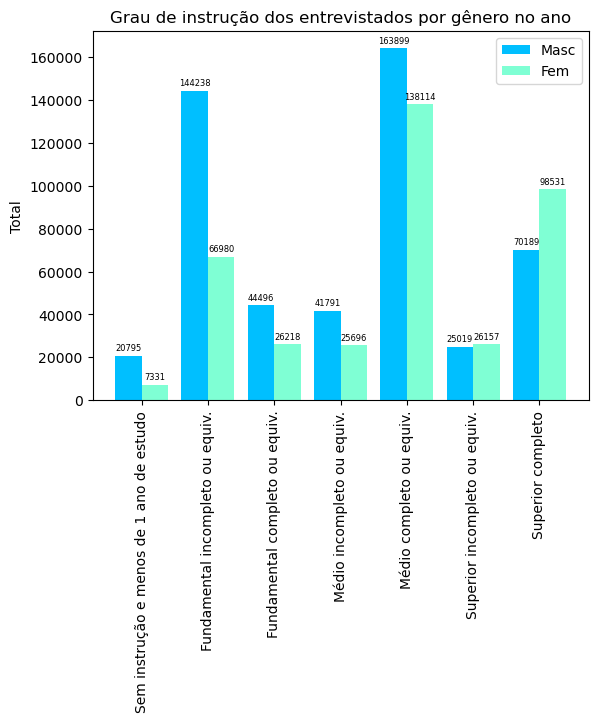

In [116]:
# Instrução dos entrevistados por sexo
graficoInstrucaoSexo(df_ano, 'Grau de instrução dos entrevistados por gênero no ano')

In [117]:
def contaIdade(s_idade):
    #s_count_idade = s_idade.value_counts()
    s_grupoIdade = pd.cut(s_idade, [0,20,30,40,50,65,120]).value_counts().sort_index()
    return s_grupoIdade

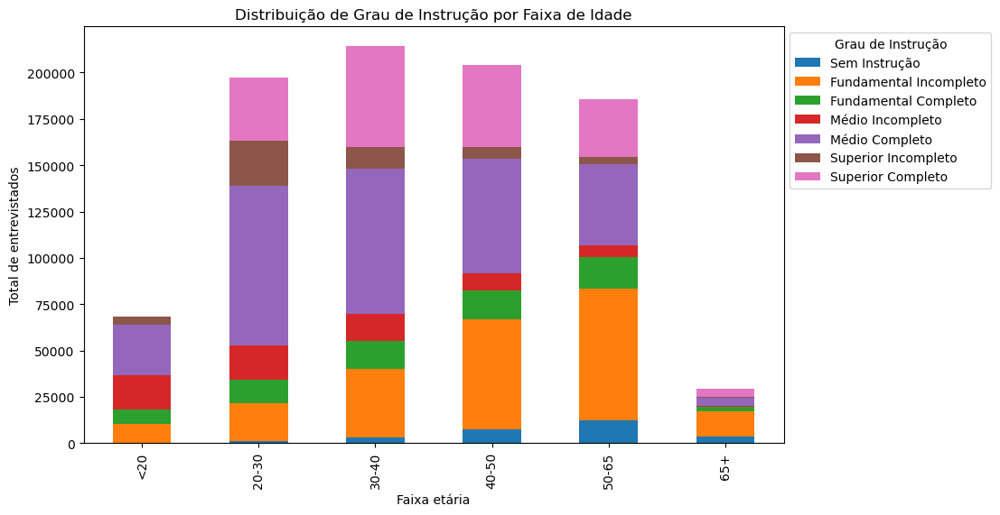

In [118]:
data = {
    'Faixa etária': ['<20', '20-30', '30-40', '40-50', '50-65', '65+'],
    'Sem Instrução': contaIdade(df_ano[df_ano['VD3004'] == 1.0]['V2009']),
    'Fundamental Incompleto': contaIdade(df_ano[df_ano['VD3004'] == 2.0]['V2009']),
    'Fundamental Completo': contaIdade(df_ano[df_ano['VD3004'] == 3.0]['V2009']),
    'Médio Incompleto': contaIdade(df_ano[df_ano['VD3004'] == 4.0]['V2009']),
    'Médio Completo': contaIdade(df_ano[df_ano['VD3004'] == 5.0]['V2009']),
    'Superior Incompleto': contaIdade(df_ano[df_ano['VD3004'] == 6.0]['V2009']),
    'Superior Completo': contaIdade(df_ano[df_ano['VD3004'] == 7.0]['V2009'])
}

df = pd.DataFrame(data)

# Configuração do gráfico de barras empilhadas
df.set_index('Faixa etária').plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Distribuição de Grau de Instrução por Faixa de Idade')
plt.xlabel('Faixa etária')
plt.ylabel('Total de entrevistados')
plt.legend(title='Grau de Instrução', bbox_to_anchor=(1, 1), loc='upper left')
plt.show()

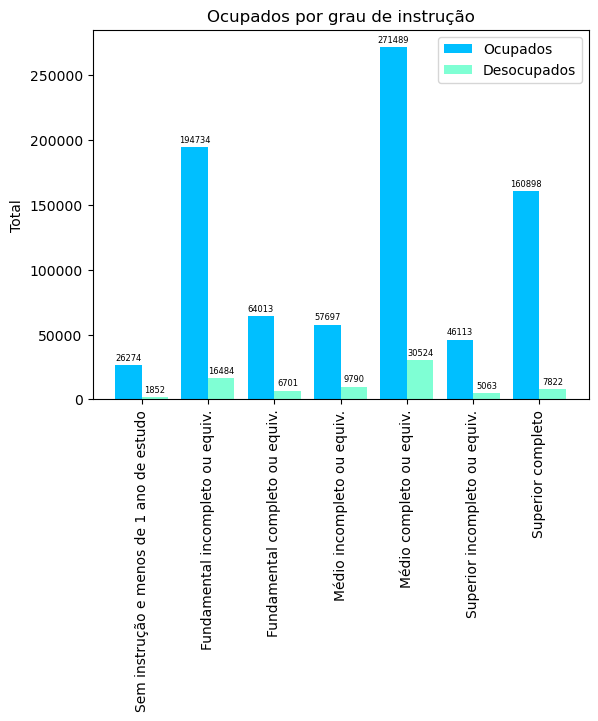

In [119]:
graficoOcupadosInstrucao(df_ano, 'Ocupados por grau de instrução')

In [120]:
df_ano

,V2007,V2009,VD4002,VD3004,trimestre
0,2,45,1.0,4.0,1
1,1,26,2.0,4.0,1
2,1,18,2.0,3.0,1
3,2,22,2.0,4.0,1
4,1,50,1.0,7.0,1
...,...,...,...,...,...
899449,2,64,1.0,7.0,4
899450,1,47,1.0,7.0,4
899451,2,36,1.0,7.0,4
899452,2,41,1.0,5.0,4


In [121]:
# Instrução
df_SemInstrucao,df_FundamentalIncompleto, df_FundamentalCompleto,  df_MedioIncompleto,  df_MedioCompleto, df_SupIncompleto, df_SupCompleto = instrucao(df_ano)

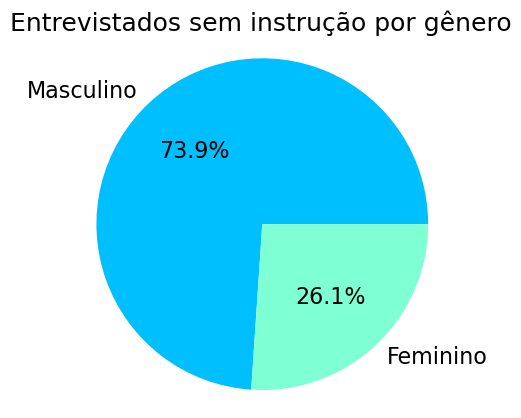

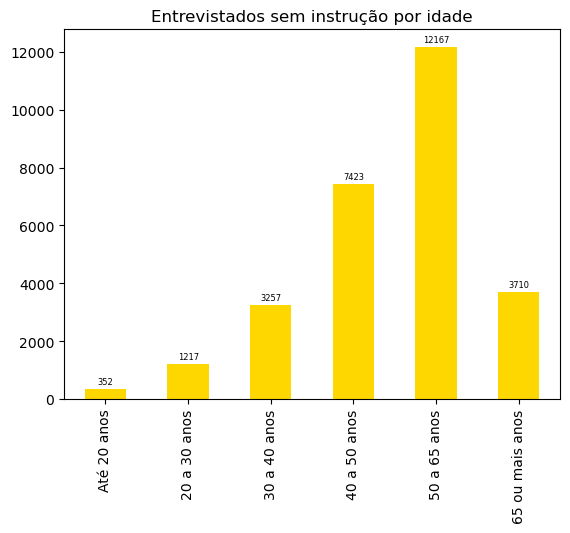

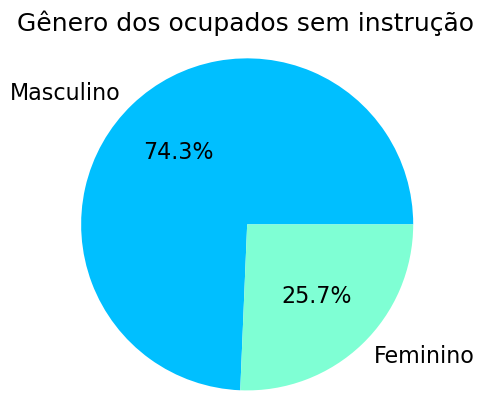

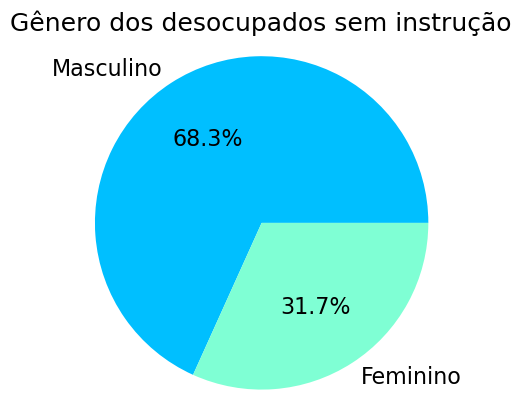

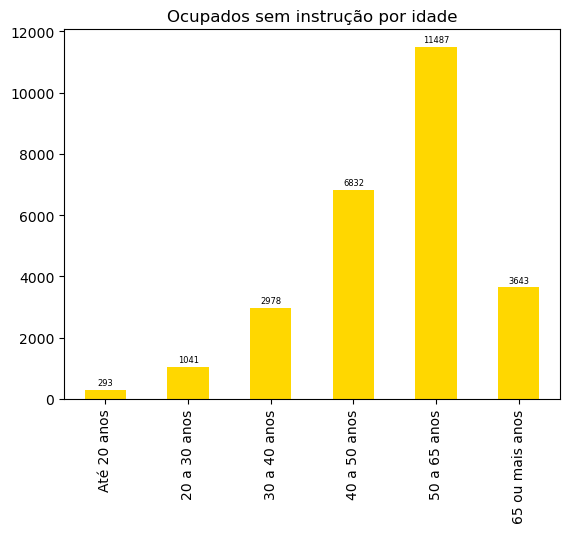

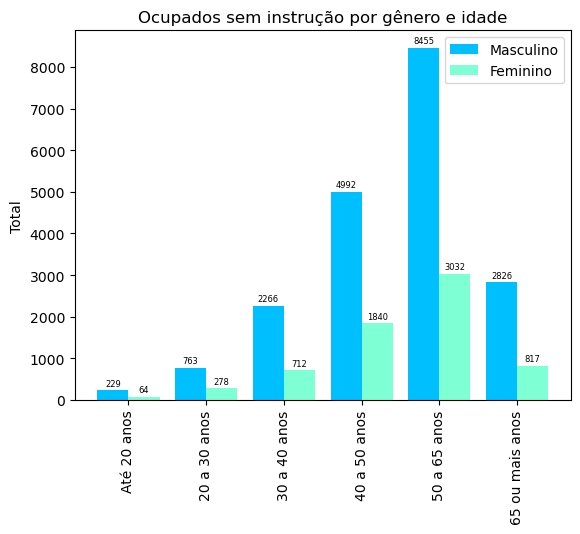

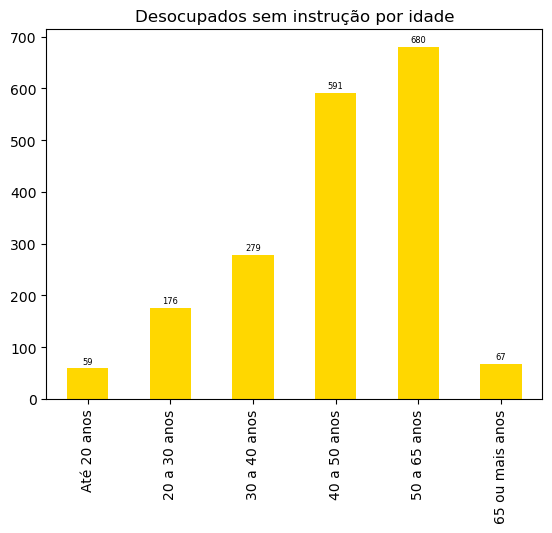

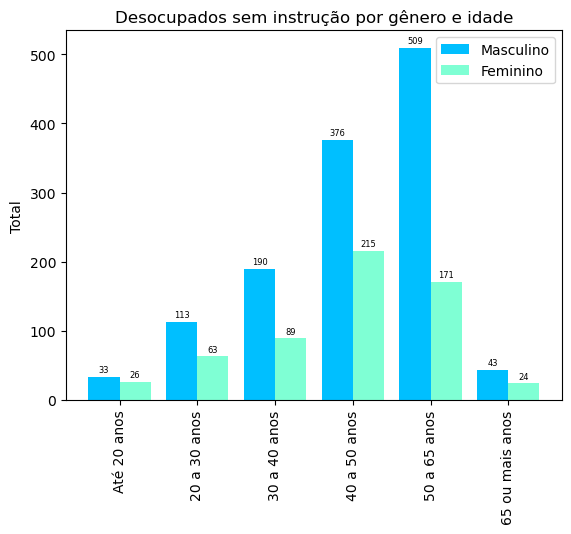

In [122]:
graficoInstrucaoPorGenero(df_SemInstrucao, 'Entrevistados sem instrução por gênero')
graficoEntrevistadosPorIdade(df_SemInstrucao, 'Entrevistados sem instrução por idade')

s_ocupadosSemInstrucao, s_desocupadosSemInstrucao = ocupacao(df_SemInstrucao)
graficoPorGenero(s_ocupadosSemInstrucao, "Gênero dos ocupados sem instrução")
graficoPorGenero(s_desocupadosSemInstrucao, "Gênero dos desocupados sem instrução")
graficoEntrevistadosPorIdade(s_ocupadosSemInstrucao, 'Ocupados sem instrução por idade')
graficoPorGeneroIdade(s_ocupadosSemInstrucao[['V2009','V2007']], 'Ocupados sem instrução por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosSemInstrucao[['V2009','V2007']],'Desocupados sem instrução por idade')
graficoPorGeneroIdade(s_desocupadosSemInstrucao[['V2009','V2007']], 'Desocupados sem instrução por gênero e idade')

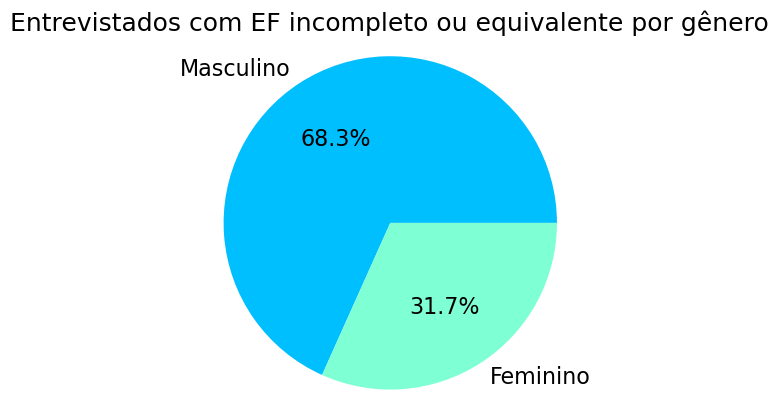

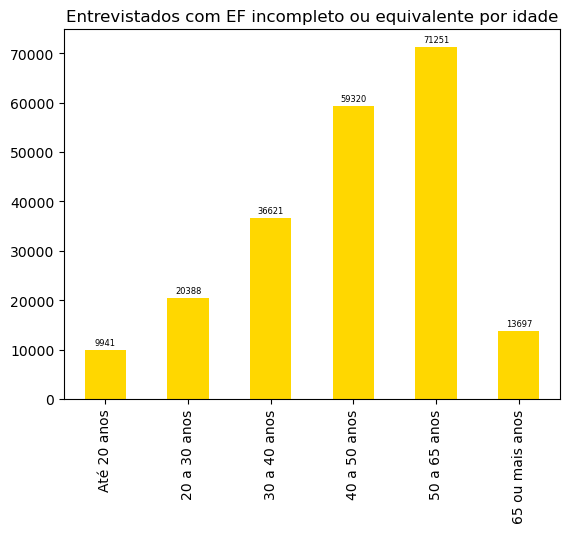

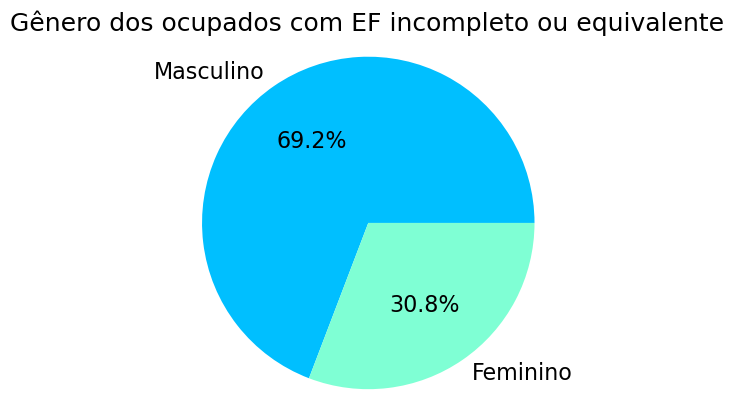

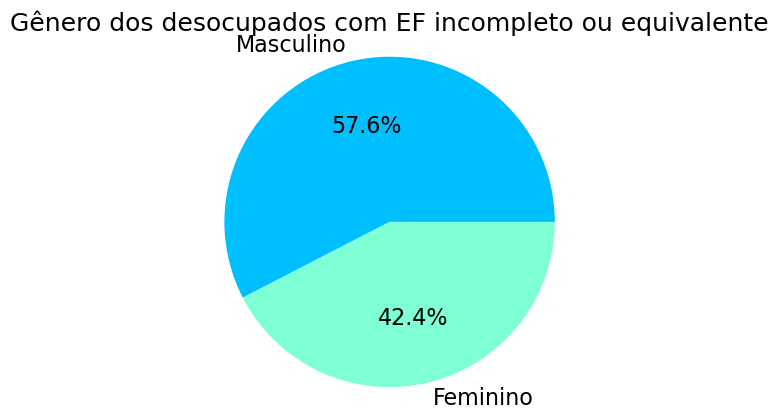

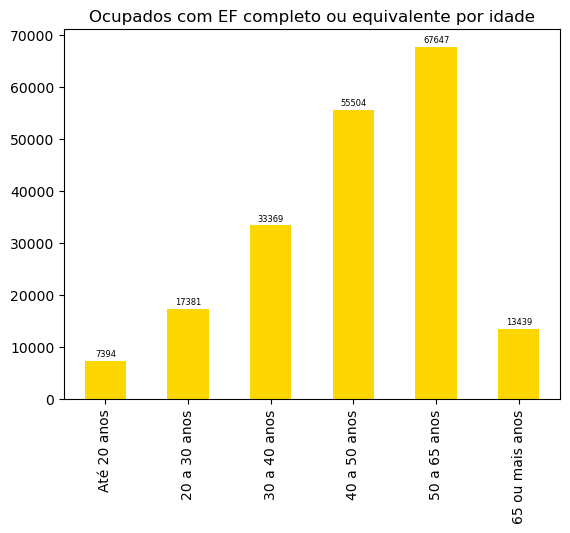

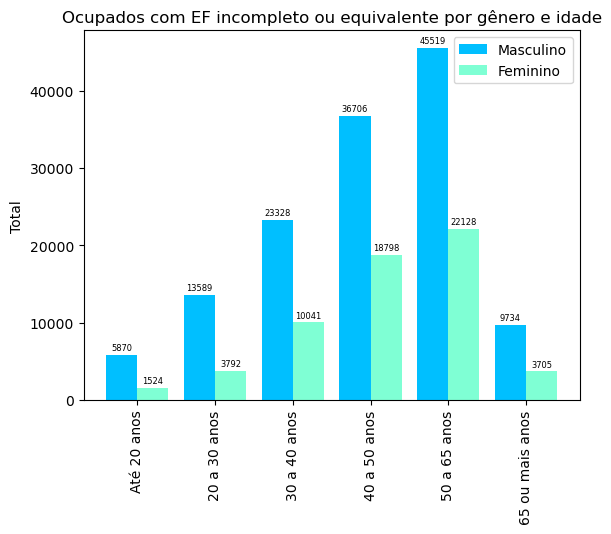

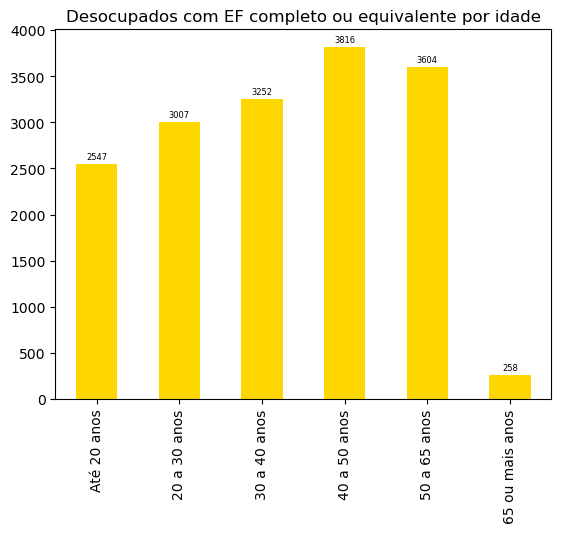

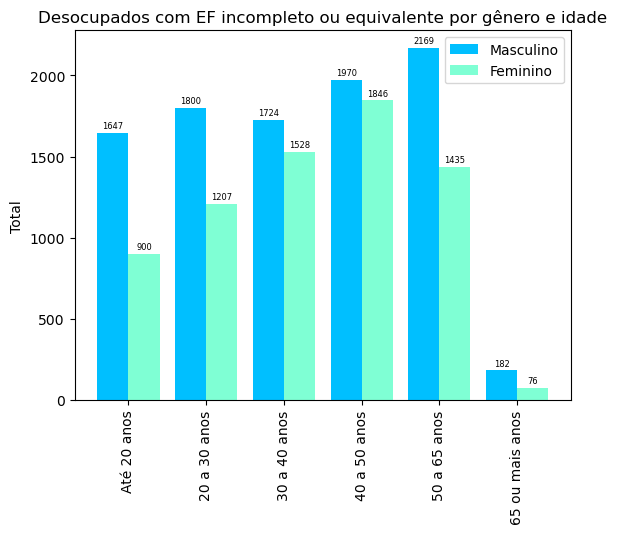

In [123]:
# Fundamental incompleto ou equivalente                     
graficoInstrucaoPorGenero(df_FundamentalIncompleto, 'Entrevistados com EF incompleto ou equivalente por gênero')
graficoEntrevistadosPorIdade(df_FundamentalIncompleto, 'Entrevistados com EF incompleto ou equivalente por idade')

s_ocupadosFundamental, s_desocupadosFundamental = ocupacao(df_FundamentalIncompleto)
graficoPorGenero(s_ocupadosFundamental, "Gênero dos ocupados com EF incompleto ou equivalente")
graficoPorGenero(s_desocupadosFundamental, "Gênero dos desocupados com EF incompleto ou equivalente")
graficoEntrevistadosPorIdade(s_ocupadosFundamental, 'Ocupados com EF completo ou equivalente por idade')
graficoPorGeneroIdade(s_ocupadosFundamental[['V2009','V2007']], 'Ocupados com EF incompleto ou equivalente por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosFundamental[['V2009','V2007']],'Desocupados com EF completo ou equivalente por idade')
graficoPorGeneroIdade(s_desocupadosFundamental[['V2009','V2007']], 'Desocupados com EF incompleto ou equivalente por gênero e idade')

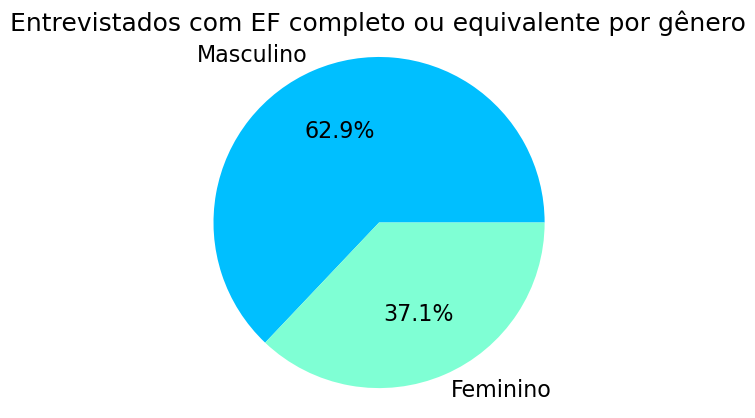

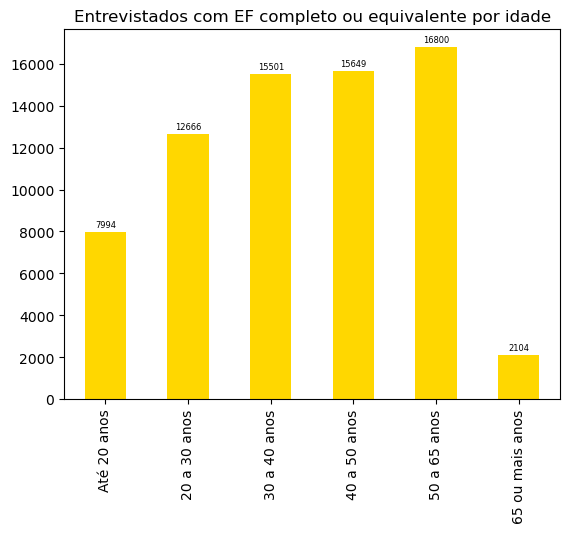

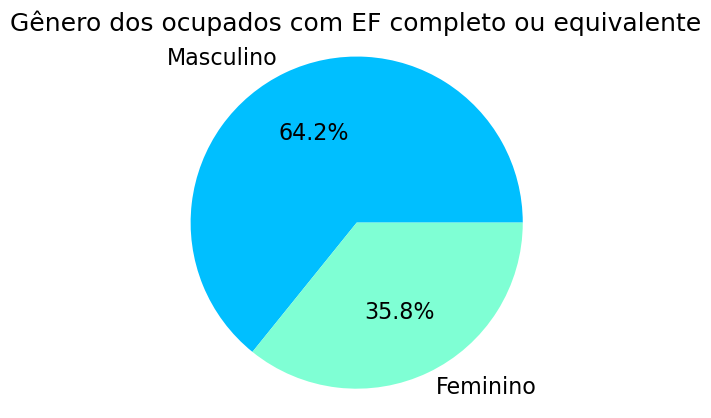

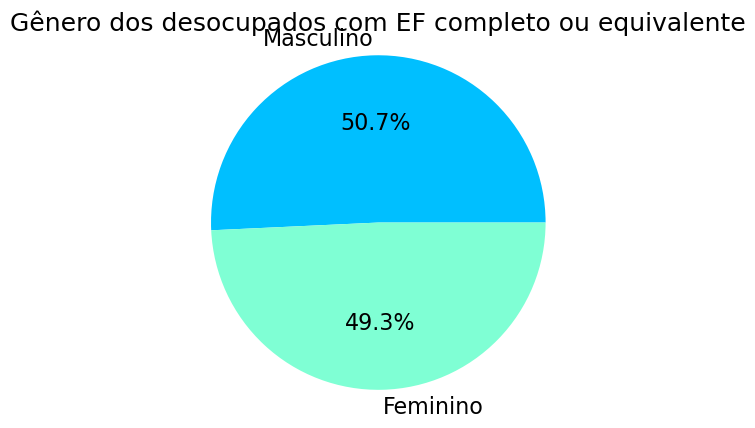

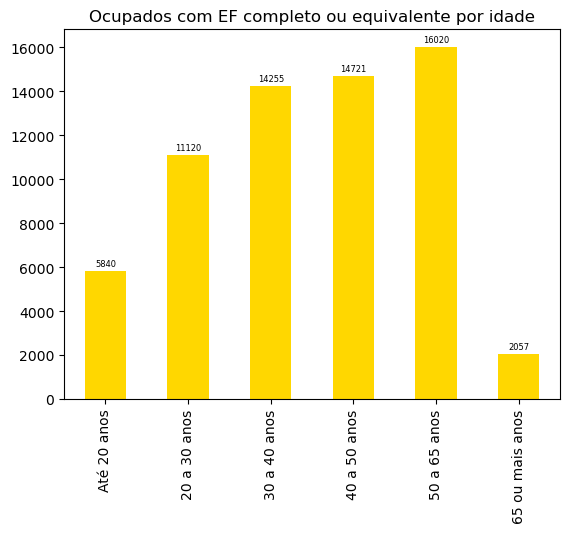

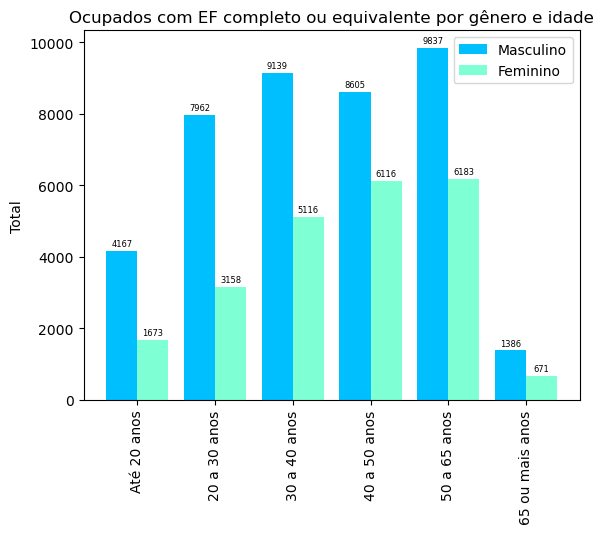

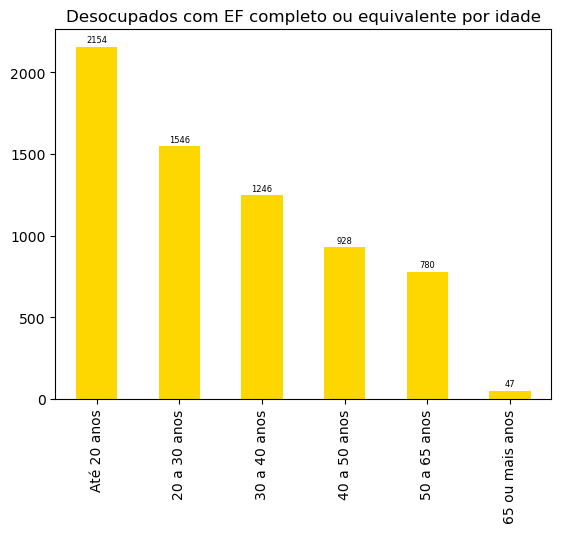

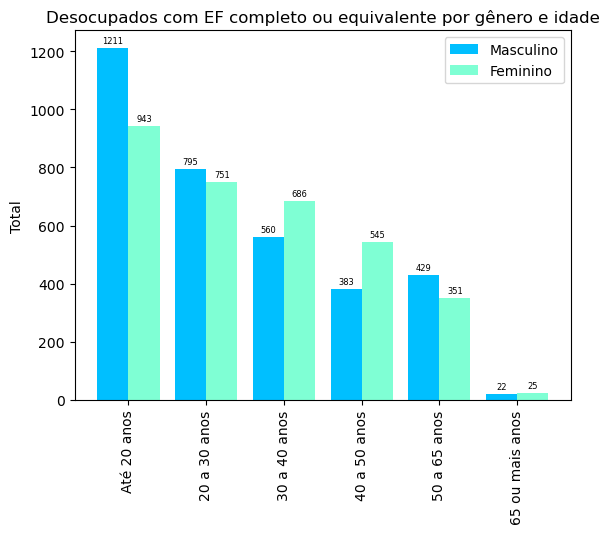

In [124]:
# Fundamental completo ou equivalente                     
graficoInstrucaoPorGenero(df_FundamentalCompleto, 'Entrevistados com EF completo ou equivalente por gênero')
graficoEntrevistadosPorIdade(df_FundamentalCompleto, 'Entrevistados com EF completo ou equivalente por idade')

s_ocupadosFundamental, s_desocupadosFundamental = ocupacao(df_FundamentalCompleto)
graficoPorGenero(s_ocupadosFundamental, "Gênero dos ocupados com EF completo ou equivalente")
graficoPorGenero(s_desocupadosFundamental, "Gênero dos desocupados com EF completo ou equivalente")
graficoEntrevistadosPorIdade(s_ocupadosFundamental, 'Ocupados com EF completo ou equivalente por idade')
graficoPorGeneroIdade(s_ocupadosFundamental[['V2009','V2007']], 'Ocupados com EF completo ou equivalente por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosFundamental[['V2009','V2007']],'Desocupados com EF completo ou equivalente por idade')
graficoPorGeneroIdade(s_desocupadosFundamental[['V2009','V2007']], 'Desocupados com EF completo ou equivalente por gênero e idade')

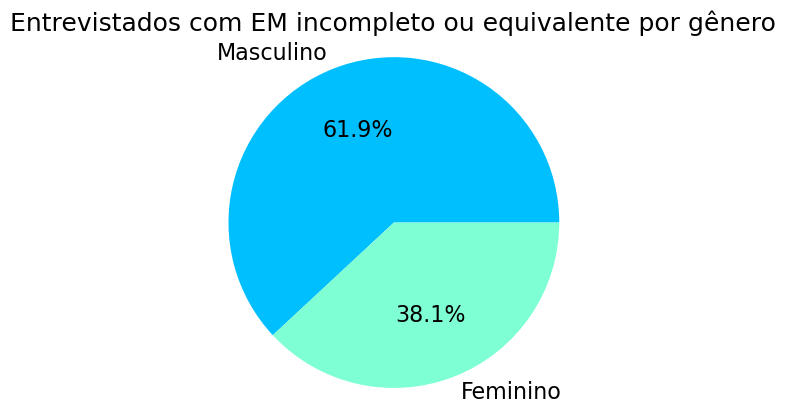

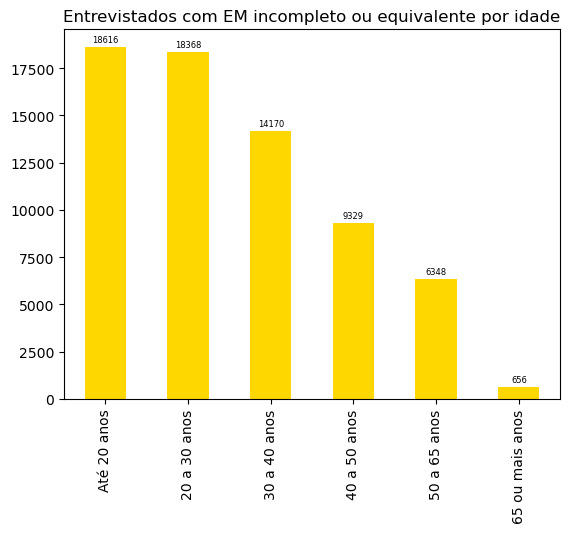

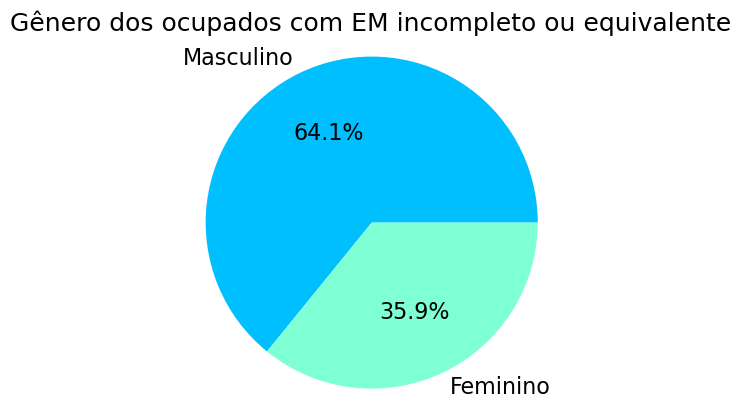

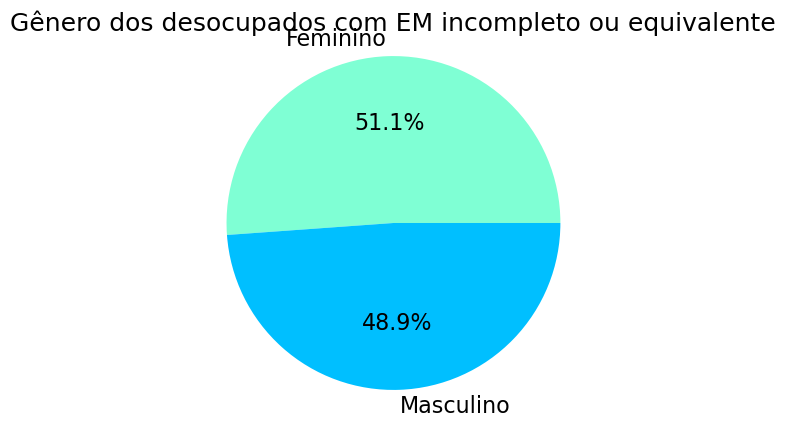

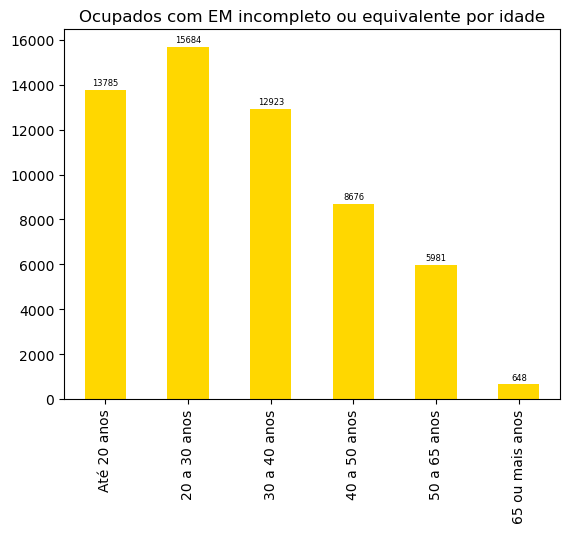

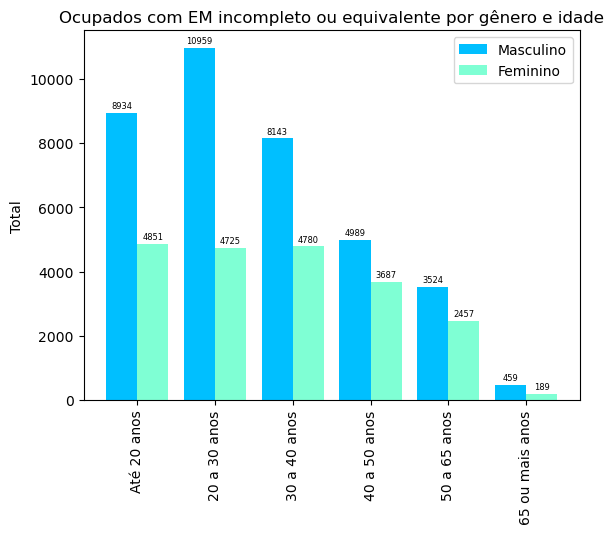

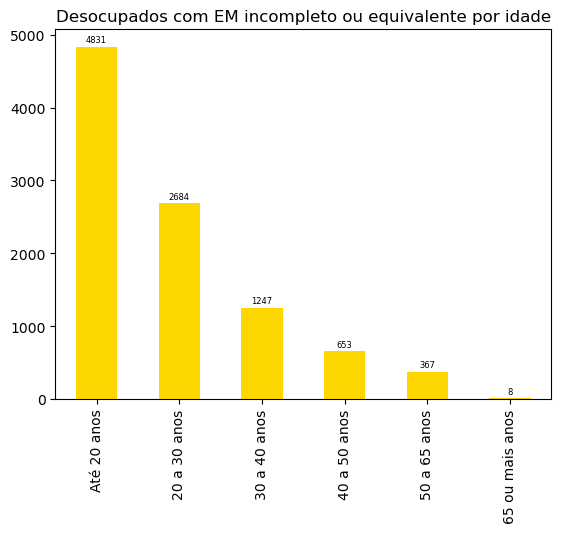

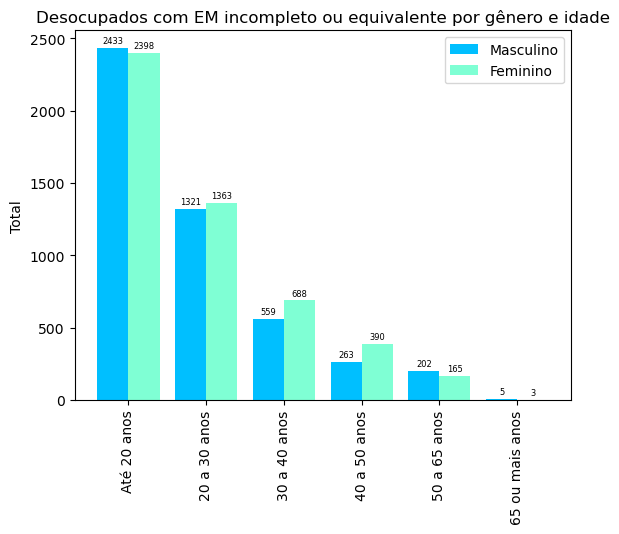

In [125]:
# Médio incompleto ou equivalente
graficoInstrucaoPorGenero(df_MedioIncompleto, 'Entrevistados com EM incompleto ou equivalente por gênero')
graficoEntrevistadosPorIdade(df_MedioIncompleto, 'Entrevistados com EM incompleto ou equivalente por idade')

s_ocupadosMI, s_desocupadosMI = ocupacao(df_MedioIncompleto)
graficoPorGenero(s_ocupadosMI, "Gênero dos ocupados com EM incompleto ou equivalente")
graficoPorGenero(s_desocupadosMI, "Gênero dos desocupados com EM incompleto ou equivalente")
graficoEntrevistadosPorIdade(s_ocupadosMI, 'Ocupados com EM incompleto ou equivalente por idade')
graficoPorGeneroIdade(s_ocupadosMI[['V2009','V2007']], 'Ocupados com EM incompleto ou equivalente por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosMI[['V2009','V2007']],'Desocupados com EM incompleto ou equivalente por idade')
graficoPorGeneroIdade(s_desocupadosMI[['V2009','V2007']], 'Desocupados com EM incompleto ou equivalente por gênero e idade')

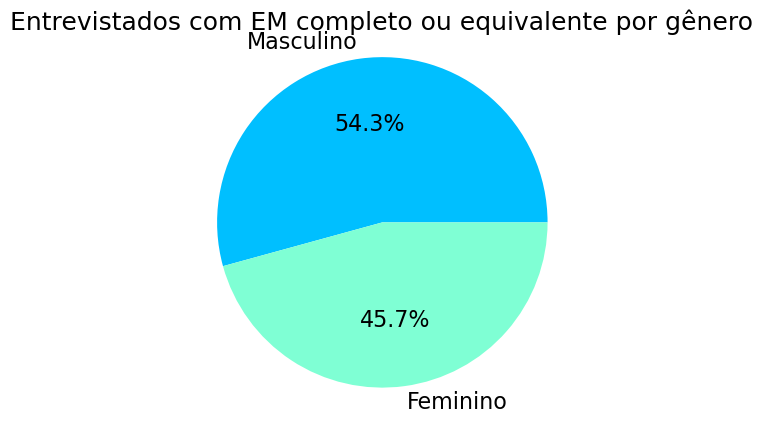

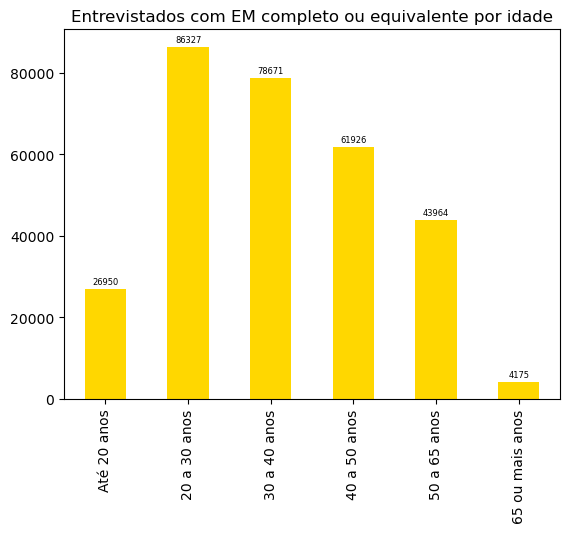

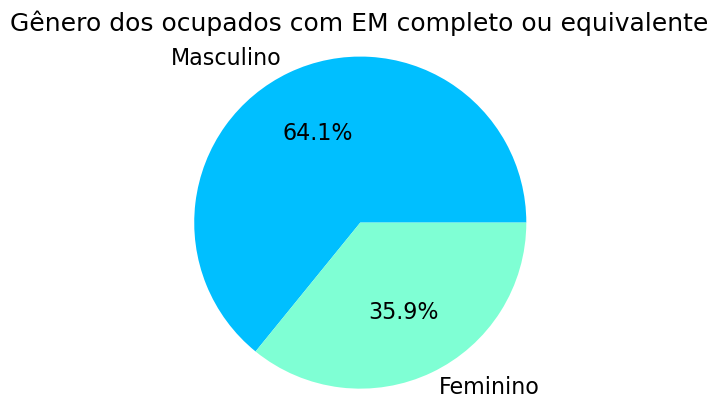

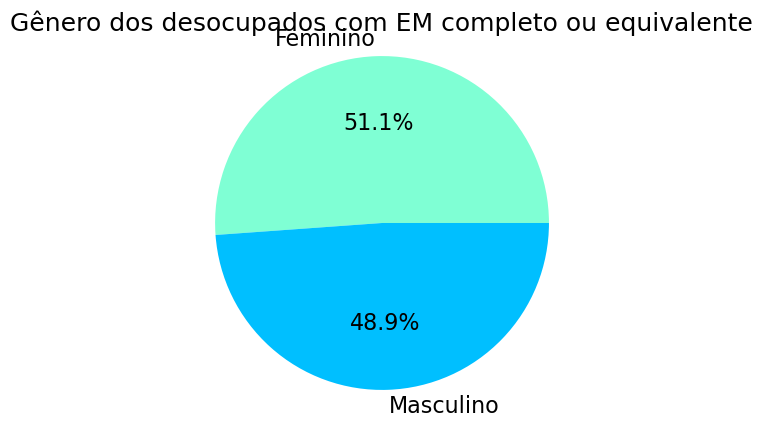

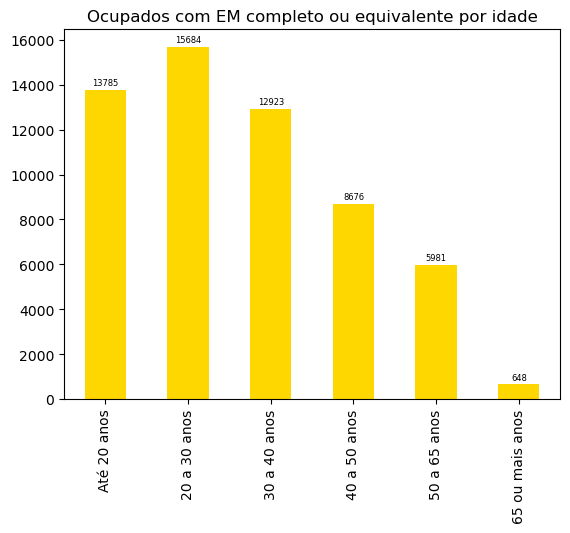

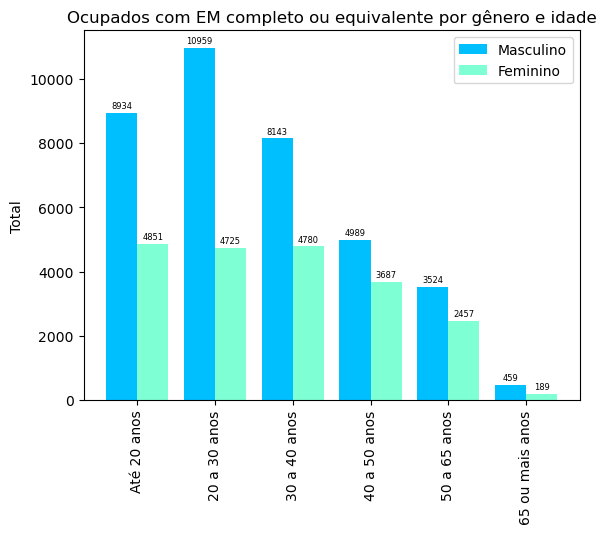

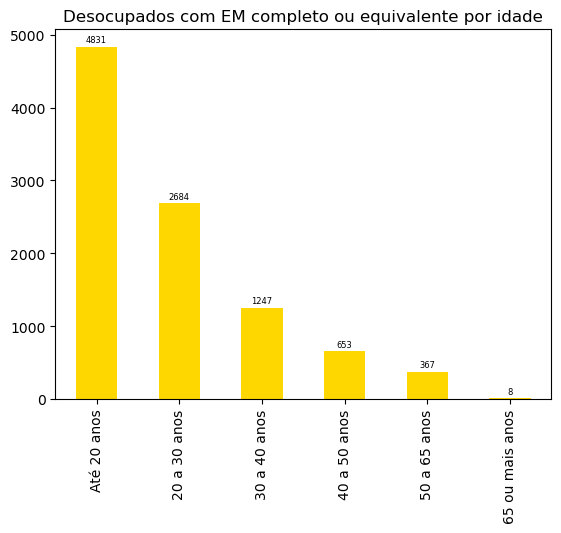

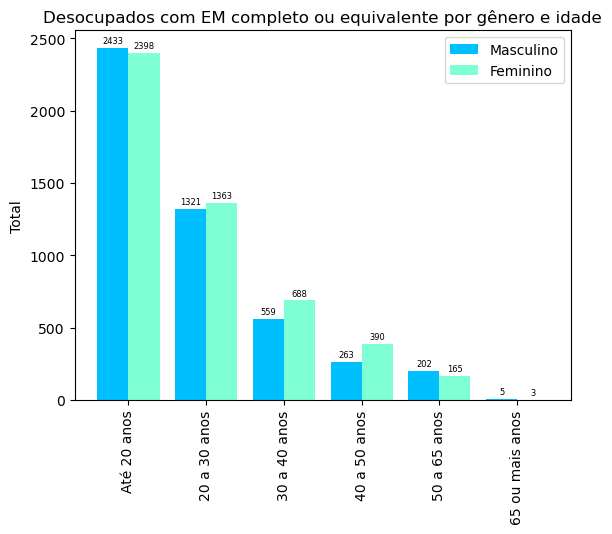

In [126]:
#  Médio completo ou equivalente
graficoInstrucaoPorGenero(df_MedioCompleto, 'Entrevistados com EM completo ou equivalente por gênero')
graficoEntrevistadosPorIdade(df_MedioCompleto, 'Entrevistados com EM completo ou equivalente por idade')

s_ocupadosMC, s_desocupadosMC = ocupacao(df_MedioIncompleto)
graficoPorGenero(s_ocupadosMC, "Gênero dos ocupados com EM completo ou equivalente")
graficoPorGenero(s_desocupadosMC, "Gênero dos desocupados com EM completo ou equivalente")
graficoEntrevistadosPorIdade(s_ocupadosMC, 'Ocupados com EM completo ou equivalente por idade')
graficoPorGeneroIdade(s_ocupadosMC[['V2009','V2007']], 'Ocupados com EM completo ou equivalente por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosMC[['V2009','V2007']],'Desocupados com EM completo ou equivalente por idade')
graficoPorGeneroIdade(s_desocupadosMC[['V2009','V2007']], 'Desocupados com EM completo ou equivalente por gênero e idade')

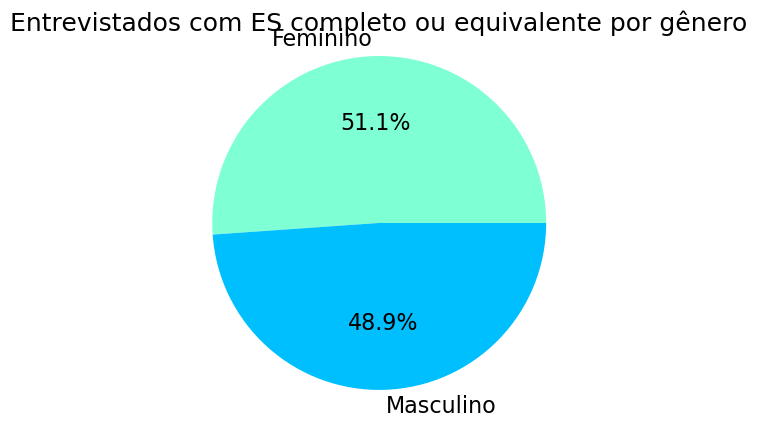

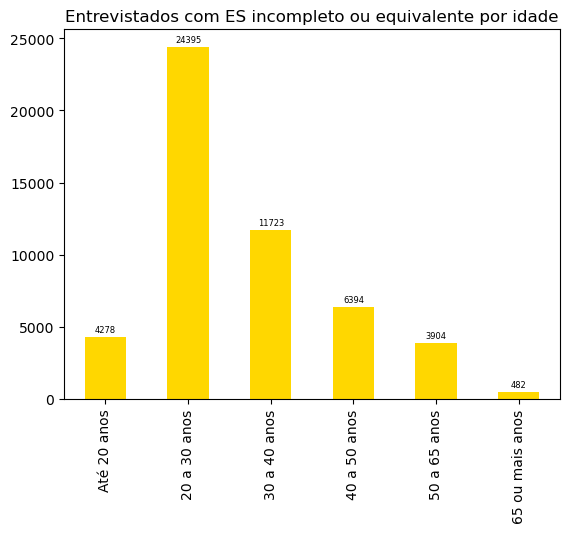

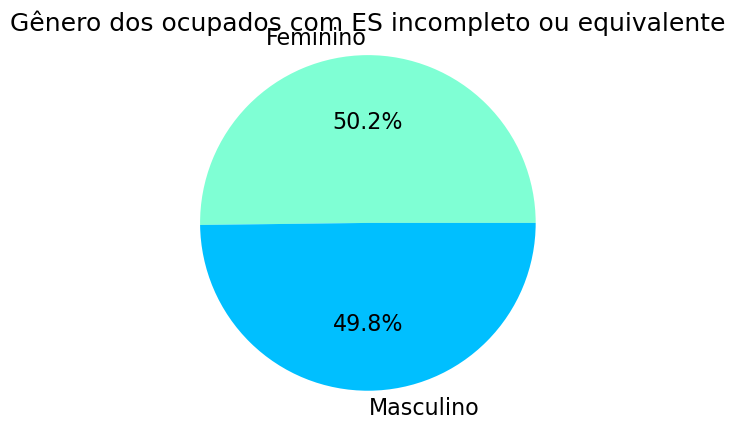

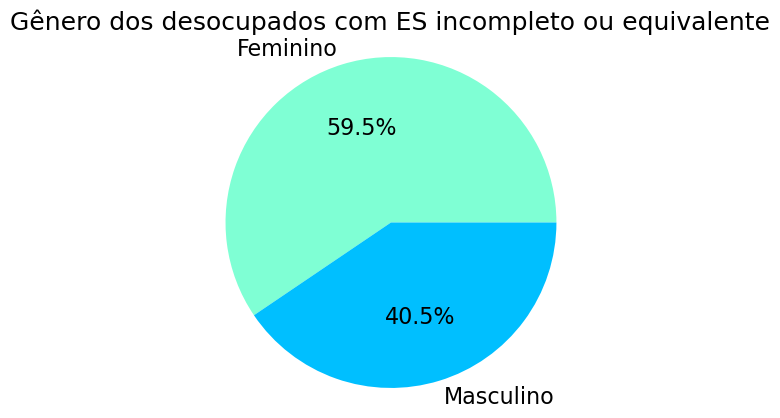

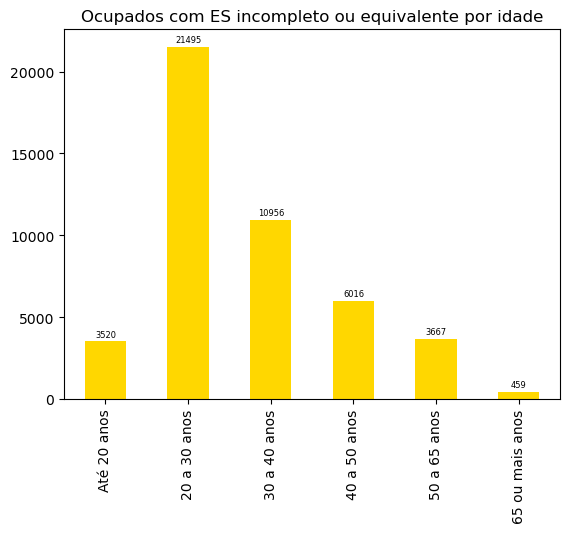

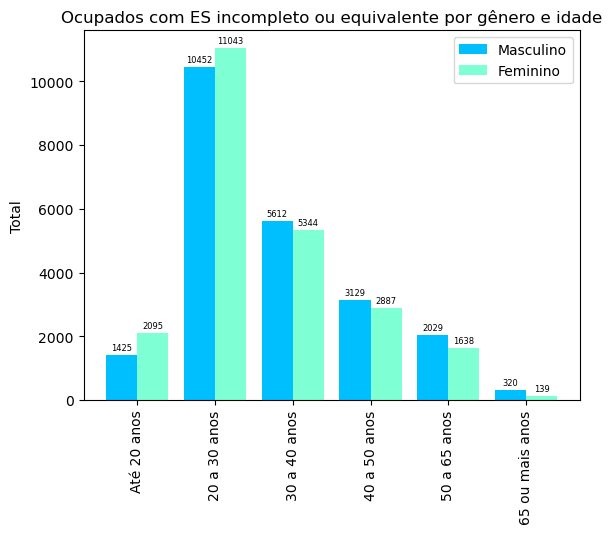

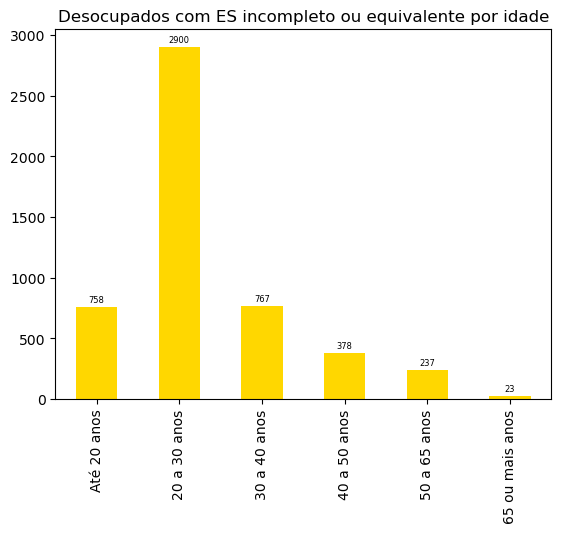

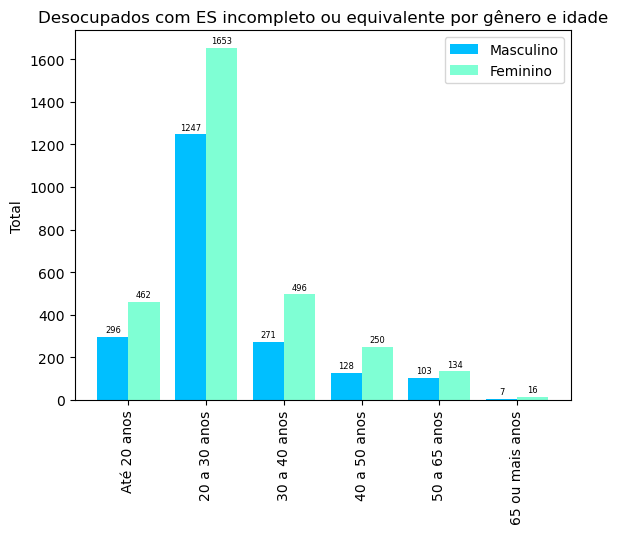

In [127]:
# 6 - Superior incompleto
graficoInstrucaoPorGenero(df_SupIncompleto, 'Entrevistados com ES completo ou equivalente por gênero')
graficoEntrevistadosPorIdade(df_SupIncompleto, 'Entrevistados com ES incompleto ou equivalente por idade')

s_ocupadosSI, s_desocupadosSI = ocupacao(df_SupIncompleto)
graficoPorGenero(s_ocupadosSI, "Gênero dos ocupados com ES incompleto ou equivalente")
graficoPorGenero(s_desocupadosSI, "Gênero dos desocupados com ES incompleto ou equivalente")
graficoEntrevistadosPorIdade(s_ocupadosSI, 'Ocupados com ES incompleto ou equivalente por idade')
graficoPorGeneroIdade(s_ocupadosSI[['V2009','V2007']], 'Ocupados com ES incompleto ou equivalente por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosSI[['V2009','V2007']],'Desocupados com ES incompleto ou equivalente por idade')
graficoPorGeneroIdade(s_desocupadosSI[['V2009','V2007']], 'Desocupados com ES incompleto ou equivalente por gênero e idade')    

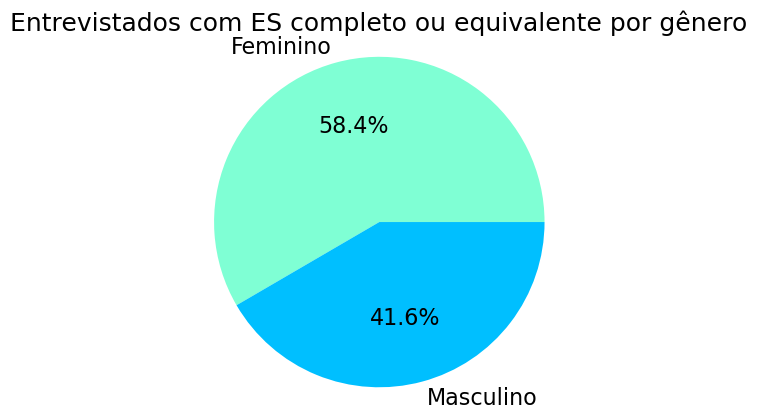

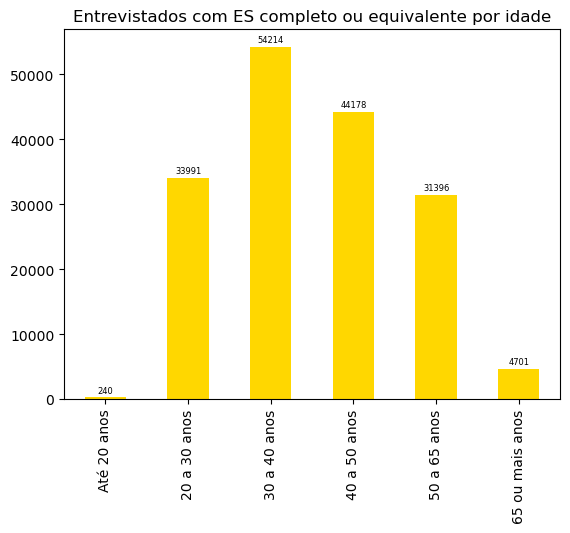

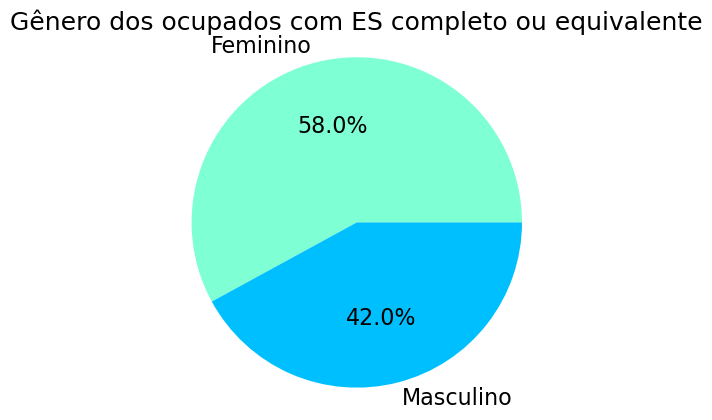

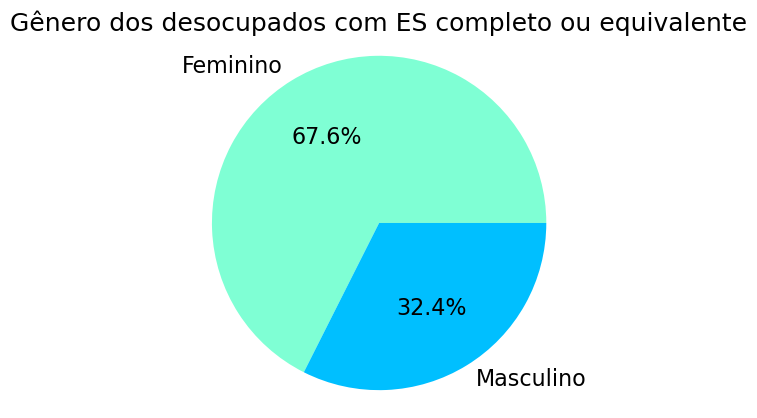

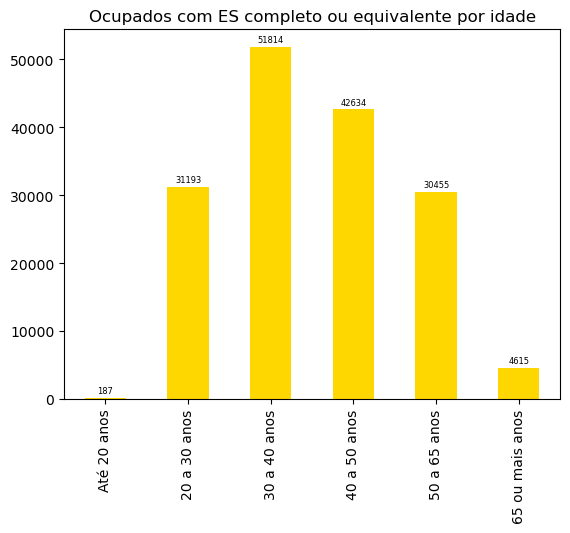

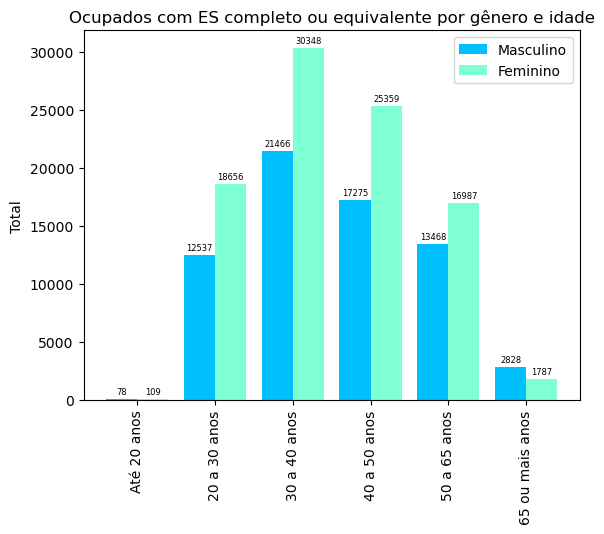

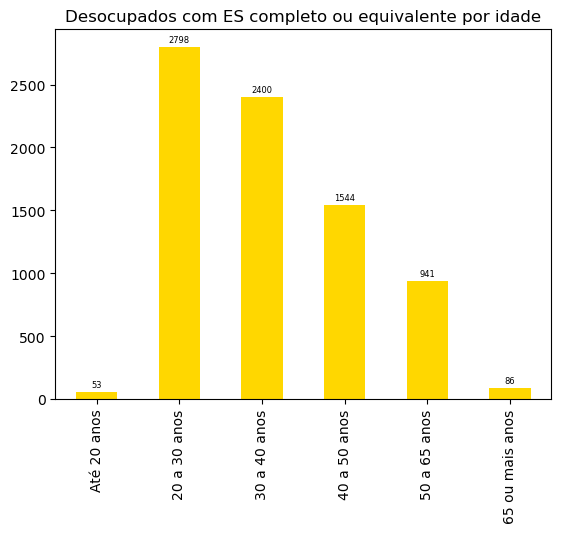

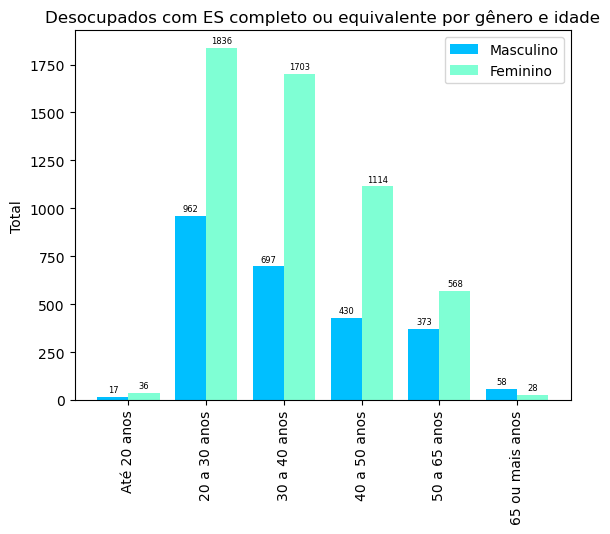

In [128]:
# 7 - Superior completo
graficoInstrucaoPorGenero(df_SupCompleto, 'Entrevistados com ES completo ou equivalente por gênero')
graficoEntrevistadosPorIdade(df_SupCompleto, 'Entrevistados com ES completo ou equivalente por idade')

s_ocupadosSC, s_desocupadosSC = ocupacao(df_SupCompleto)
graficoPorGenero(s_ocupadosSC, "Gênero dos ocupados com ES completo ou equivalente")
graficoPorGenero(s_desocupadosSC, "Gênero dos desocupados com ES completo ou equivalente")
graficoEntrevistadosPorIdade(s_ocupadosSC, 'Ocupados com ES completo ou equivalente por idade')
graficoPorGeneroIdade(s_ocupadosSC[['V2009','V2007']], 'Ocupados com ES completo ou equivalente por gênero e idade')
graficoEntrevistadosPorIdade(s_desocupadosSC[['V2009','V2007']],'Desocupados com ES completo ou equivalente por idade')
graficoPorGeneroIdade(s_desocupadosSC[['V2009','V2007']], 'Desocupados com ES completo ou equivalente por gênero e idade')

In [129]:
### Machine Learning 

In [130]:
df_ano.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 899454 entries, 0 to 899453
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   V2007      899454 non-null  int64  
 1   V2009      899454 non-null  int64  
 2   VD4002     899454 non-null  float64
 3   VD3004     899454 non-null  float64
 4   trimestre  899454 non-null  int64  
dtypes: float64(2), int64(3)
memory usage: 34.3 MB


In [131]:
df_ano.info()
df_ano = df_ano.rename(columns={'V2007':'sexo', 'V2009':'idade', 'VD4002': 'ocupacao', 'VD3004': 'grau_instrucao'})
df_ano.ocupacao = df_ano.ocupacao.astype("int")
df_ano.grau_instrucao = df_ano.grau_instrucao.astype("int")
df_ano.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 899454 entries, 0 to 899453
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   V2007      899454 non-null  int64  
 1   V2009      899454 non-null  int64  
 2   VD4002     899454 non-null  float64
 3   VD3004     899454 non-null  float64
 4   trimestre  899454 non-null  int64  
dtypes: float64(2), int64(3)
memory usage: 34.3 MB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 899454 entries, 0 to 899453
Data columns (total 5 columns):
 #   Column          Non-Null Count   Dtype
---  ------          --------------   -----
 0   sexo            899454 non-null  int64
 1   idade           899454 non-null  int64
 2   ocupacao        899454 non-null  int32
 3   grau_instrucao  899454 non-null  int32
 4   trimestre       899454 non-null  int64
dtypes: int32(2), int64(3)
memory usage: 27.4 MB


In [132]:
df_ano.to_csv(r"D:\TCC\csv\total_ano2.csv", index=False, header=True, sep=';', decimal=',')